In [1]:
library("dplyr")
library("tibble")
library("ggplot2")
library("purrr")
library("reshape2")
library("gridExtra")
library("lmtest") 
library("ggcorrplot")
library("zoo")
library("tseries")
library("forecast")


#Libraries to work with timeseries and ARIMA
library("fable")
library("tsibble")
library("urca")

library("gam")
library("gratia")
library("mgcv")

# Plotting options for the notebook
options(repr.plot.width=10, repr.plot.height=5)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric


Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

Loading required package: fabletools


Attaching package: ‘fabletools’


The following objects are masked from ‘package:forecast’:

    accuracy, forecast



Attaching package: ‘tsibble’


The following object is masked from ‘package:zoo’:

    index


The following objects are masked from ‘package:base’:

    intersect, setdiff, union


Loading required package: splines

Loading required package: foreach


Attaching package: ‘foreach’


The followi

In [2]:
#Loading the databse

df_train = as_tibble(read.csv("DailyDelhiClimateTrain.csv"))
df_test = as_tibble(read.csv("DailyDelhiClimateTest.csv"))

head(df_train, 10)

date,meantemp,humidity,wind_speed,meanpressure
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
2013-01-01,10.000000,84.50000,0.000000,1015.667
2013-01-02,7.400000,92.00000,2.980000,1017.800
2013-01-03,7.166667,87.00000,4.633333,1018.667
2013-01-04,8.666667,71.33333,1.233333,1017.167
2013-01-05,6.000000,86.83333,3.700000,1016.500
2013-01-06,7.000000,82.80000,1.480000,1018.000
2013-01-07,7.000000,78.60000,6.300000,1020.000
2013-01-08,8.857143,63.71429,7.142857,1018.714
2013-01-09,14.000000,51.25000,12.500000,1017.000


In [3]:
#Removing the pressure outliers and cleaning the data

df <- df_train
#df %>% filter(meanpressure > 1050 | meanpressure < 980)   #Questi sono gli outliers eliminati se volete vederli
df <- df %>% filter(meanpressure < 1050 & meanpressure > 980)
df$date <- as.Date(df$date)

In [4]:
date        <- as.Date(df$date)
index       <- 1:length(date)

Temperature <- df$meantemp
Humidity    <- df$humidity
Wind_Speed  <- df$wind_speed
Pressure    <- df$meanpressure

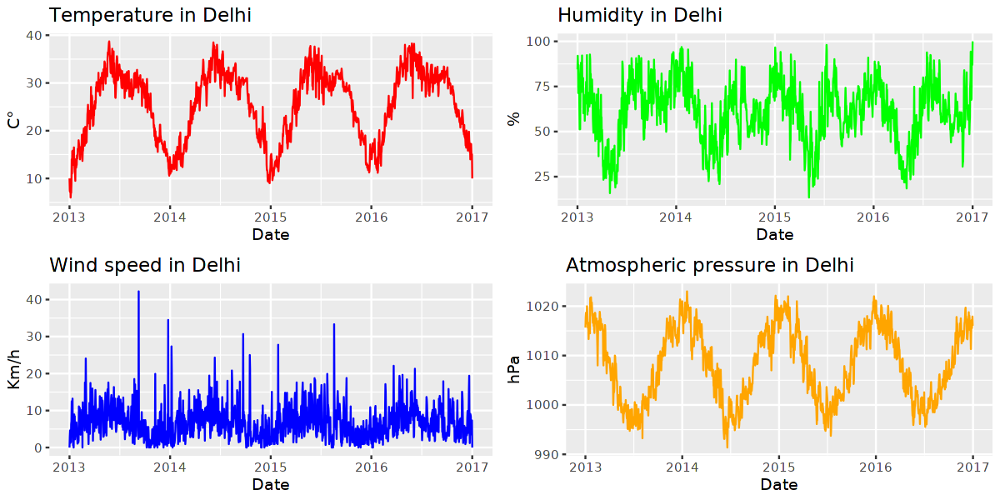

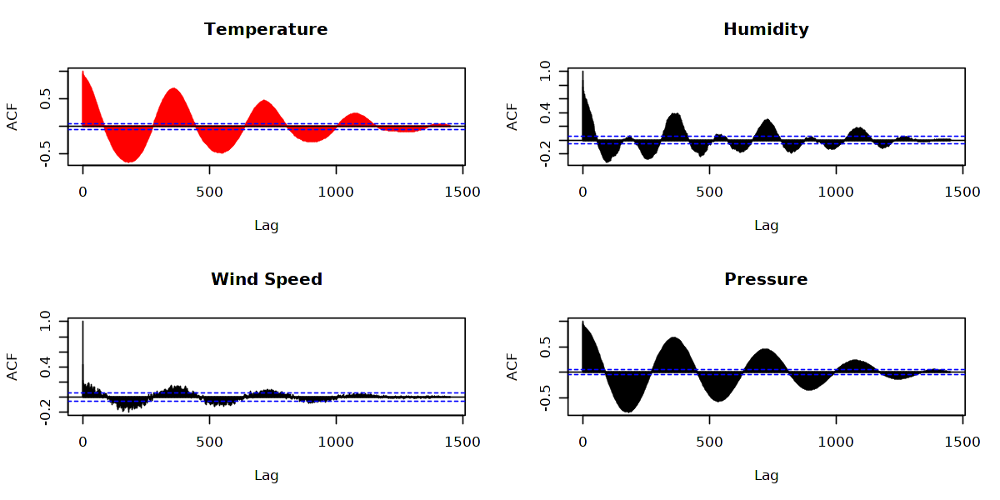

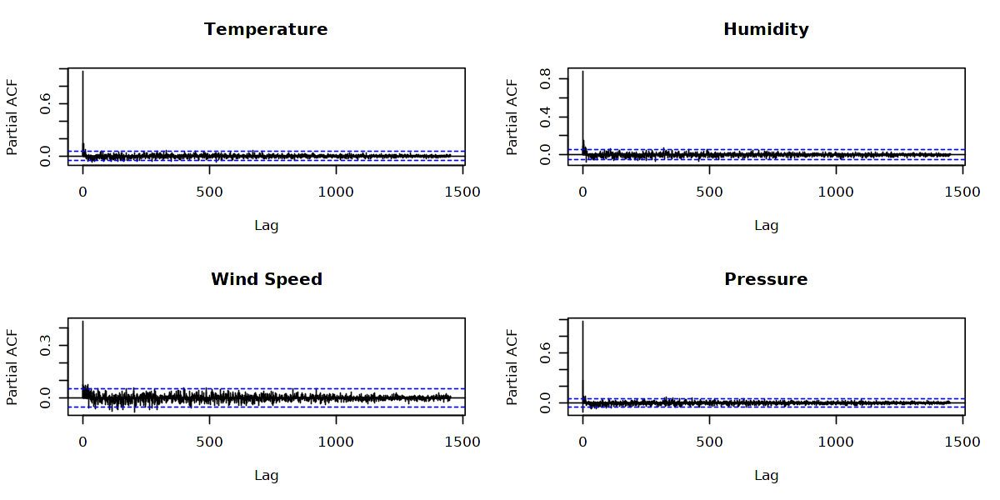

In [5]:
#Vi vanno bene di 3 colori diversi o preferite tutti neri?

meantempPlot<-ggplot(df, aes(x=date, y=meantemp))+
    geom_line(color="red")+
    ylab("C°") + 
    xlab("Date") +
    ggtitle('Temperature in Delhi')

humidityPlot<-ggplot(df, aes(x=date, y=humidity))+
    geom_line(color="green")+
    ylab("%") + 
    xlab("Date") +
    ggtitle('Humidity in Delhi')

wind_speedPlot<-ggplot(df, aes(x=date, y=wind_speed))+
    geom_line(color="blue")+
    ylab("Km/h") + 
    xlab("Date") +
    ggtitle('Wind speed in Delhi')

meanpressurePlot<-ggplot(df, aes(x=date, y=meanpressure))+
    geom_line(color="orange")+
    ylab("hPa") + 
    xlab("Date") +
    ggtitle('Atmospheric pressure in Delhi')

grid.arrange(meantempPlot, 
            humidityPlot, 
            wind_speedPlot,
            meanpressurePlot,
            nrow=2, ncol=2
            )

par(mfrow = c(2,2))

acf_meantemp<-acf(df$meantemp, main="Temperature", col="red", lag.max=10000, na.action = na.pass)
acf_humidity<-acf(df$humidity, main="Humidity",lag.max=10000, na.action = na.pass)
acf_wind_speed<-acf(df$wind_speed, main="Wind Speed",lag.max=10000, na.action = na.pass)
acf_meanpressure<-acf(df$meanpressure, main="Pressure",lag.max=10000, na.action = na.pass) #Problema con acf della pressione, colpa della rimozione degli outliers

pacf_meantemp<-pacf(df$meantemp, main="Temperature", lag.max=10000, na.action = na.pass)
pacf_humidity<-pacf(df$humidity, main="Humidity", lag.max=10000, na.action = na.pass)
pacf_wind_speed<-pacf(df$wind_speed, main="Wind Speed", lag.max=10000, na.action = na.pass)
pacf_meanpressure<-pacf(df$meanpressure, main="Pressure", lag.max=10000, na.action = na.pass) #Problema con acf della pressione, colpa della rimozione degli outliers

Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”


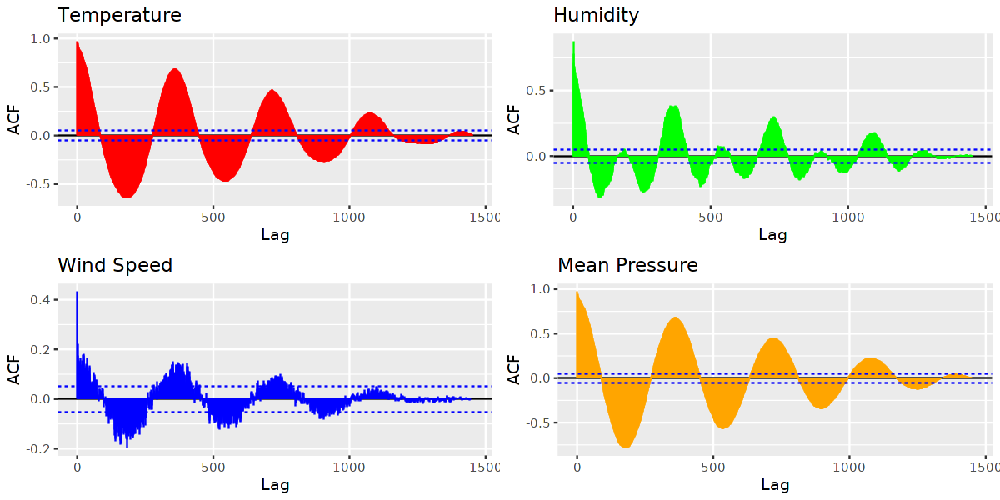

In [6]:
acf_meantempPlot<-autoplot(acf_meantemp, main = "Temperature", col="red")
acf_humidityPlot<-autoplot(acf_humidity, main = "Humidity", col="green")
acf_wind_speedPlot<-autoplot(acf_wind_speed, main = "Wind Speed", col="blue")
acf_meanpressurePlot<-autoplot(acf_meanpressure, main = "Mean Pressure", col="orange")


grid.arrange(acf_meantempPlot, 
             acf_humidityPlot, 
             acf_wind_speedPlot,
             acf_meanpressurePlot,
             nrow=2, ncol=2
            )

Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”


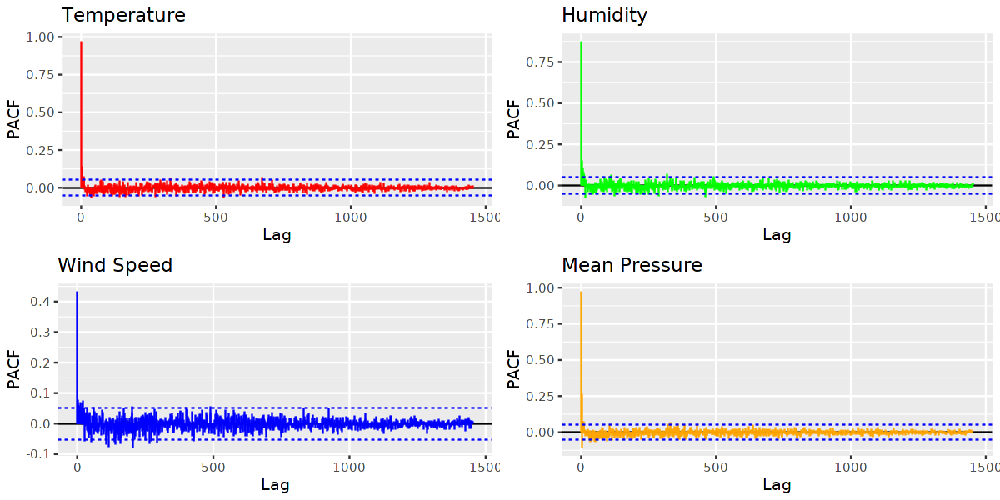

In [7]:
pacf_meantempPlot<-autoplot(pacf_meantemp, main = "Temperature", col="red")
pacf_humidityPlot<-autoplot(pacf_humidity, main = "Humidity", col="green")
pacf_wind_speedPlot<-autoplot(pacf_wind_speed, main = "Wind Speed", col="blue")
pacf_meanpressurePlot<-autoplot(pacf_meanpressure, main = "Mean Pressure", col="orange")


grid.arrange(pacf_meantempPlot, 
             pacf_humidityPlot, 
             pacf_wind_speedPlot,
             pacf_meanpressurePlot,
             nrow=2, ncol=2
            )

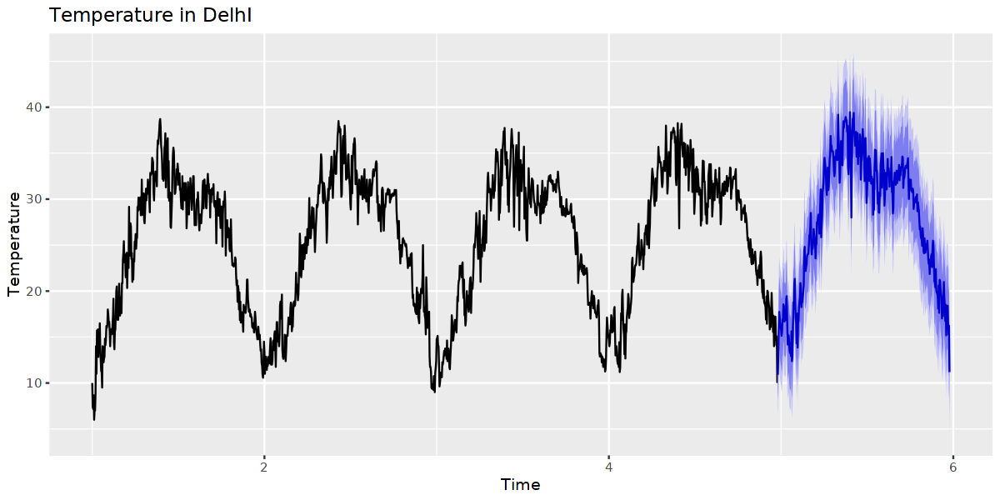

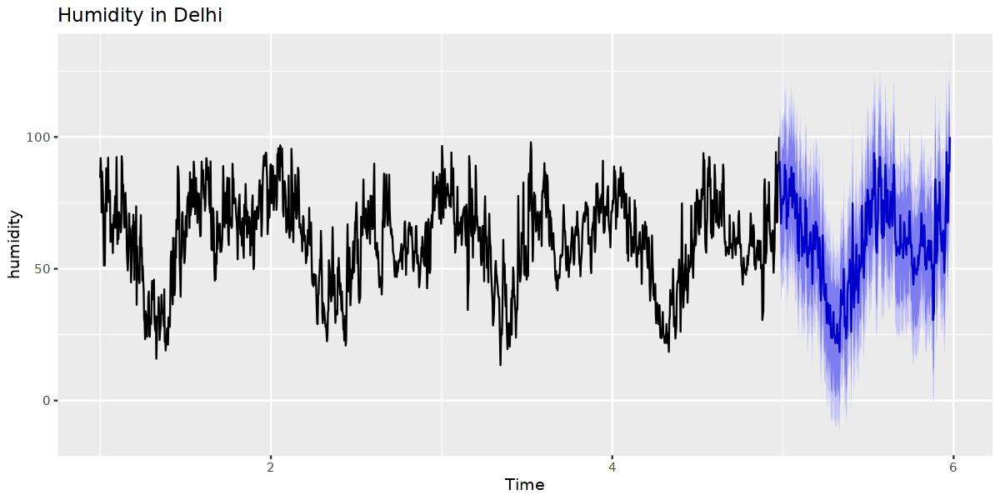

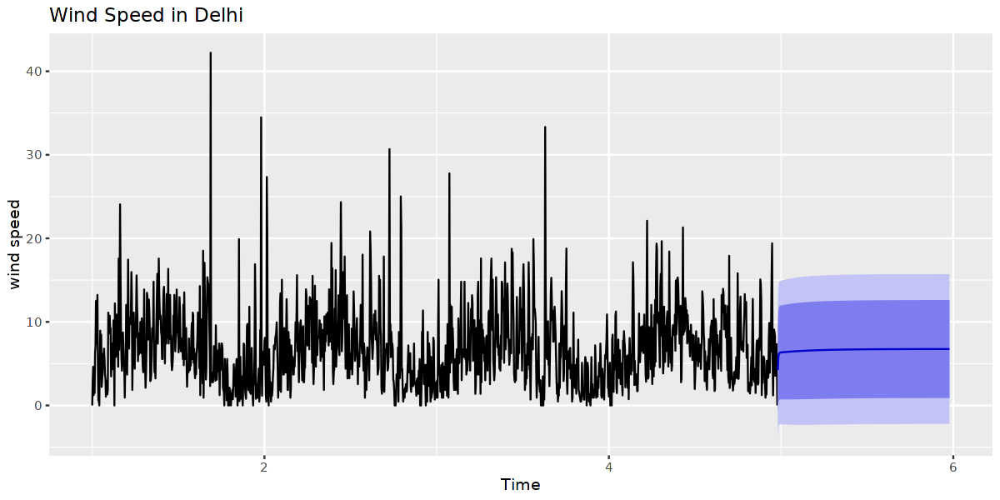

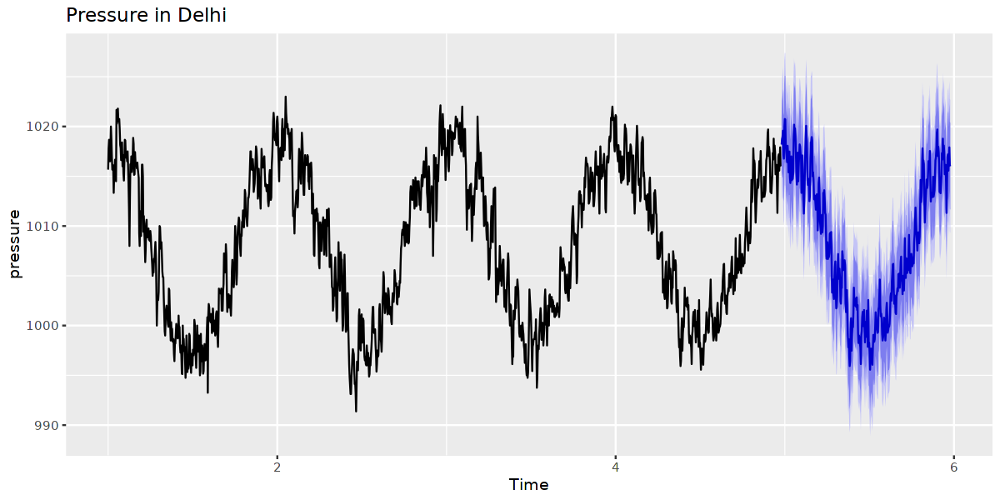

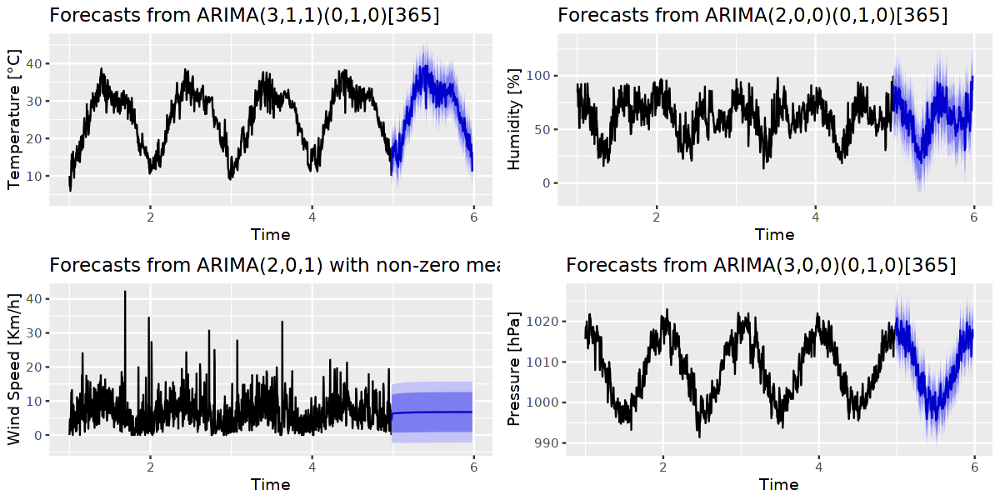

In [8]:
arima_plot <- function(vec,
                       frequency=365, h=365,
                       title="Temperature in DelhI",
                       ylab="Temperature"){
    vec.ts <- ts(vec, frequency=frequency)
    aar    <- auto.arima(vec.ts)
    fore   <- forecast::forecast(aar, h=h)
    print(autoplot(fore, ylab=ylab, main=title))

    return(aar)
}

arima.temp <- arima_plot(Temperature)
arima.hum  <- arima_plot(Humidity, title="Humidity in Delhi", ylab="humidity")
arima.ws   <- arima_plot(Wind_Speed, title="Wind Speed in Delhi", ylab="wind speed")
arima.pres <- arima_plot(Pressure, title="Pressure in Delhi", ylab="pressure")

fore.temp <- forecast::forecast(arima.temp, h=365)
fore.hum  <- forecast::forecast(arima.hum, h=365)
fore.ws   <- forecast::forecast(arima.ws, h=365)
fore.pres <- forecast::forecast(arima.pres, h=365)

pl.temp <- autoplot(fore.temp, ylab="Temperature [°C]" )
pl.hum  <- autoplot(fore.hum,  ylab="Humidity [%]"     )
pl.ws   <- autoplot(fore.ws,   ylab="Wind Speed [Km/h]")
pl.pres <- autoplot(fore.pres, ylab="Pressure [hPa]"   )

grid.arrange(pl.temp, 
             pl.hum, 
             pl.ws,
             pl.pres,
             nrow=2, ncol=2
            )

In [9]:
forecast::accuracy(fore.temp, test = df_test$meantemp)
forecast::accuracy(fore.hum,  test = df_test$humidity)
forecast::accuracy(fore.ws,   test = df_test$wind_speed)
forecast::accuracy(fore.pres, test = df_test$meanpressure)

,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,0.003058581,0.003539131,0.003114557,0.02070744,0.02129667,NaN,0.5718111


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,0.0634086,0.06435604,0.0634086,0.09999924,0.09999924,NaN,0.3888583


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,0.1118947,3.754337,3.043958,-Inf,Inf,NaN,0.09798108


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,0.05921059,1.52451,1.242476,0.005752711,0.1230542,NaN,0.02466522



Attaching package: ‘psych’


The following objects are masked from ‘package:ggplot2’:

    %+%, alpha




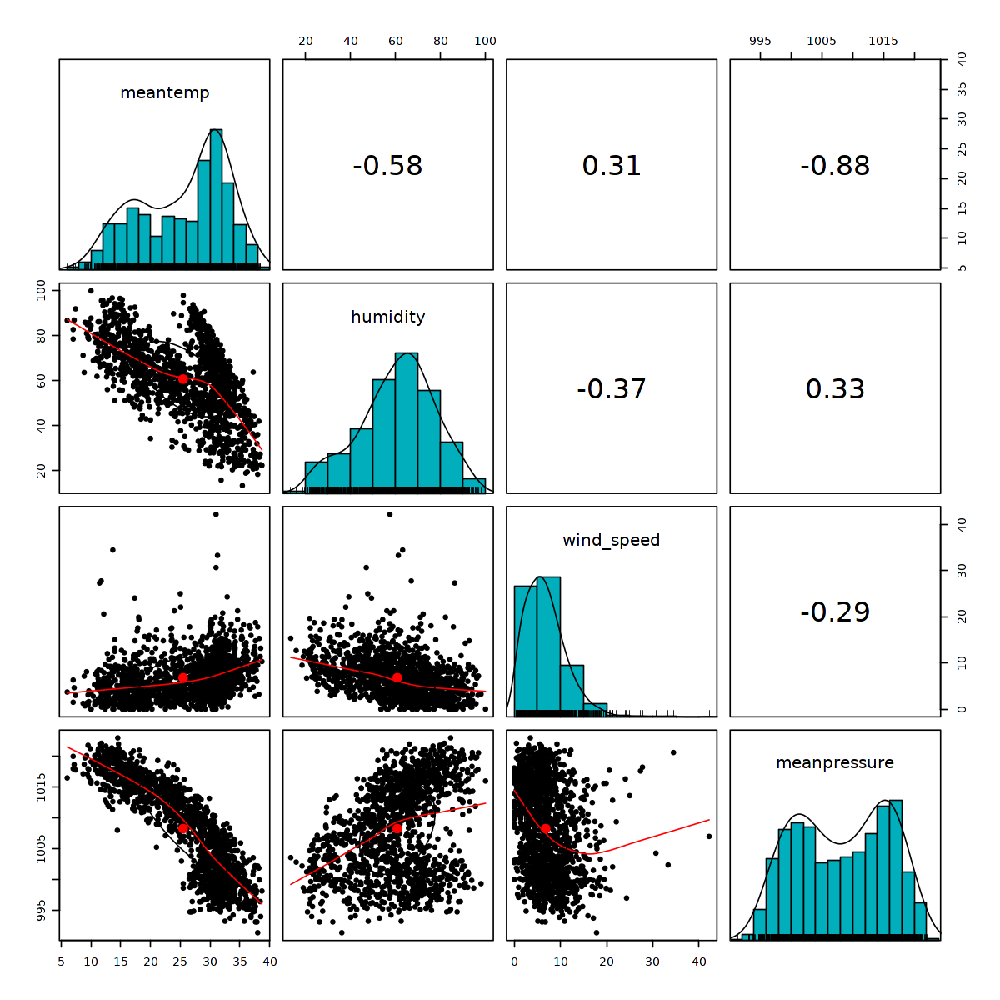

In [10]:
library(psych)

# Plotting options for the notebook
options(repr.plot.width=10, repr.plot.height=10)

pairs.panels(df[2:5],
             method = "pearson", # correlation method
             hist.col = "#00AFBB",
             density = TRUE,  # show density plots
             ellipses = TRUE # show correlation ellipses
             )

In [11]:
# Plotting options for the notebook
options(repr.plot.width=10, repr.plot.height=10)


gam.fit <- function(vec1, vec2, vec3, vec4, col1, col2, col3, col4){
    tt <- 1:length(vec1)
    seasonality <- factor(c(rep(1:365,length(vec1)/365),1:358)) 

    gam.fitted <- gamm(vec1~s(tt)+seasonality+s(vec2)+s(vec3)+s(vec4))
    print(summary(gam.fitted))

    print(draw(gam.fitted))
    return(gam.fitted)
}




    Length Class Mode
lme 18     lme   list
gam 31     gam   list


$lme
Linear mixed-effects model fit by maximum likelihood
  Data: strip.offset(mf) 
  Log-likelihood: -2551.577
  Fixed: y ~ X - 1 
   X(Intercept)   Xseasonality2   Xseasonality3   Xseasonality4   Xseasonality5 
    18.34219274     -0.44080464     -0.70185817     -0.72400971     -1.42237693 
  Xseasonality6   Xseasonality7   Xseasonality8   Xseasonality9  Xseasonality10 
    -1.13428544     -1.49068864     -1.84480724     -1.25999059     -1.78646973 
 Xseasonality11  Xseasonality12  Xseasonality13  Xseasonality14  Xseasonality15 
    -0.43445037      0.03929254      0.56517871      0.20172201     -0.09179318 
 Xseasonality16  Xseasonality17  Xseasonality18  Xseasonality19  Xseasonality20 
     0.16121065      0.68899417      0.08310708      0.59454584      0.14727442 
 Xseasonality21  Xseasonality22  Xseasonality23  Xseasonality24  Xseasonality25 
     0.04297629      0.61603950      1.68119575      0.26415050     -0.72185263 
 Xseasonality26  Xseasonality27  Xseasonality28  Xseasonal

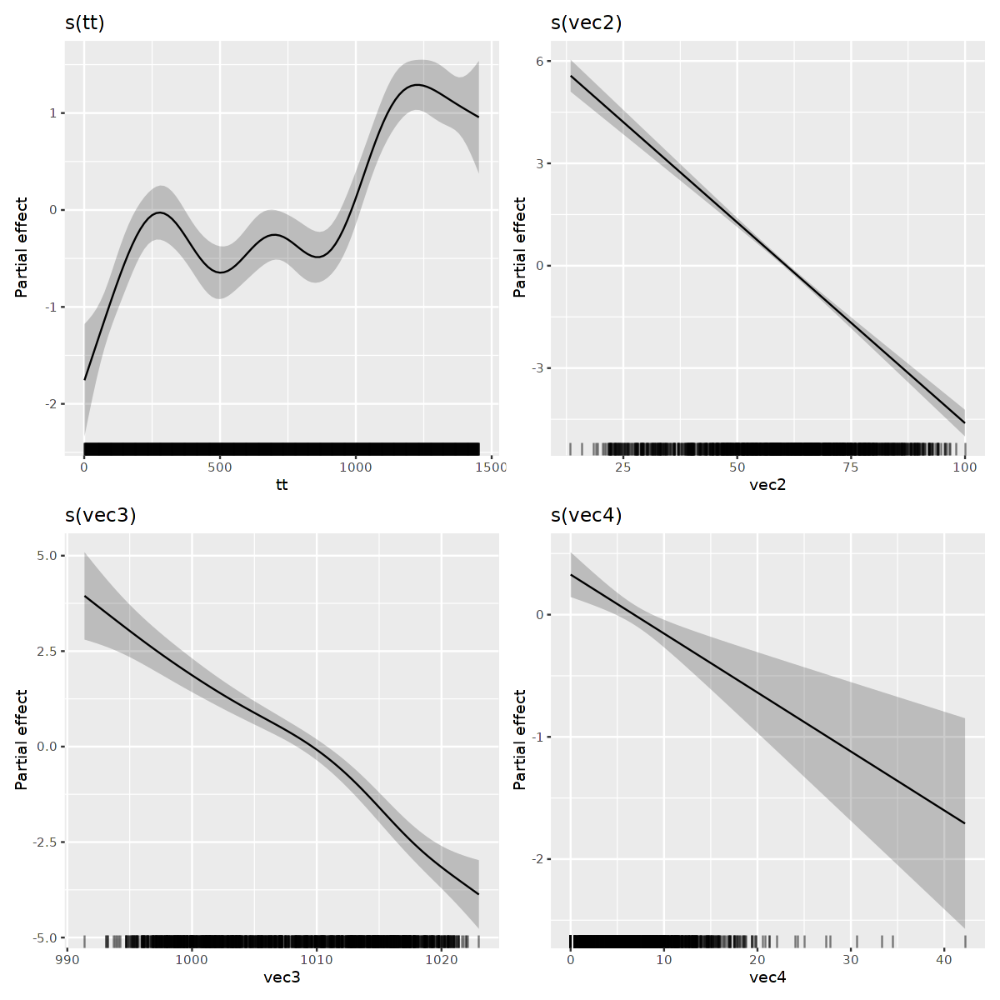

In [12]:
gam.fit(Temperature, Humidity, Pressure, Wind_Speed)

In [13]:
s(tt)

$term
[1] "tt"

$bs.dim
[1] -1

$fixed
[1] FALSE

$dim
[1] 1

$p.order
[1] NA

$by
[1] "NA"

$label
[1] "s(tt)"

$xt
NULL

$id
NULL

$sp
NULL

attr(,"class")
[1] "tp.smooth.spec"

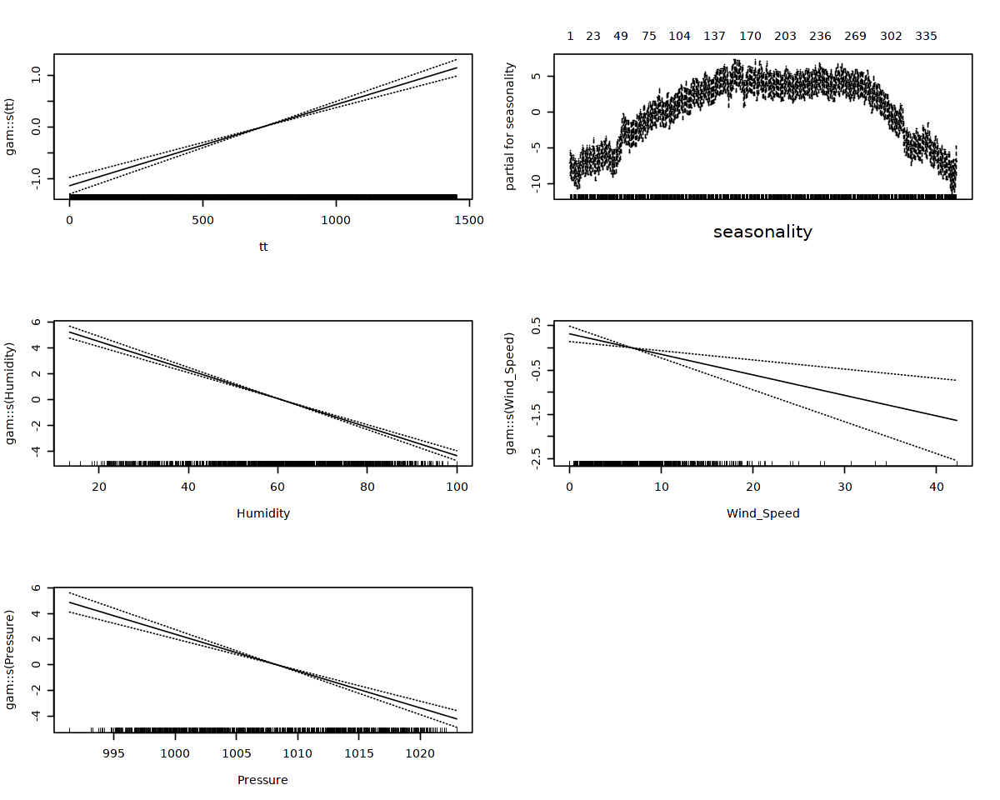

In [14]:
par(mfrow=c(3, 2))

# Plotting options for the notebook
options(repr.plot.width=10, repr.plot.height=8)


tt <- 1:length(Temperature)
seasonality <- factor(c(rep(1:365,length(Temperature)/365),1:358)) 

gam.fitted.temp <- gam::gam(Temperature~gam::s(tt)+ seasonality+gam::s(Humidity)+gam::s(Wind_Speed)+gam::s(Pressure))
plot(gam.fitted.temp, se=T)


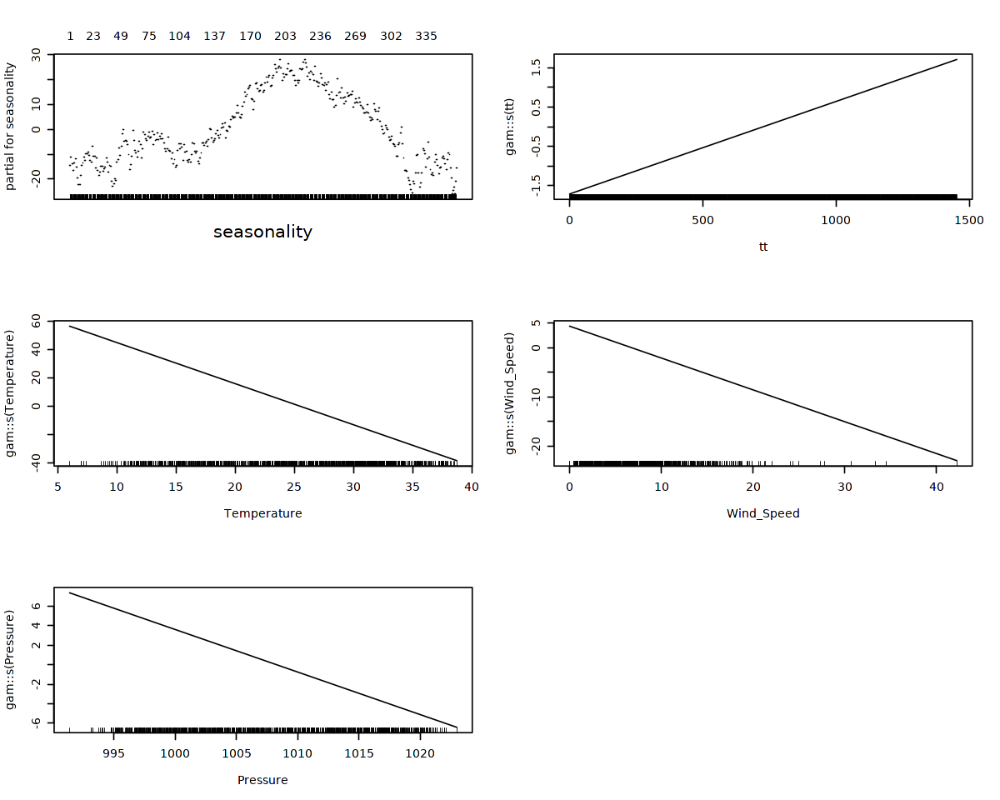

In [15]:
par(mfrow=c(3, 2))

gam.fitted.hum <- gam::gam(Humidity~seasonality+gam::s(tt)+gam::s(Temperature)+gam::s(Wind_Speed)+gam::s(Pressure))
plot(gam.fitted.hum)


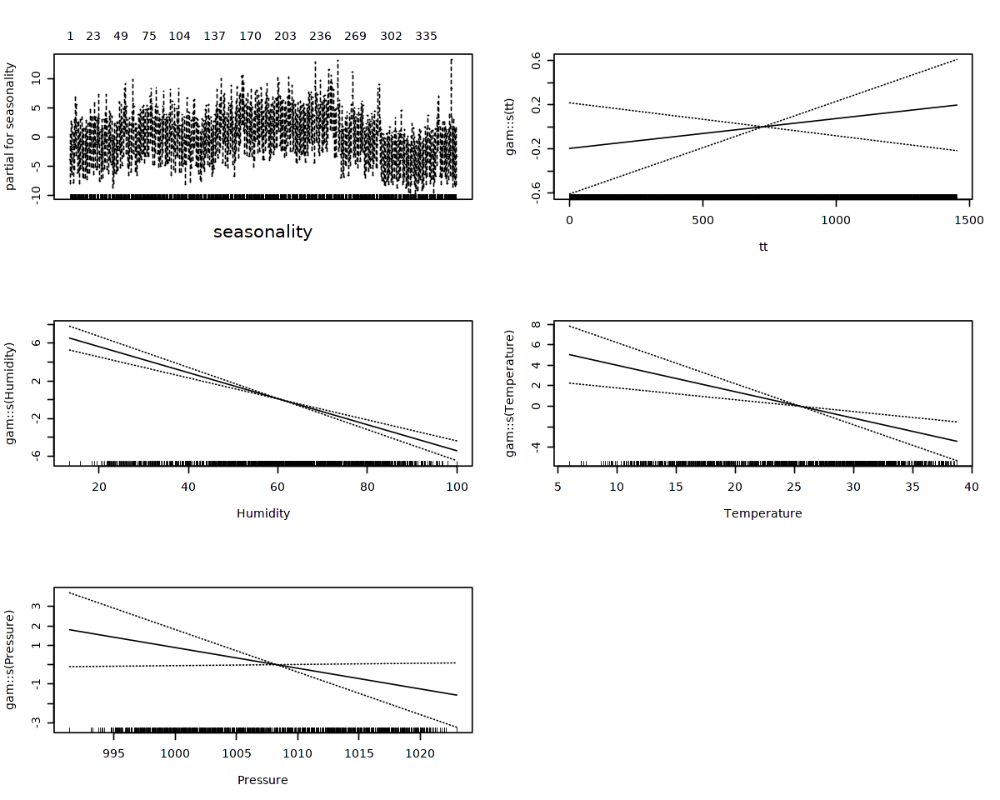

In [16]:
par(mfrow=c(3, 2))

gam.fitted.ws <- gam::gam(Wind_Speed~seasonality+gam::s(tt)+gam::s(Humidity)+gam::s(Temperature)+gam::s(Pressure))
plot(gam.fitted.ws, se=T)

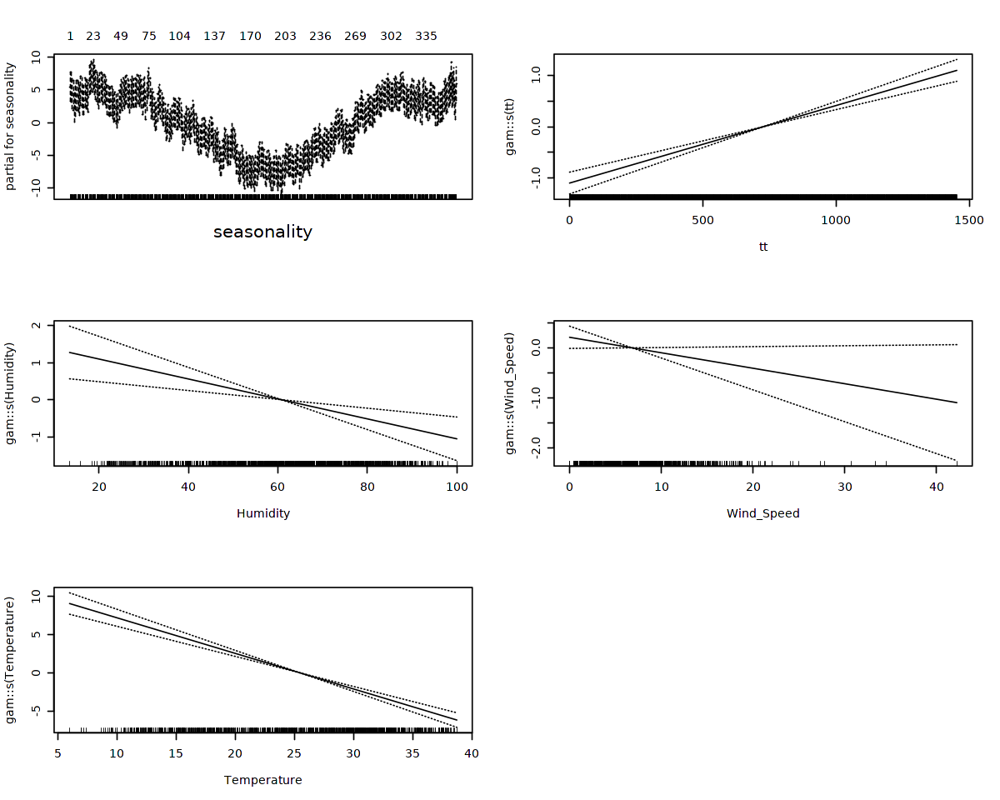

In [17]:
par(mfrow=c(3, 2))

gam.fitted.pres <- gam::gam(Pressure~seasonality+gam::s(tt)+gam::s(Humidity)+gam::s(Wind_Speed)+gam::s(Temperature))
plot(gam.fitted.pres, se=T)

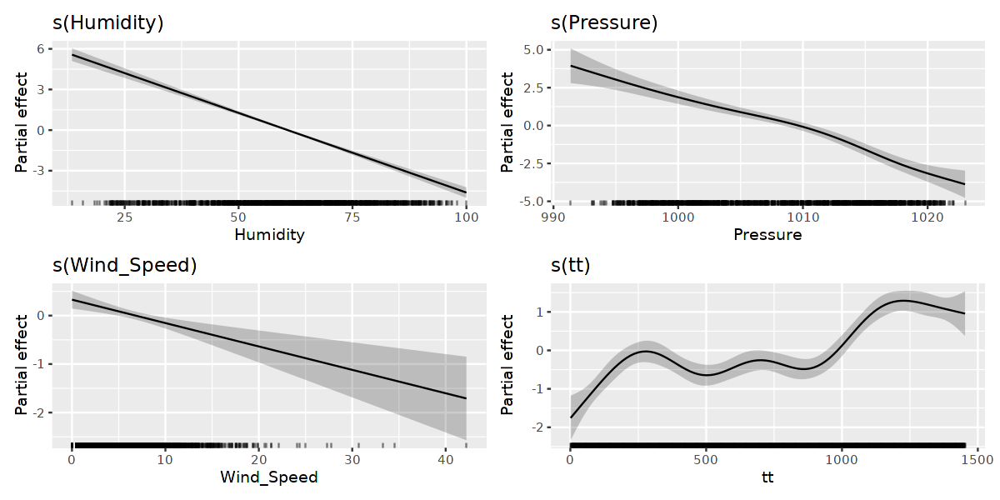

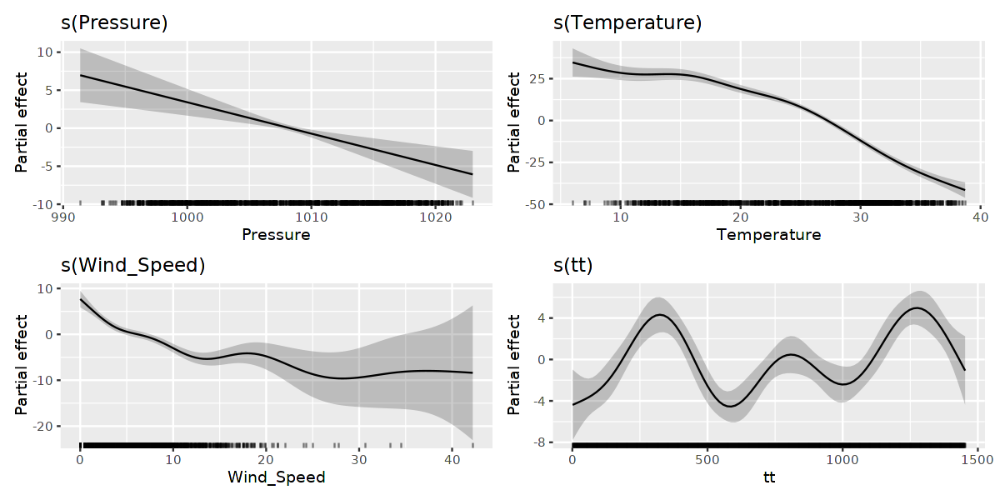

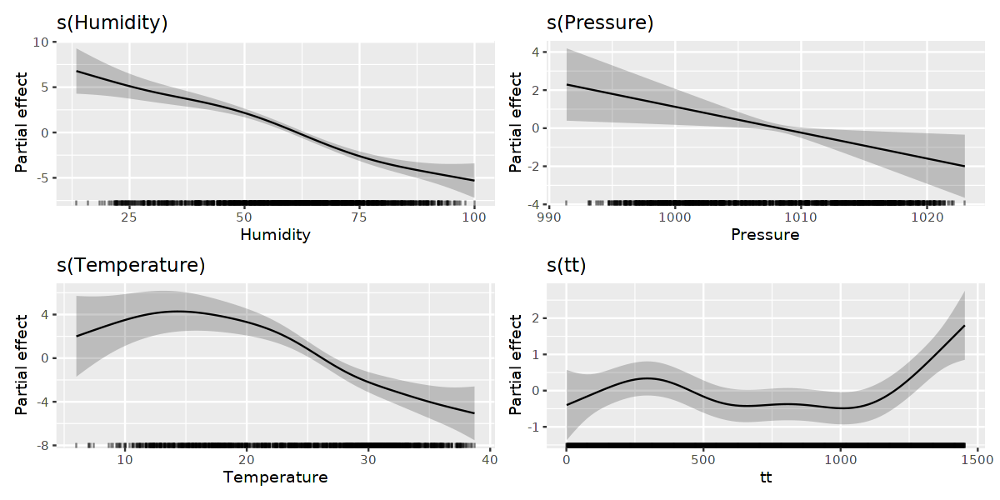

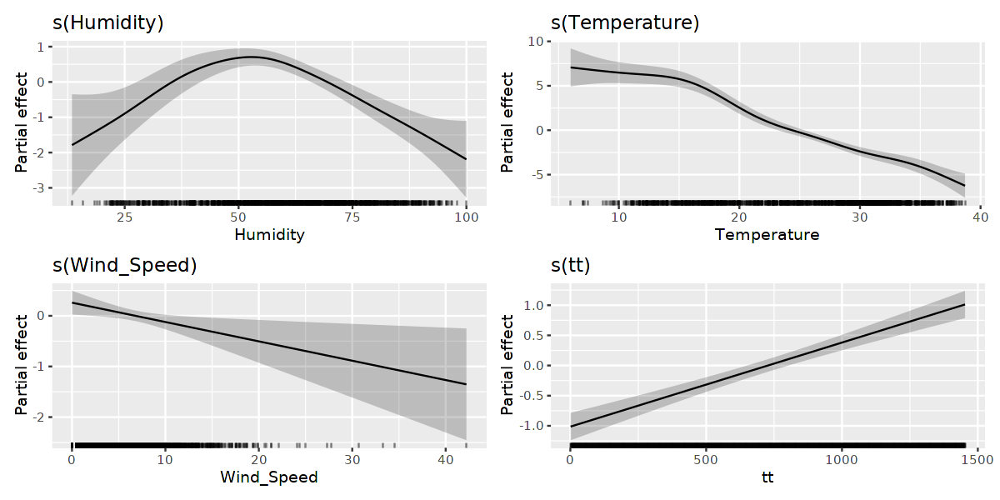

In [18]:
par(mfrow=c(2, 2))

# Plotting options for the notebook
options(repr.plot.width=10, repr.plot.height=5)

tt <- 1:length(Temperature)
seasonality <- factor(c(rep(1:365,length(Temperature)/365),1:358)) 

gam.fitted.temp <- gamm(Temperature~seasonality+s(tt)+s(Humidity)+s(Wind_Speed)+s(Pressure))
print(draw(gam.fitted.temp))

gam.fitted.hum <- gamm(Humidity~seasonality+s(tt)+s(Temperature)+s(Wind_Speed)+s(Pressure))
print(draw(gam.fitted.hum))

gam.fitted.ws <- gamm(Wind_Speed~seasonality+s(tt)+s(Humidity)+s(Temperature)+s(Pressure))
print(draw(gam.fitted.ws))

gam.fitted.pres <- gamm(Pressure~seasonality+s(tt)+s(Humidity)+s(Wind_Speed)+s(Temperature))
print(draw(gam.fitted.pres))

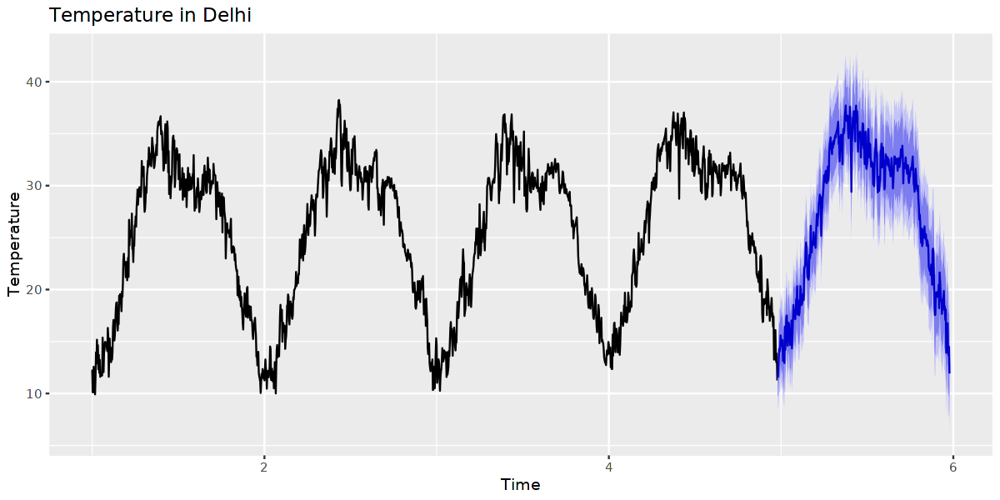

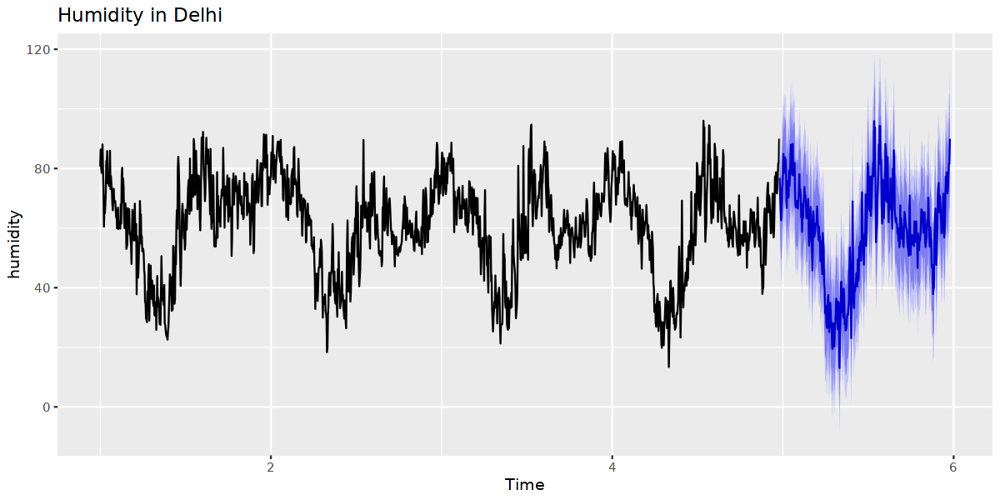

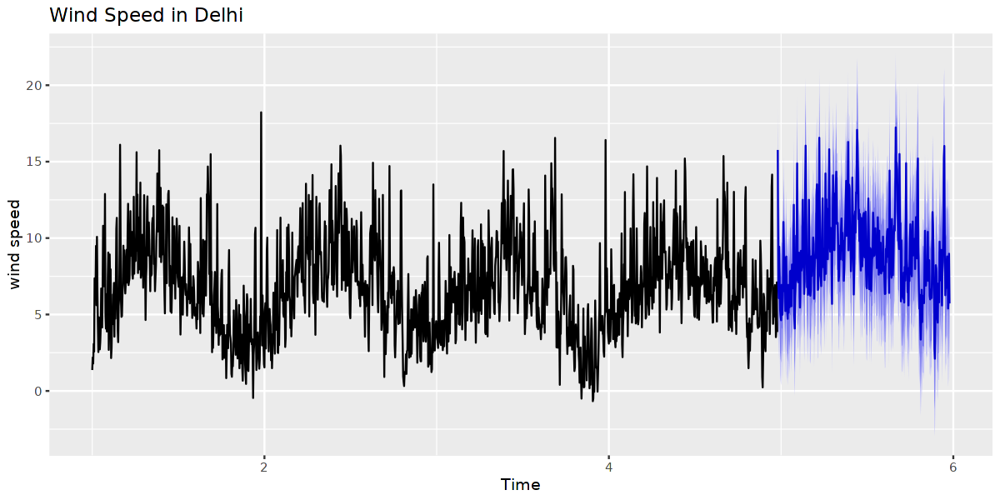

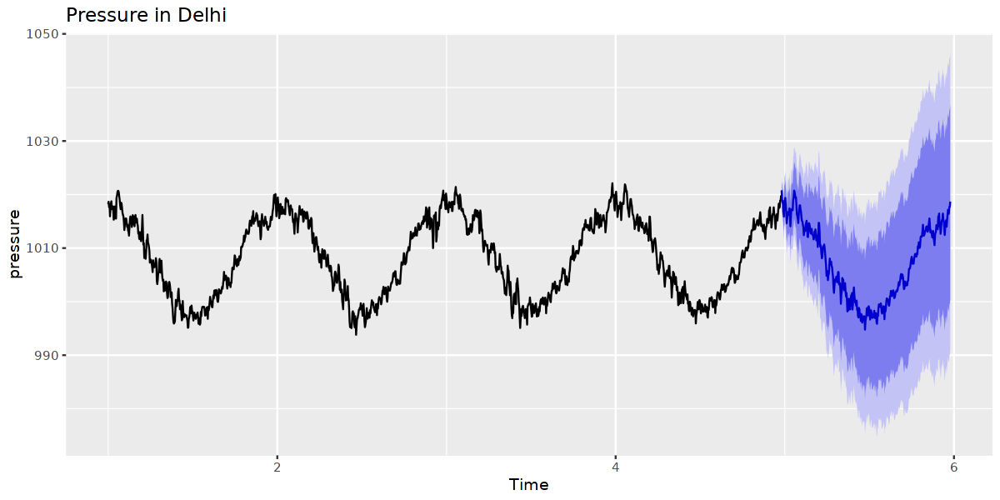

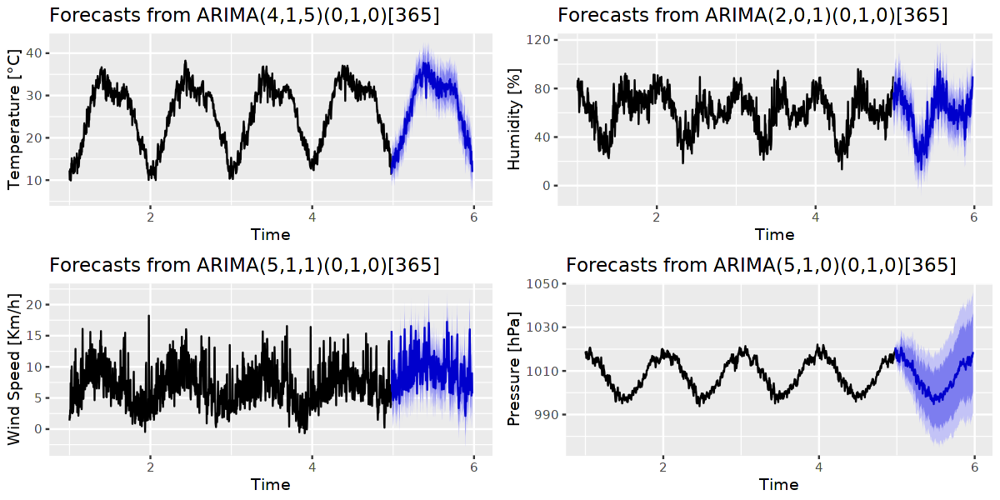

In [19]:
arima_plot <- function(vec,
                       frequency=365, h=365,
                       title="Temperature in Delhi",
                       ylab="Temperature"){
    vec.ts <- ts(vec, frequency=frequency)
    aar    <- auto.arima(vec.ts)
    fore   <- forecast::forecast(aar, h=h)
    print(autoplot(fore, ylab=ylab, main=title))

    return(aar)
}

arima.temp <- arima_plot(as.vector(gam.fitted.temp$gam$fitted))
arima.hum  <- arima_plot(as.vector(gam.fitted.hum$gam$fitted), title="Humidity in Delhi", ylab="humidity")
arima.ws   <- arima_plot(as.vector(gam.fitted.ws$gam$fitted), title="Wind Speed in Delhi", ylab="wind speed")
arima.pres <- arima_plot(as.vector(gam.fitted.pres$gam$fitted), title="Pressure in Delhi", ylab="pressure")

fore.temp <- forecast::forecast(arima.temp, h=365)
fore.hum  <- forecast::forecast(arima.hum, h=365)
fore.ws   <- forecast::forecast(arima.ws, h=365)
fore.pres <- forecast::forecast(arima.pres, h=365)

pl.temp <- autoplot(fore.temp, ylab="Temperature [°C]" )
pl.hum  <- autoplot(fore.hum,  ylab="Humidity [%]"     )
pl.ws   <- autoplot(fore.ws,   ylab="Wind Speed [Km/h]")
pl.pres <- autoplot(fore.pres, ylab="Pressure [hPa]"   )

grid.arrange(pl.temp, 
             pl.hum, 
             pl.ws,
             pl.pres,
             nrow=2, ncol=2
            )

In [20]:
### METRICS
forecast::accuracy(fore.temp, test = df_test$meantemp)
forecast::accuracy(fore.hum,  test = df_test$humidity)
forecast::accuracy(fore.ws,   test = df_test$wind_speed)
forecast::accuracy(fore.pres, test = df_test$meanpressure)

,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,0.001331805,0.001852892,0.001417351,0.009114083,0.009849061,NaN,0.4645714


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,0.06184882,0.06231196,0.06184882,0.09999742,0.09999742,NaN,0.4709051


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,0.002431303,0.003364244,0.002745285,0.03433607,0.04546142,NaN,0.1578515


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,-0.1270206,0.5534856,0.4660311,-0.0125763,0.04616512,NaN,0.003945964


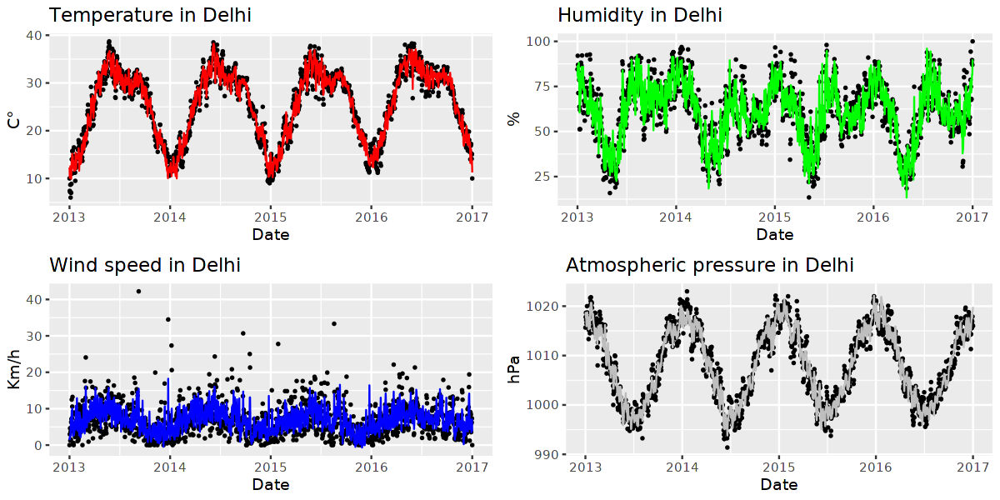

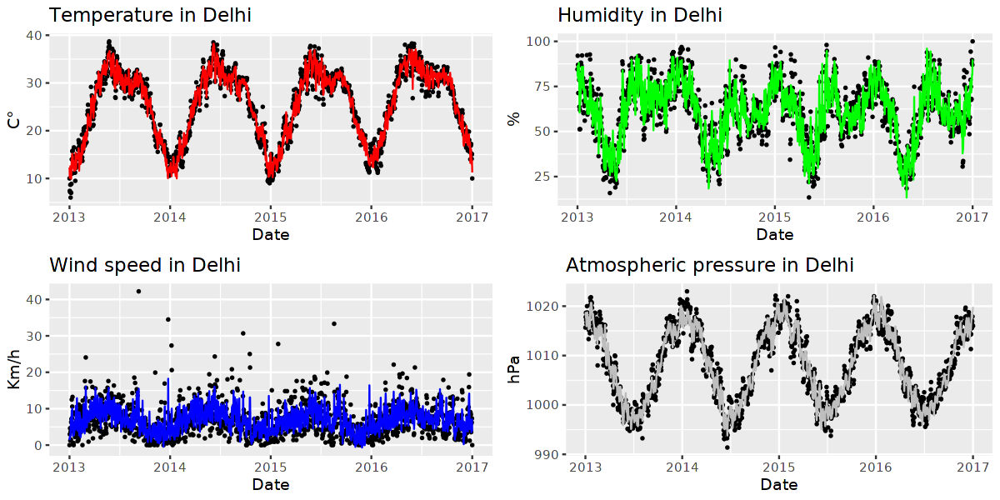

In [21]:
hum.gam <- as.vector(gam.fitted.hum$gam$fitted)
temp.gam <- as.vector(gam.fitted.temp$gam$fitted)
pres.gam <- as.vector(gam.fitted.pres$gam$fitted)
ws.gam <- as.vector(gam.fitted.ws$gam$fitted)

humidity.gam<-data.frame(date, hum.gam   )
temperature.gam<-data.frame(date, temp.gam)
pressure.gam<-data.frame(date, pres.gam   )
wind_speed.gam<-data.frame(date, ws.gam )



meantempPlot<-ggplot(df, aes(x=date, y=meantemp))+
    geom_point(size=.5)+
    ylab("C°") + 
    xlab("Date") +
    ggtitle('Temperature in Delhi')+
    geom_line(data=temperature.gam, aes(x=date, y=temp.gam), color="red")

humidityPlot<-ggplot(df, aes(x=date, y=humidity))+
    geom_point(size=.5)+
    ylab("%") + 
    xlab("Date") +
    ggtitle('Humidity in Delhi')+
    geom_line(data=humidity.gam, aes(x=date, y=hum.gam), color="green")

wind_speedPlot<-ggplot(df, aes(x=date, y=wind_speed))+
    geom_point(size=.5)+
    ylab("Km/h") + 
    xlab("Date") +
    ggtitle('Wind speed in Delhi')+
    geom_line(data=wind_speed.gam, aes(x=date, y=ws.gam), color="blue")

meanpressurePlot<-ggplot(df, aes(x=date, y=meanpressure))+
    geom_point(size=.5)+
    ylab("hPa") + 
    xlab("Date") +
    ggtitle('Atmospheric pressure in Delhi')+
    geom_line(data=pressure.gam, aes(x=date, y=pres.gam), color="gray")

grid.arrange(meantempPlot, 
            humidityPlot, 
            wind_speedPlot,
            meanpressurePlot,
            nrow=2, ncol=2
            )

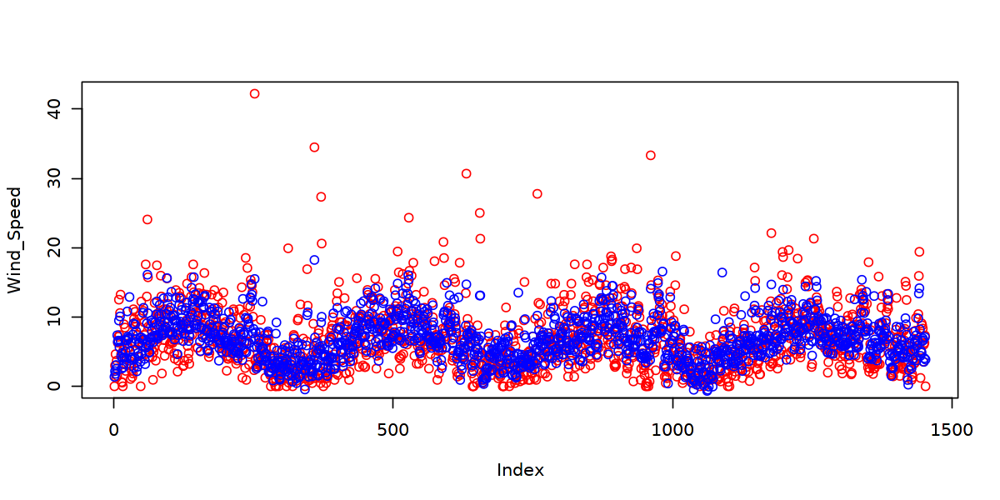

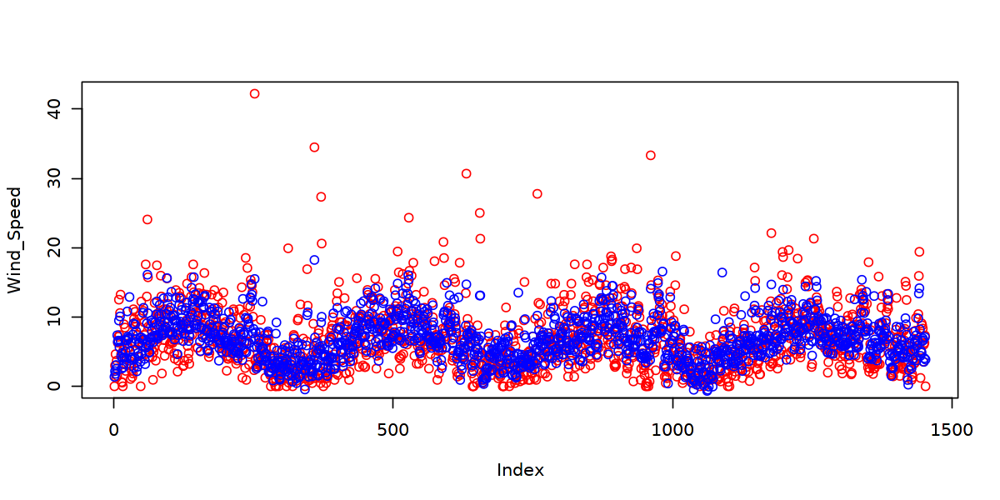

In [22]:
plot(Wind_Speed, col="red")
points(as.vector(gam.fitted.ws$gam$fitted), col="blue")

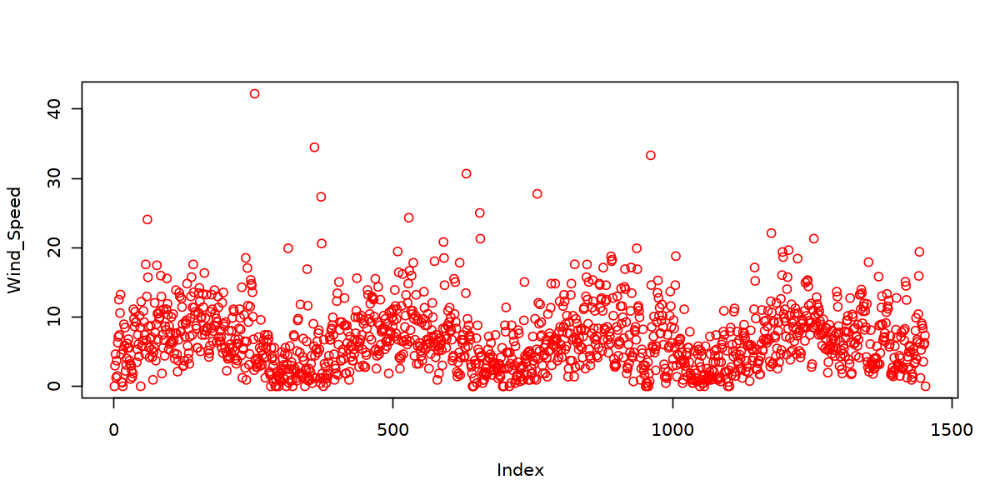

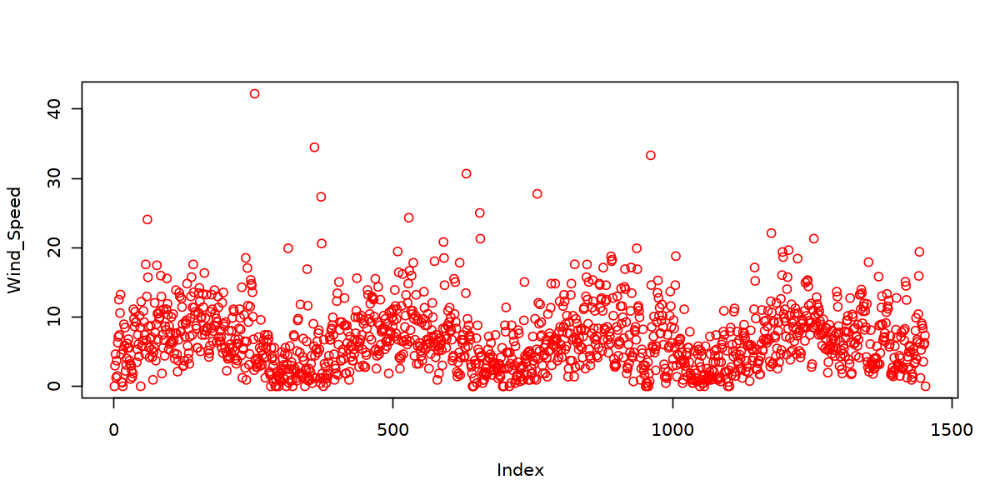

In [23]:
plot(Wind_Speed, col="red")
#points(as.vector(gam.fitted.ws$gam$fitted), col="blue")
points(as.vector(gam.fitted.ws$fitted), col="blue")

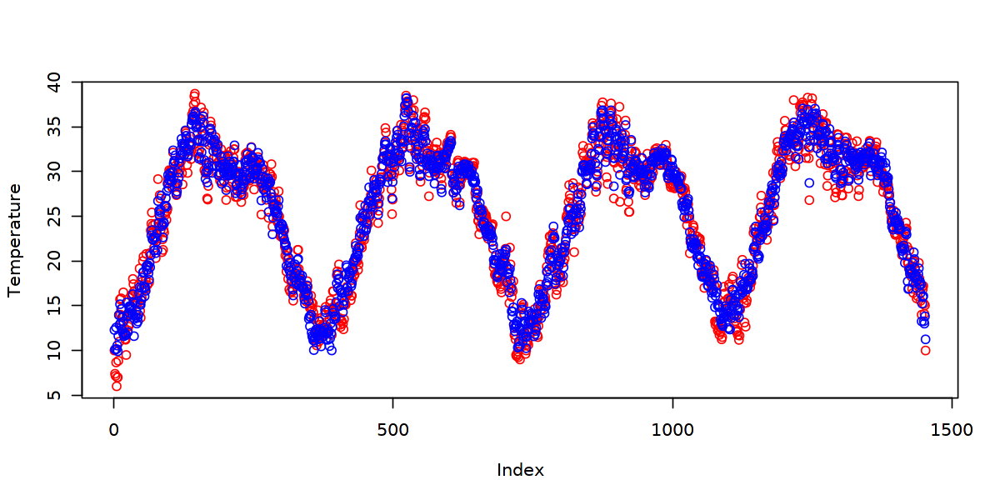

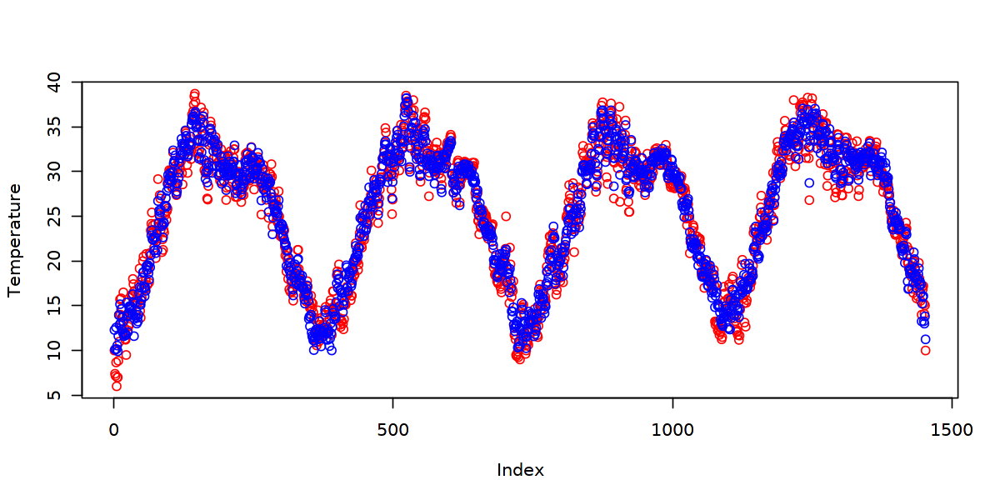

In [24]:
plot(Temperature, col="red")
points(as.vector(gam.fitted.temp$gam$fitted), col="blue")

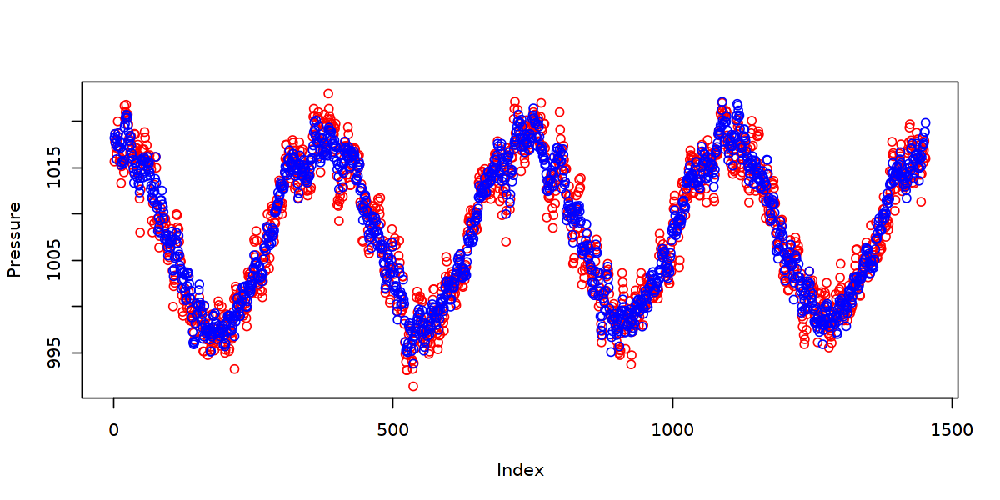

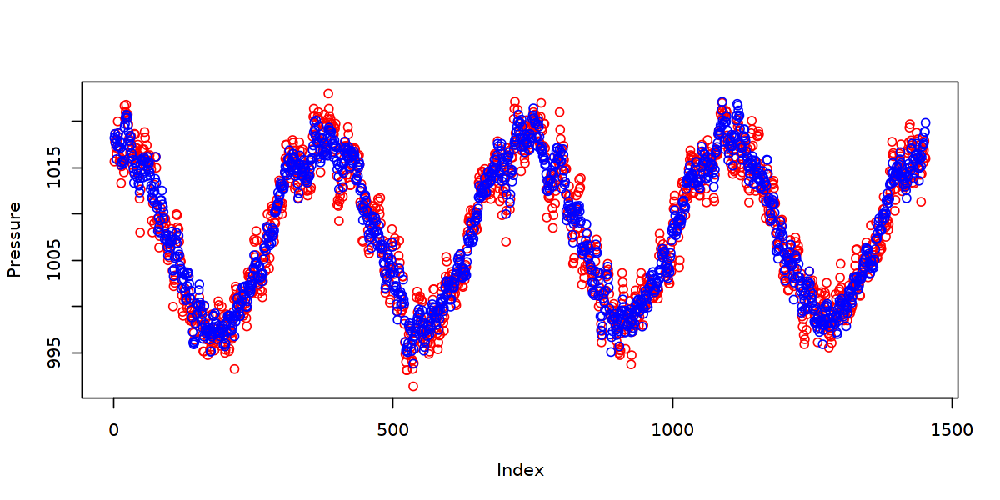

In [25]:
plot(Pressure, col="red")
points(as.vector(gam.fitted.pres$gam$fitted), col="blue")

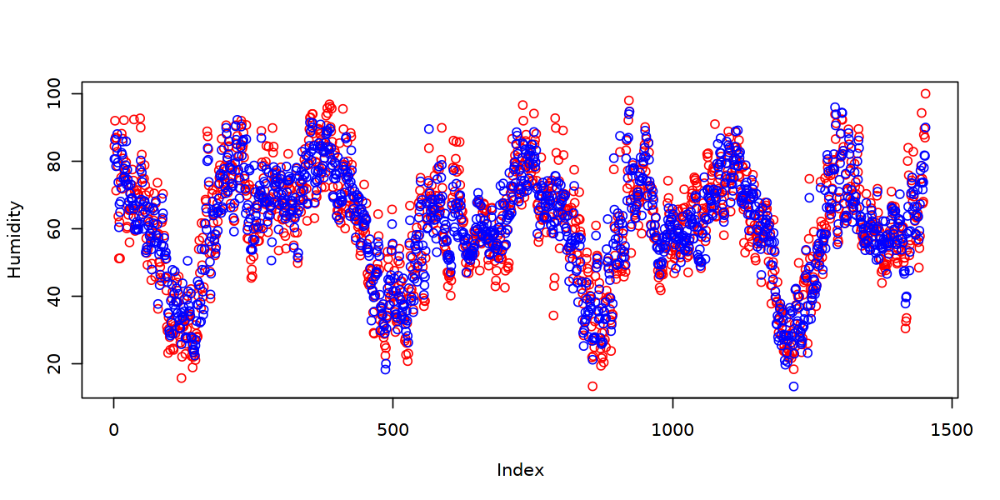

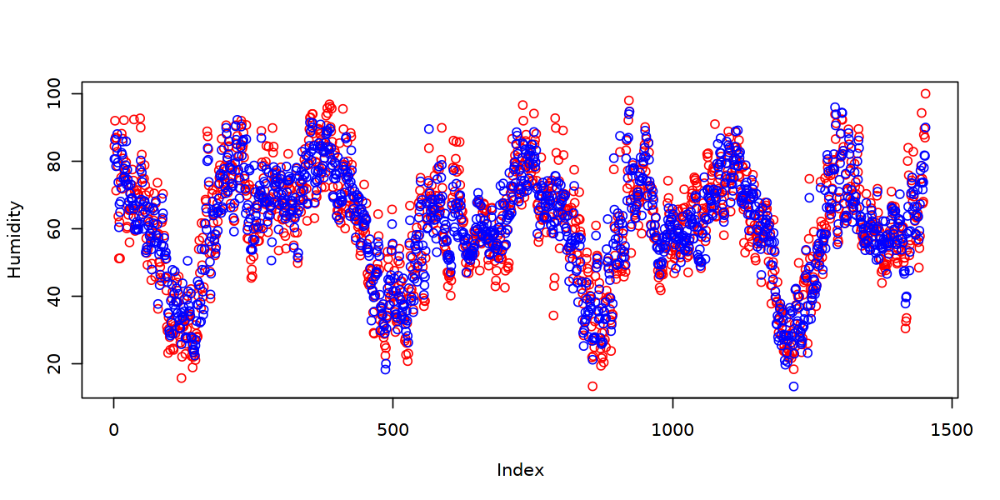

In [26]:
plot(Humidity, col="red")
points(as.vector(gam.fitted.hum$gam$fitted), col="blue")

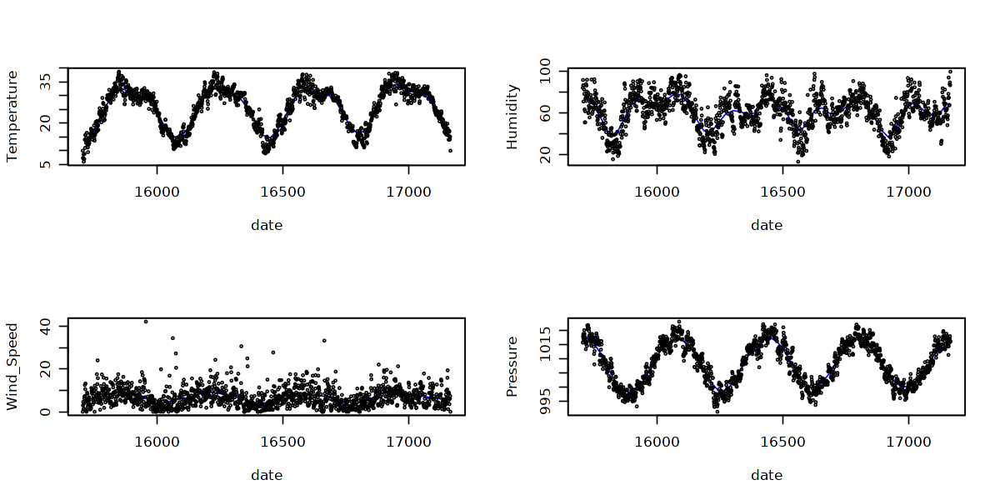

Package 'sm', version 2.2-5.7: type help(sm) for summary information



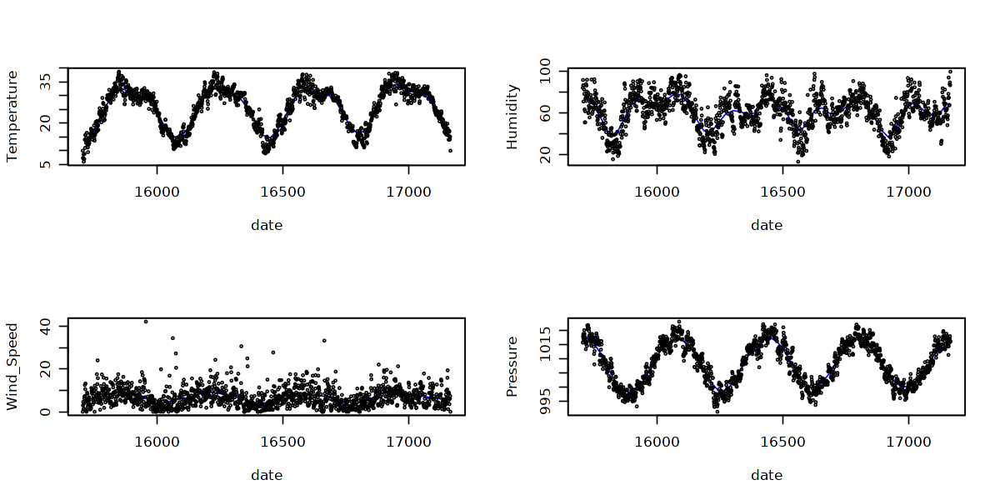

In [28]:
library(sm)

par(mfrow=c(2, 2))

temp.smooth <- sm.regression(date, Temperature, h = 25, col="blue")
hum.smooth  <- sm.regression(date, Humidity,    h = 25, col="blue")
ws.smooth   <- sm.regression(date, Wind_Speed,  h = 25, col="blue")
pres.smooth <- sm.regression(date, Pressure,    h = 25, col="blue")

In [29]:
humidity.sm<-as.data.frame(lowess(Humidity, f=.1))
humidity.sm$x<-date

temperature.sm<-as.data.frame(lowess(Temperature, f=.1))
temperature.sm$x<-date

pressure.sm<-as.data.frame(lowess(Pressure, f=.1))
pressure.sm$x<-date

wind_speed.sm<-as.data.frame(lowess(Wind_Speed, f=.1))
wind_speed.sm$x<-date

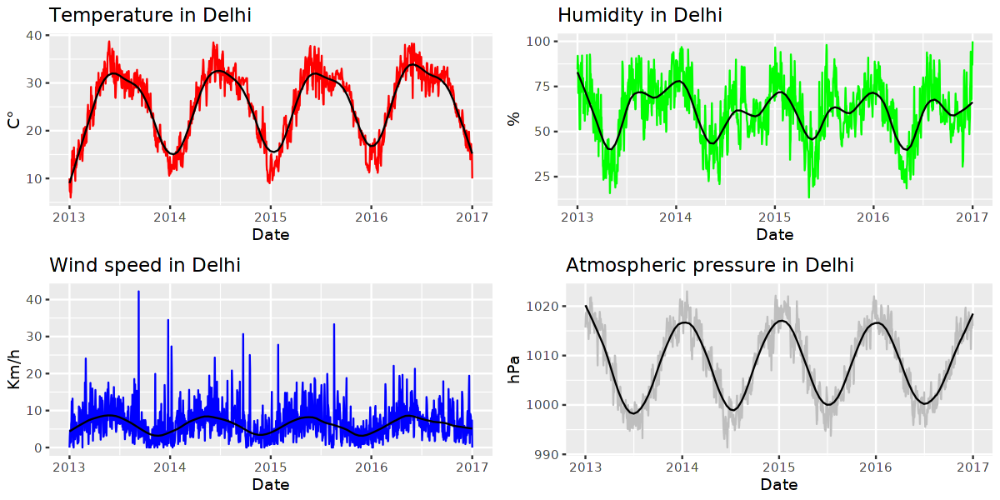

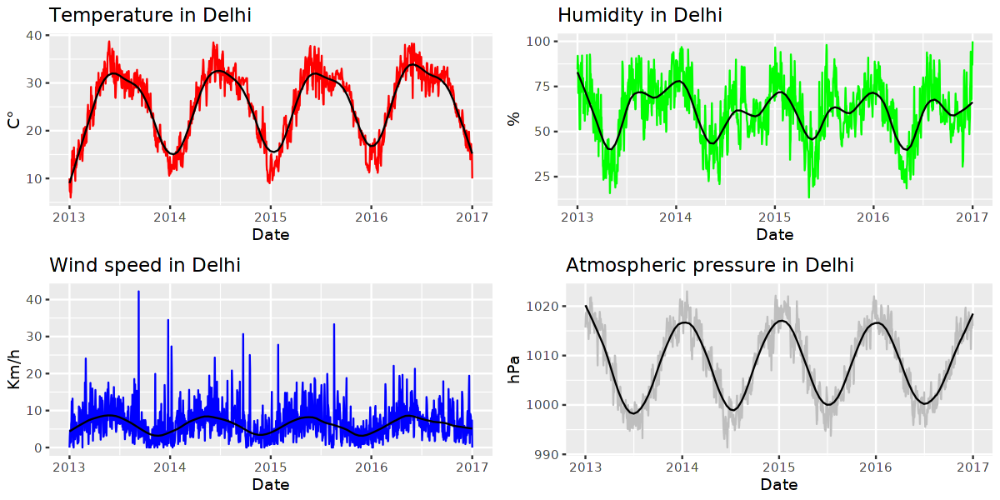

In [30]:
meantempPlot<-ggplot(df, aes(x=date, y=meantemp))+
    geom_line(color="red")+
    ylab("C°") + 
    xlab("Date") +
    ggtitle('Temperature in Delhi')+
    geom_line(data=temperature.sm, aes(x=x, y=y))

humidityPlot<-ggplot(df, aes(x=date, y=humidity))+
    geom_line(color="green")+
    ylab("%") + 
    xlab("Date") +
    ggtitle('Humidity in Delhi')+
    geom_line(data=humidity.sm, aes(x=x, y=y))

wind_speedPlot<-ggplot(df, aes(x=date, y=wind_speed))+
    geom_line(color="blue")+
    ylab("Km/h") + 
    xlab("Date") +
    ggtitle('Wind speed in Delhi')+
    geom_line(data=wind_speed.sm, aes(x=x, y=y))

meanpressurePlot<-ggplot(df, aes(x=date, y=meanpressure))+
    geom_line(color="gray")+
    ylab("hPa") + 
    xlab("Date") +
    ggtitle('Atmospheric pressure in Delhi')+
    geom_line(data=pressure.sm, aes(x=x, y=y))

grid.arrange(meantempPlot, 
            humidityPlot, 
            wind_speedPlot,
            meanpressurePlot,
            nrow=2, ncol=2
            )

In [31]:
df.smooth <- data.frame(date, temperature.sm$y, humidity.sm$y, 
                              wind_speed.sm$y,  pressure.sm$y)

df_12 <- df.smooth %>% 
   group_by(yearMon = as.yearmon(date)) %>%
   summarise(date = first(date),
            meantemp = first(temperature.sm.y),
            humidity = first(humidity.sm.y),
            wind_speed = first(wind_speed.sm.y),
            meanpressure = first(pressure.sm.y)
            )

df_12

yearMon,date,meantemp,humidity,wind_speed,meanpressure
<yearmon>,<date>,<dbl>,<dbl>,<dbl>,<dbl>
Jan 2013,2013-01-01,9.02463,82.91525,4.353047,1020.1909
Feb 2013,2013-02-01,14.76655,71.27970,5.768681,1016.6282
Mar 2013,2013-03-01,19.97257,60.17447,6.941844,1013.2040
Apr 2013,2013-04-01,25.64426,47.23455,7.898692,1008.5178
May 2013,2013-05-01,30.03468,40.28941,8.499292,1003.4413
Jun 2013,2013-06-01,31.90447,47.24610,8.671373,999.6307
Jul 2013,2013-07-01,31.56246,61.96535,8.188043,998.2452
Aug 2013,2013-08-01,30.41516,71.00634,7.099187,999.5299
Sep 2013,2013-09-01,29.28331,71.49427,5.719516,1002.7571


yearMon,date,meantemp,humidity,wind_speed,meanpressure
<yearmon>,<date>,<dbl>,<dbl>,<dbl>,<dbl>
Jan 2013,2013-01-01,9.02463,82.91525,4.353047,1020.1909
Feb 2013,2013-02-01,14.76655,71.27970,5.768681,1016.6282
Mar 2013,2013-03-01,19.97257,60.17447,6.941844,1013.2040
Apr 2013,2013-04-01,25.64426,47.23455,7.898692,1008.5178
May 2013,2013-05-01,30.03468,40.28941,8.499292,1003.4413
Jun 2013,2013-06-01,31.90447,47.24610,8.671373,999.6307
Jul 2013,2013-07-01,31.56246,61.96535,8.188043,998.2452
Aug 2013,2013-08-01,30.41516,71.00634,7.099187,999.5299
Sep 2013,2013-09-01,29.28331,71.49427,5.719516,1002.7571


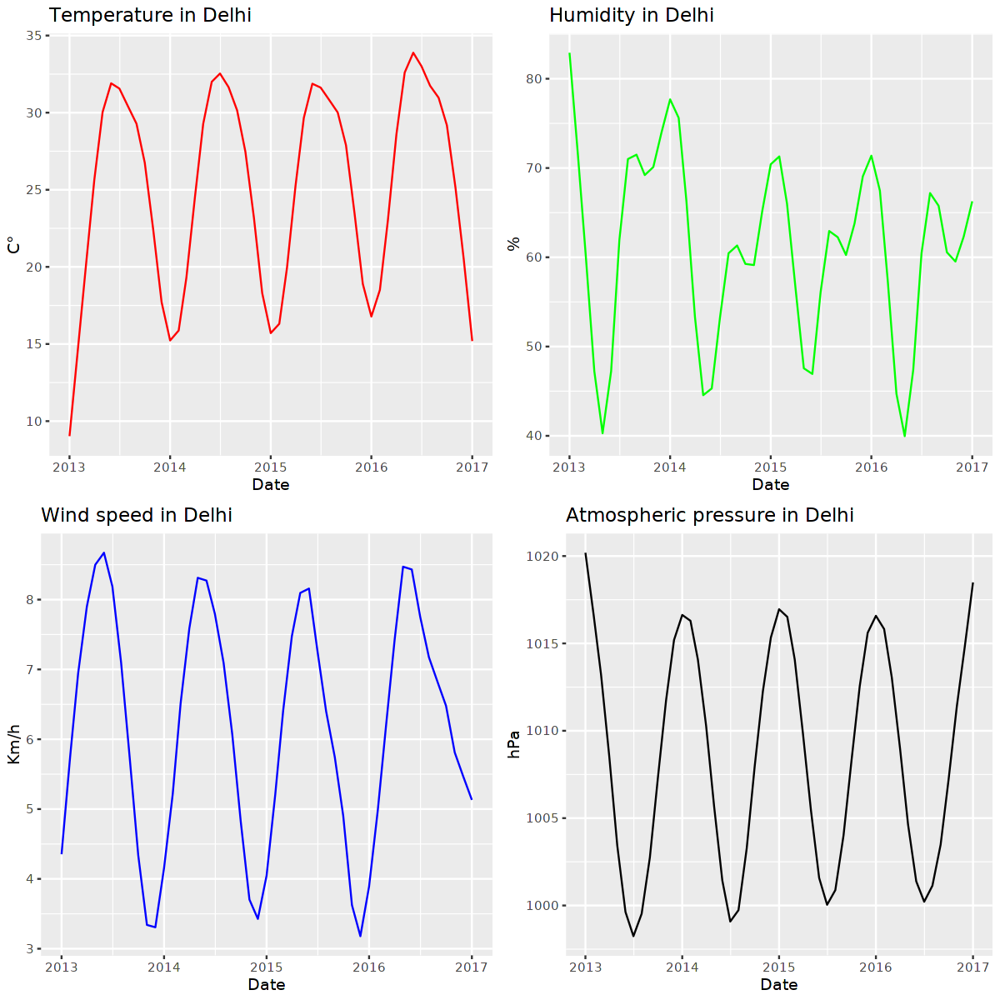

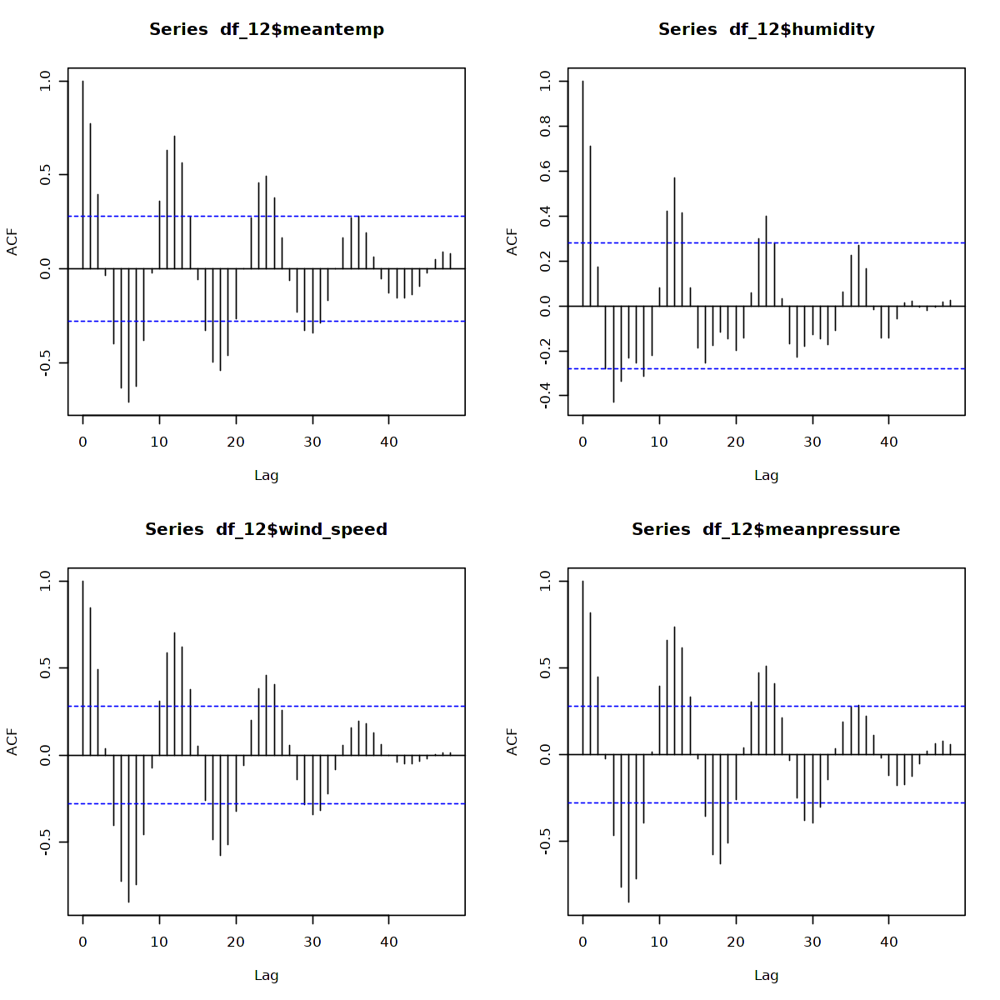

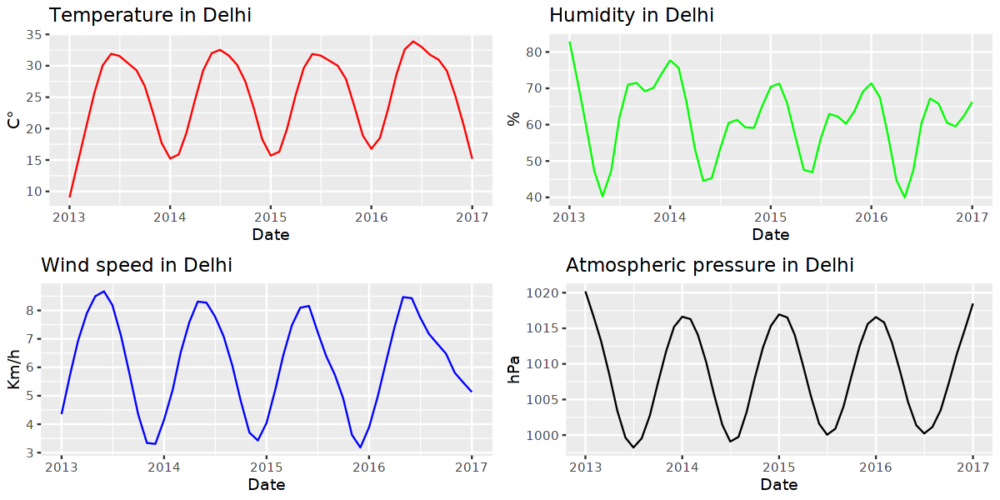

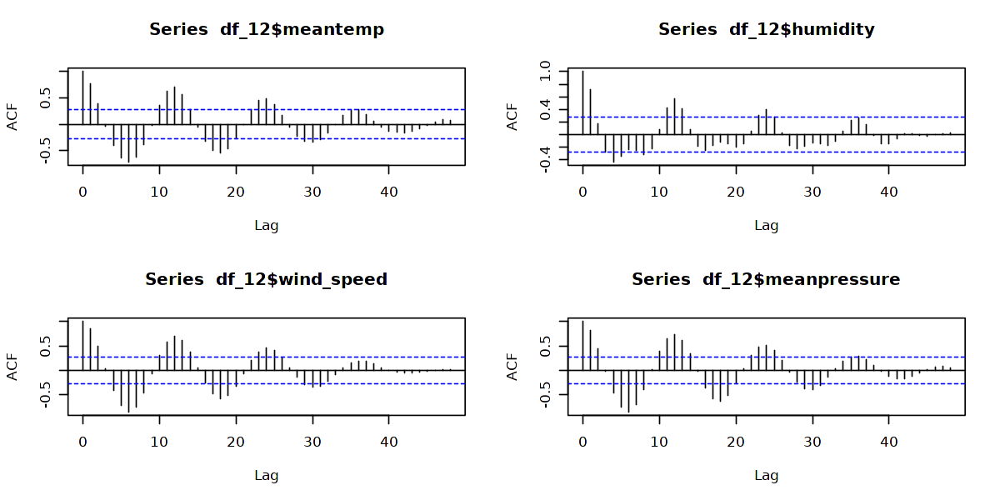

In [32]:
meantempPlot<-ggplot(df_12, aes(x=date, y=meantemp))+
    geom_line(color="red")+
    ylab("C°") + 
    xlab("Date") +
    ggtitle('Temperature in Delhi')

humidityPlot<-ggplot(df_12, aes(x=date, y=humidity))+
    geom_line(color="green")+
    ylab("%") + 
    xlab("Date") +
    ggtitle('Humidity in Delhi')

wind_speedPlot<-ggplot(df_12, aes(x=date, y=wind_speed))+
    geom_line(color="blue")+
    ylab("Km/h") + 
    xlab("Date") +
    ggtitle('Wind speed in Delhi')

meanpressurePlot<-ggplot(df_12, aes(x=date, y=meanpressure))+
    geom_line(color="black")+
    ylab("hPa") + 
    xlab("Date") +
    ggtitle('Atmospheric pressure in Delhi')

grid.arrange(meantempPlot, 
            humidityPlot, 
            wind_speedPlot, 
            meanpressurePlot, 
            nrow=2, ncol=2
            )

par(mfrow = c(2,2))

acf_meantemp<-acf(df_12$meantemp, lag.max=10000)
acf_humidity<-acf(df_12$humidity, lag.max=10000)
acf_wind_speed<-acf(df_12$wind_speed, lag.max=10000)
acf_meanpressure<-acf(df_12$meanpressure, lag.max=10000)

Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”


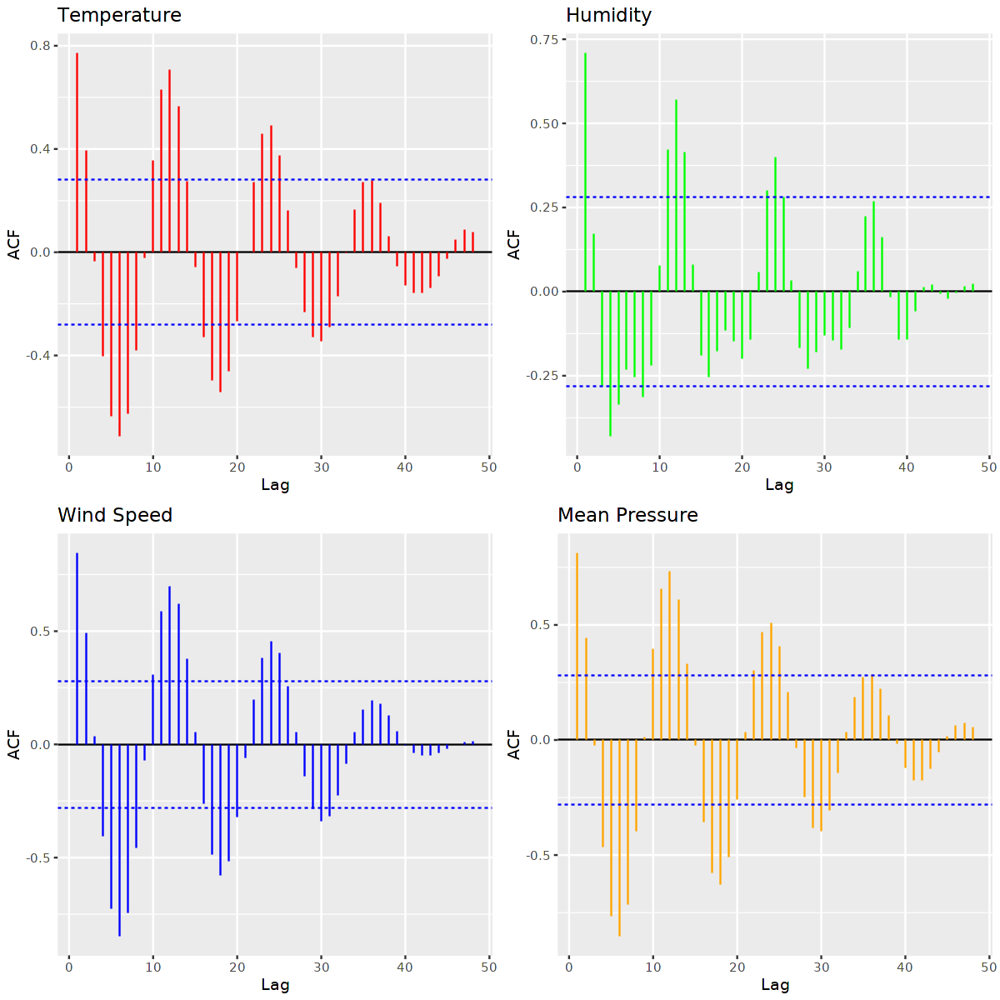

Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”
Warning message in ggplot2::geom_segment(lineend = "butt", ...):
“Ignoring unknown parameters: `main`”


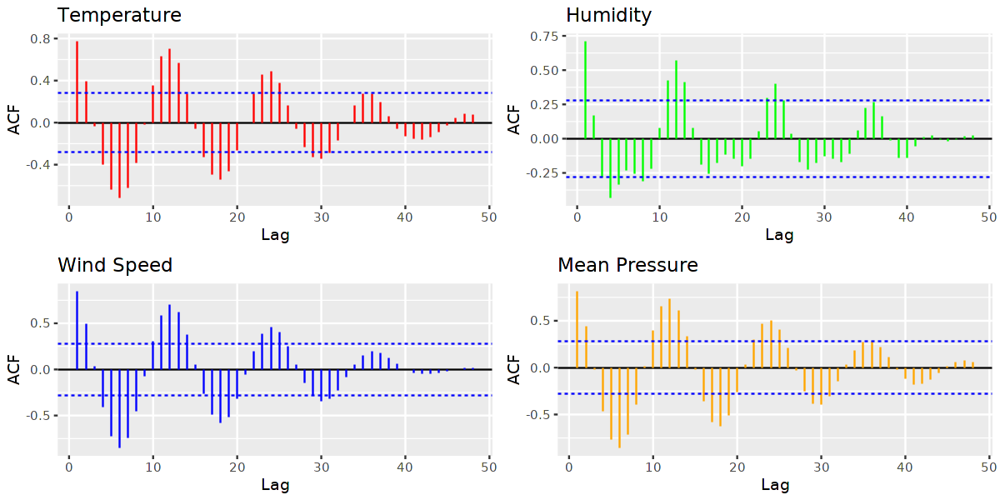

In [33]:
acf_meantempPlot<-autoplot(acf_meantemp, main = "Temperature", col="red")
acf_humidityPlot<-autoplot(acf_humidity, main = "Humidity", col="green")
acf_wind_speedPlot<-autoplot(acf_wind_speed, main = "Wind Speed", col="blue")
acf_meanpressurePlot<-autoplot(acf_meanpressure, main = "Mean Pressure", col="orange")


grid.arrange(acf_meantempPlot, 
             acf_humidityPlot, 
             acf_wind_speedPlot,
             acf_meanpressurePlot,
             nrow=2, ncol=2
            )

In [34]:
# Time series definition

ts_1 <- tibble(
  Date = yearmonth(df_12$yearMon),
  value = df_12$meantemp
)

ts_2 <- tibble(
  Date = yearmonth(df_12$yearMon),
  value = df_12$humidity
)

ts_3 <- tibble(
  Date = yearmonth(df_12$yearMon),
  value = df_12$wind_speed
)

ts_4 <- tibble(
  Date = yearmonth(df_12$yearMon),
  value = df_12$meanpressure
)

tsibble_1<-as_tsibble(ts_1, index=Date)
tsibble_1<-fill_gaps(tsibble_1, .full = FALSE)

tsibble_2<-as_tsibble(ts_2, index=Date)
tsibble_2<-fill_gaps(tsibble_2, .full = FALSE)

tsibble_3<-as_tsibble(ts_3, index=Date)
tsibble_3<-fill_gaps(tsibble_3, .full = FALSE)

tsibble_4<-as_tsibble(ts_4, index=Date)
tsibble_4<-fill_gaps(tsibble_4, .full = FALSE)

fitted_arima_model_1
<model>
"<ARIMA(2,0,2)(0,1,0)[12]>"


fitted_arima_model_2
<model>
"<ARIMA(1,0,2)(0,1,0)[12]>"


fitted_arima_model_3
<model>
"<ARIMA(0,1,1)(0,1,0)[12]>"


fitted_arima_model_4
<model>
"<ARIMA(2,0,0)(0,1,0)[12]>"


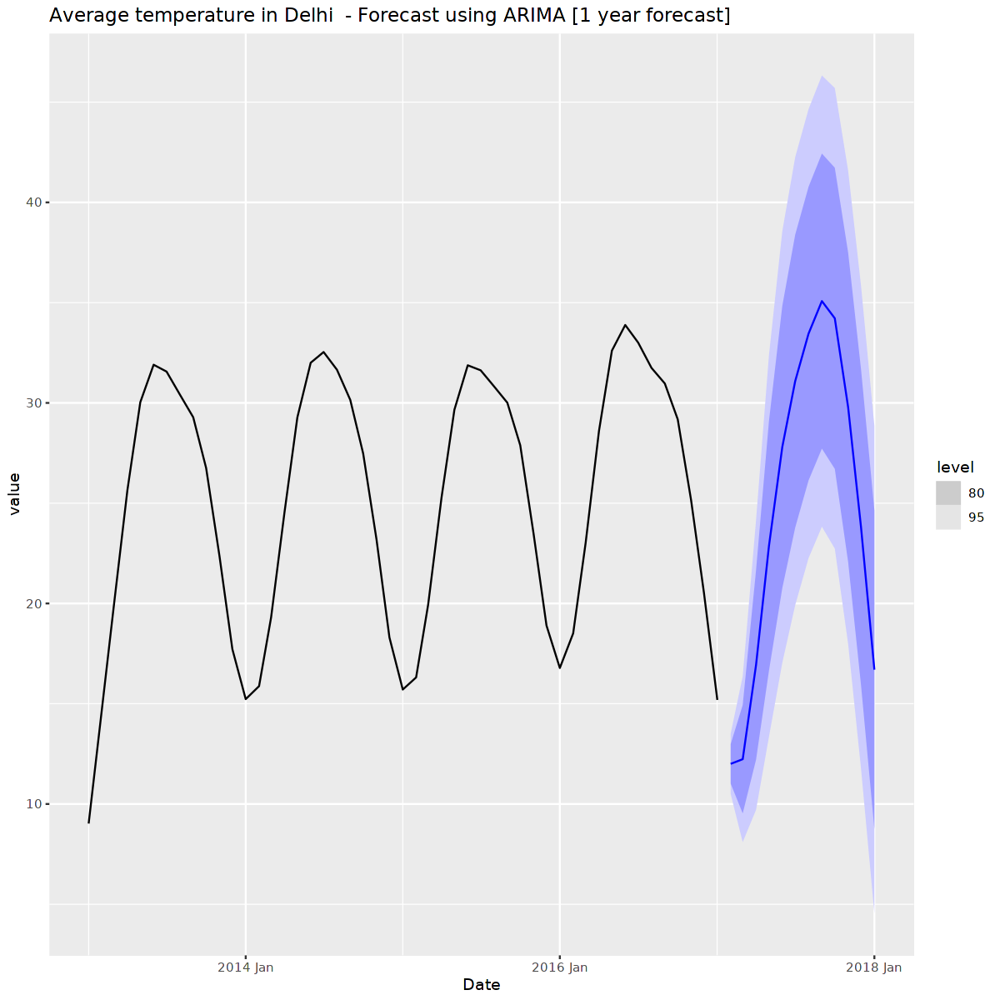

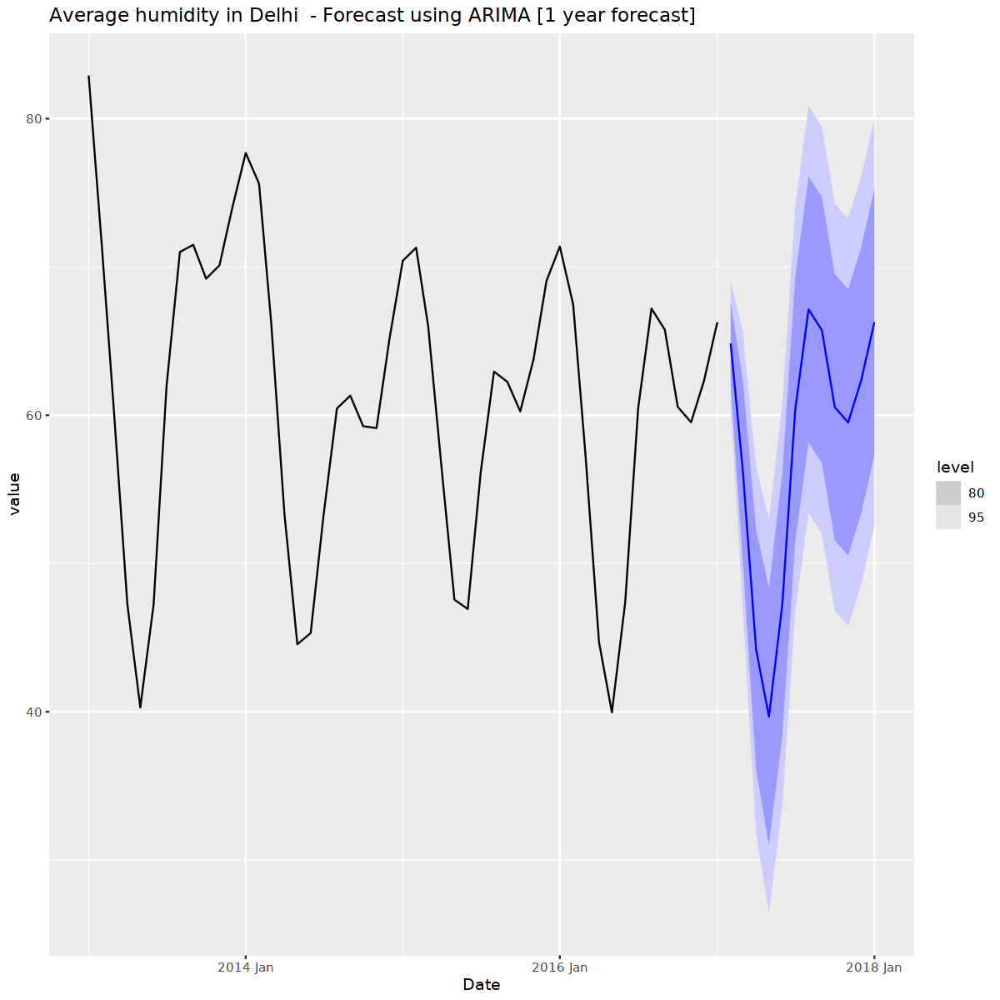

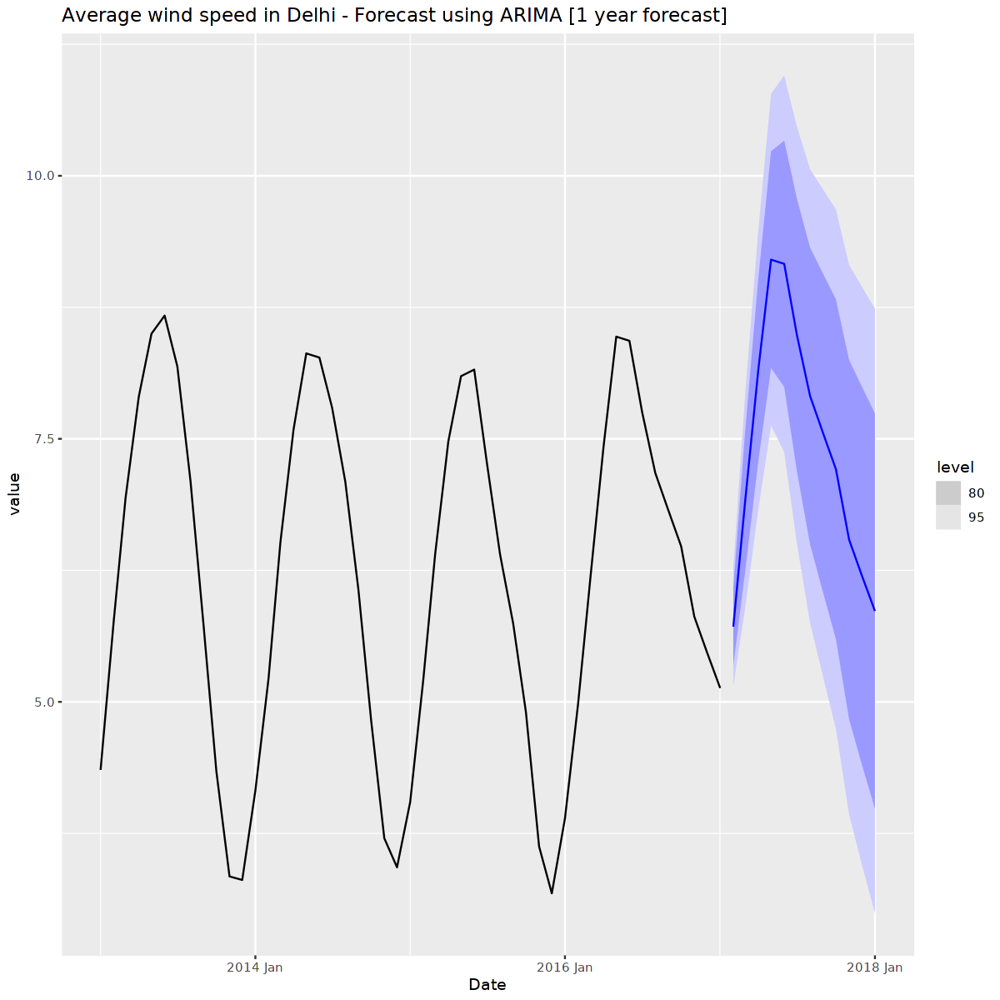

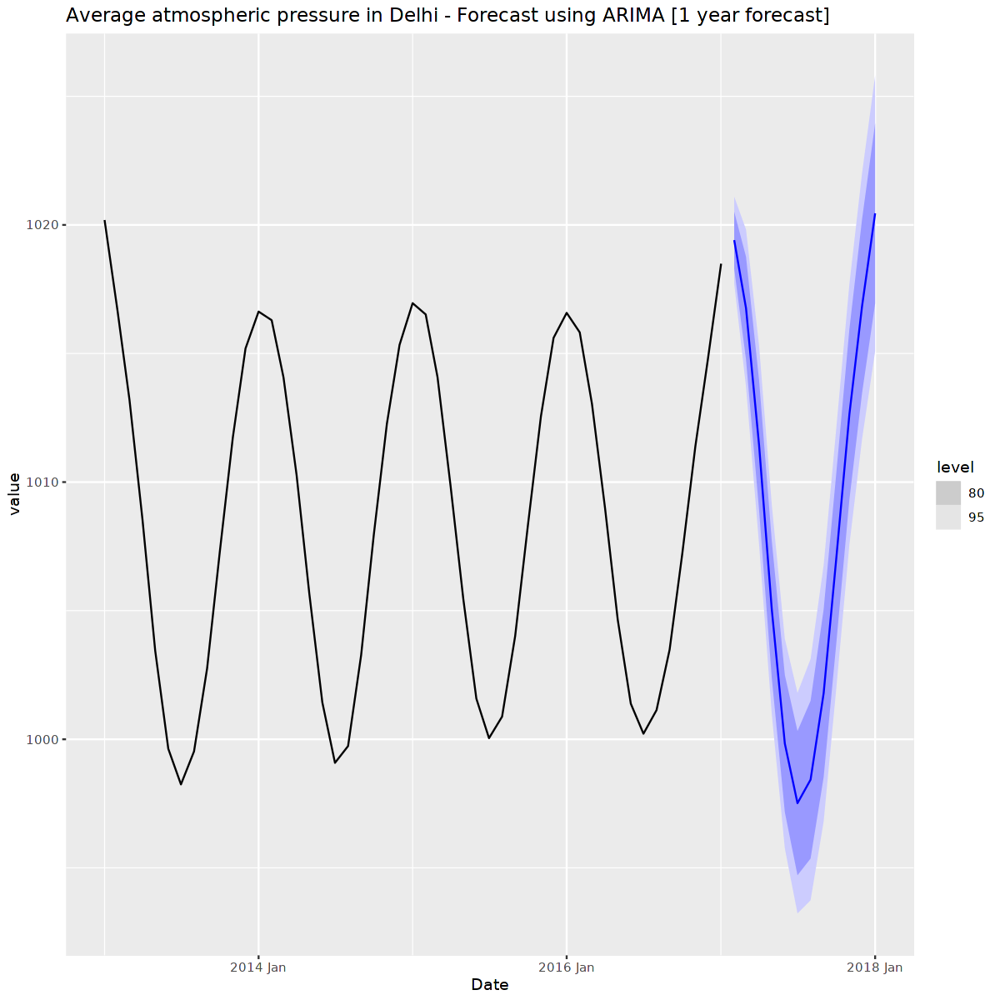

fitted_arima_model_1
<model>
"<ARIMA(2,0,2)(0,1,0)[12]>"


fitted_arima_model_2
<model>
"<ARIMA(1,0,2)(0,1,0)[12]>"


fitted_arima_model_3
<model>
"<ARIMA(0,1,1)(0,1,0)[12]>"


fitted_arima_model_4
<model>
"<ARIMA(2,0,0)(0,1,0)[12]>"


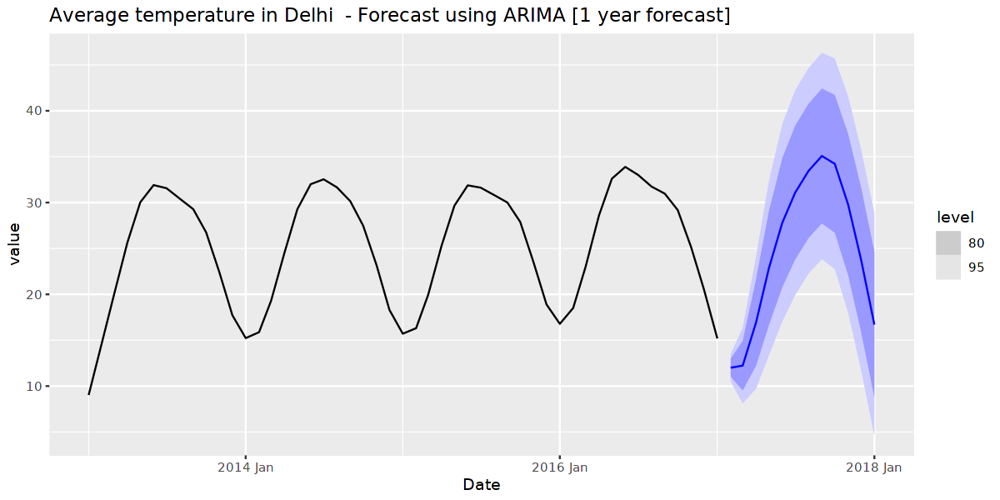

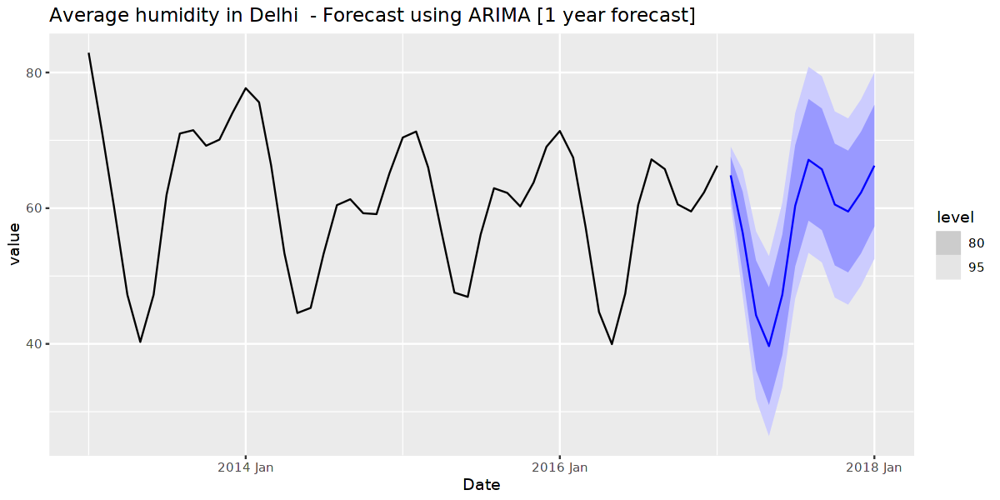

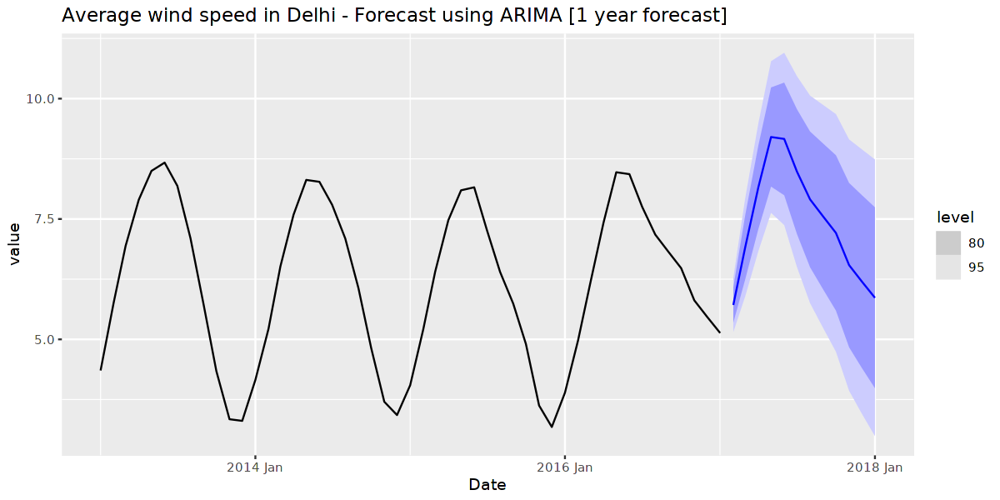

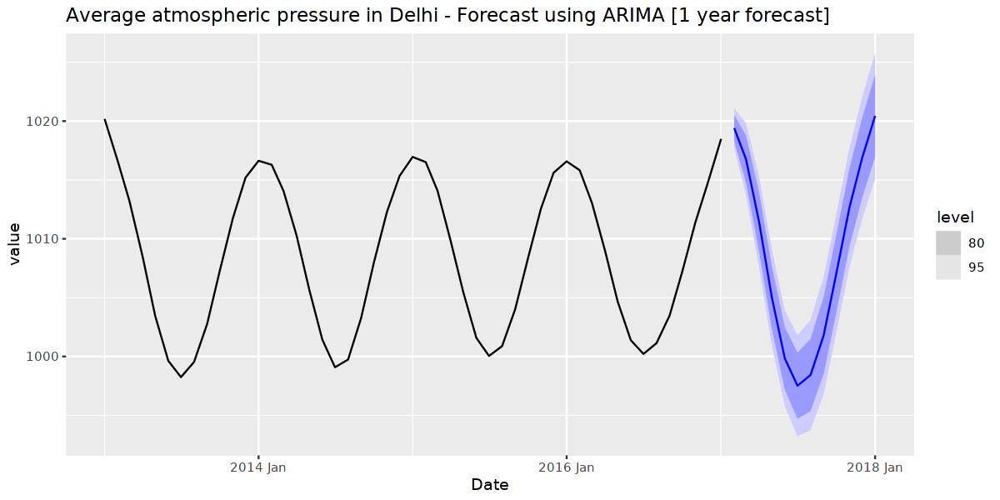

In [35]:
# Forecasting with ARIMA

# Fitting an ARIMA model

fit_ts_1<- tsibble_1 %>%
  model(fitted_arima_model_1 = ARIMA(value ~ pdq() + PDQ()))

fit_ts_2<- tsibble_2 %>%
  model(fitted_arima_model_2 = ARIMA(value ~ pdq() + PDQ()))


fit_ts_3<- tsibble_3 %>%
  model(fitted_arima_model_3 = ARIMA(value ~ pdq() + PDQ()))


fit_ts_4<- tsibble_4 %>%
  model(fitted_arima_model_4 = ARIMA(value ~ pdq() + PDQ()))


fit_ts_1
fit_ts_2
fit_ts_3
fit_ts_4

# Forcasting the time series using the fitted ARIMA model
fc_ts_1 <- fit_ts_1 %>%
  forecast(h = 12)

fc_ts_1%>%
    autoplot(tsibble_1) + 
    ggtitle('Average temperature in Delhi  - Forecast using ARIMA [1 year forecast]')

fc_ts_2 <- fit_ts_2 %>%
  forecast(h = 12)

fc_ts_2%>%
    autoplot(tsibble_2) + 
    ggtitle('Average humidity in Delhi  - Forecast using ARIMA [1 year forecast]')

fc_ts_3 <- fit_ts_3 %>%
  forecast(h = 12)

fc_ts_3%>%
    autoplot(tsibble_3) + 
    ggtitle('Average wind speed in Delhi - Forecast using ARIMA [1 year forecast]')

fc_ts_4 <- fit_ts_4 %>%
  forecast(h = 12)

fc_ts_4%>%
    autoplot(tsibble_4) + 
    ggtitle('Average atmospheric pressure in Delhi - Forecast using ARIMA [1 year forecast]')

In [36]:
#Loading the datasets

df_india_original = as_tibble(read.csv("india.csv"))

df_india_original$date <- as.yearmon(df_india_original$date)

df_india <- df_india_original %>%
    filter(date > "Dec 2012" & date < "Feb 2017")

df_india_test <- df_india_original %>%
    filter(date > "Dec 2012" & date < "Feb 2018") #Anche se lo chiamo test in realtà è test+train

df_india

names(df_india)

date,Chickpeas,Oil..mustard.,Potatoes,Rice,Sugar,Wheat,Onions
<yearmon>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Jan 2013,69.3225,104.72295,14.63646,221.0802,174.8686,198.3005,20.91688
Feb 2013,63.9750,104.74977,14.07729,226.6646,173.8828,204.6400,25.00250
Mar 2013,60.9425,103.89682,13.43064,226.6332,173.3722,210.2631,21.14766
Apr 2013,58.2200,102.22750,13.94596,224.3121,169.7469,206.5352,19.65319
May 2013,55.4950,100.59409,15.54043,229.0694,170.1296,204.8364,18.65723
Jun 2013,53.7750,99.56000,16.80625,227.9257,167.1402,206.6898,21.84646
Jul 2013,52.1050,98.70262,17.93170,245.4423,167.8186,211.4326,28.40979
Aug 2013,50.9650,96.91780,17.72660,236.6579,167.3524,207.4267,45.00191
Sep 2013,51.4650,96.80275,17.41543,239.6317,169.8260,207.9836,55.18891


[1] "date"          "Chickpeas"     "Oil..mustard." "Potatoes"     
[5] "Rice"          "Sugar"         "Wheat"         "Onions"

date,Chickpeas,Oil..mustard.,Potatoes,Rice,Sugar,Wheat,Onions
<yearmon>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Jan 2013,69.3225,104.72295,14.63646,221.0802,174.8686,198.3005,20.91688
Feb 2013,63.9750,104.74977,14.07729,226.6646,173.8828,204.6400,25.00250
Mar 2013,60.9425,103.89682,13.43064,226.6332,173.3722,210.2631,21.14766
Apr 2013,58.2200,102.22750,13.94596,224.3121,169.7469,206.5352,19.65319
May 2013,55.4950,100.59409,15.54043,229.0694,170.1296,204.8364,18.65723
Jun 2013,53.7750,99.56000,16.80625,227.9257,167.1402,206.6898,21.84646
Jul 2013,52.1050,98.70262,17.93170,245.4423,167.8186,211.4326,28.40979
Aug 2013,50.9650,96.91780,17.72660,236.6579,167.3524,207.4267,45.00191
Sep 2013,51.4650,96.80275,17.41543,239.6317,169.8260,207.9836,55.18891


[1] "date"          "Chickpeas"     "Oil..mustard." "Potatoes"     
[5] "Rice"          "Sugar"         "Wheat"         "Onions"

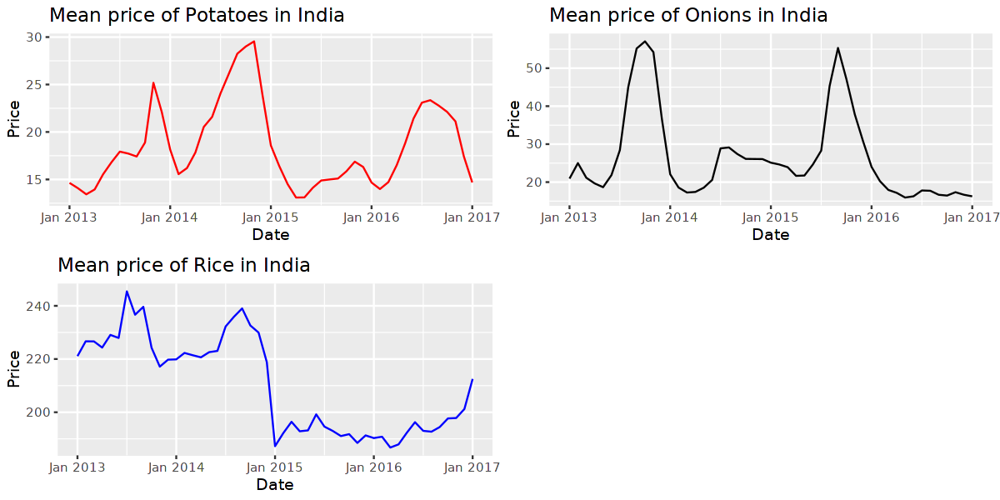

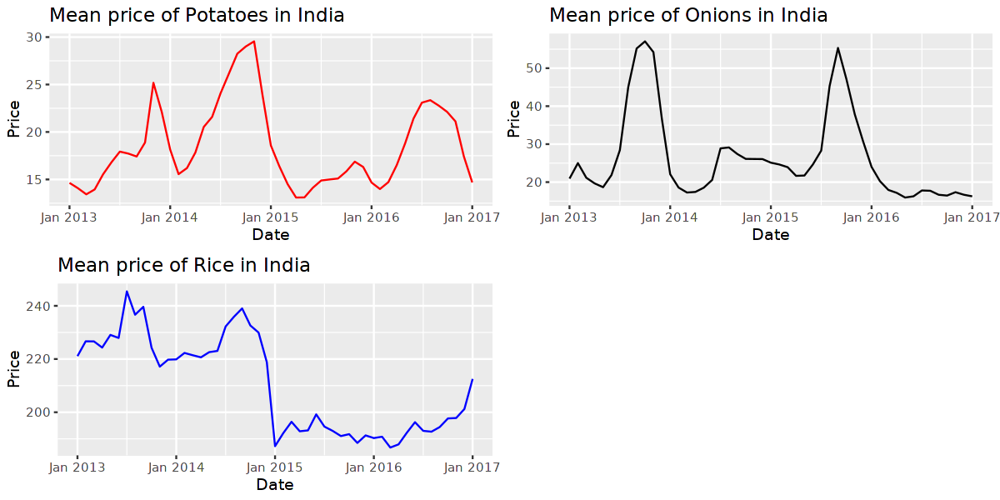

In [37]:
#Plotting potatoes, onions and rice prices in the training set

PotatoesPlot<-ggplot(df_india, aes(x=date, y=Potatoes))+
    geom_line(color="red")+
    ylab("Price") + 
    xlab("Date") +
    ggtitle('Mean price of Potatoes in India')

OnionsPlot<-ggplot(df_india, aes(x=date, y=Onions))+
    geom_line(color="black")+
    ylab("Price") + 
    xlab("Date") +
    ggtitle('Mean price of Onions in India')

RicePlot<-ggplot(df_india, aes(x=date, y=Rice))+
    geom_line(color="blue")+
    ylab("Price") + 
    xlab("Date") +
    ggtitle('Mean price of Rice in India')

grid.arrange(PotatoesPlot, 
            OnionsPlot, 
            RicePlot, 
            nrow=2, ncol=2
            )

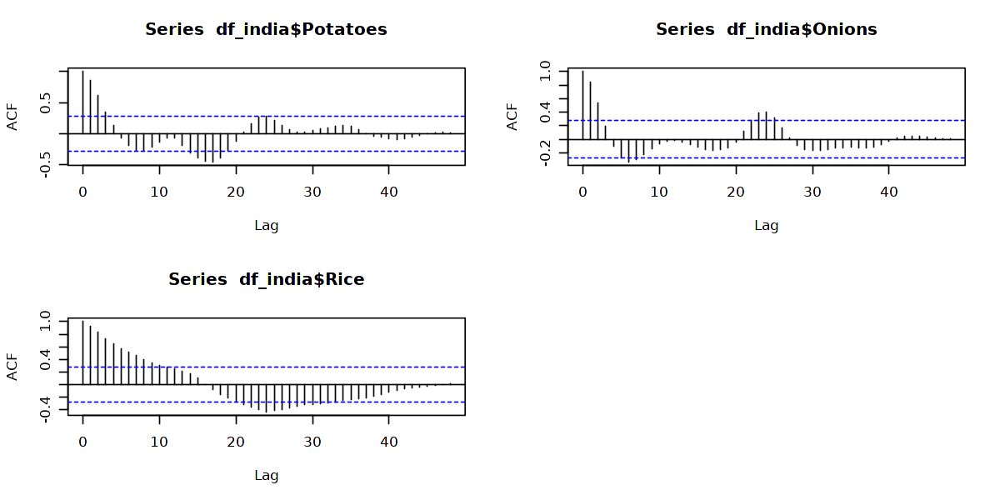

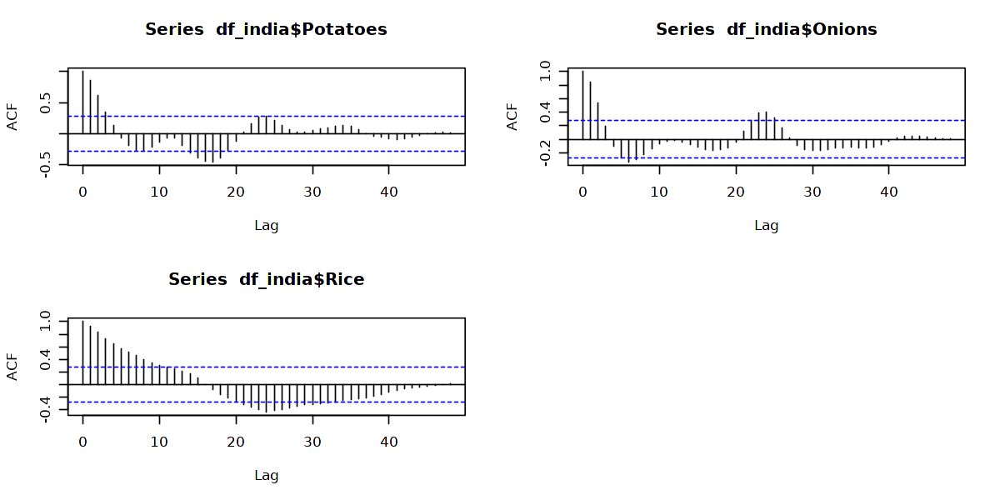

In [38]:
#Autocorrelation function plots

par(mfrow = c(2,2))

acf_Potatoes<-acf(df_india$Potatoes, lag.max=10000)
acf_Onions<-acf(df_india$Onions, lag.max=10000)
acf_Rice<-acf(df_india$Rice, lag.max=10000)


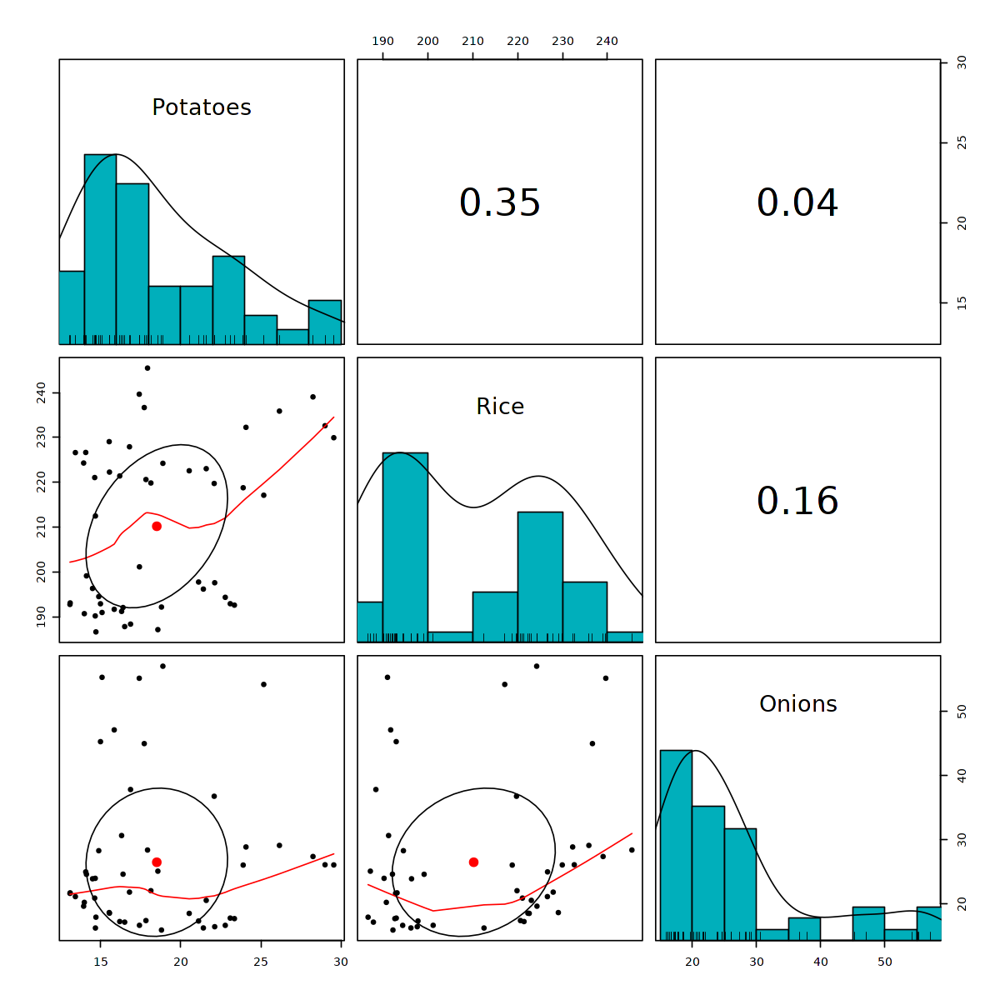

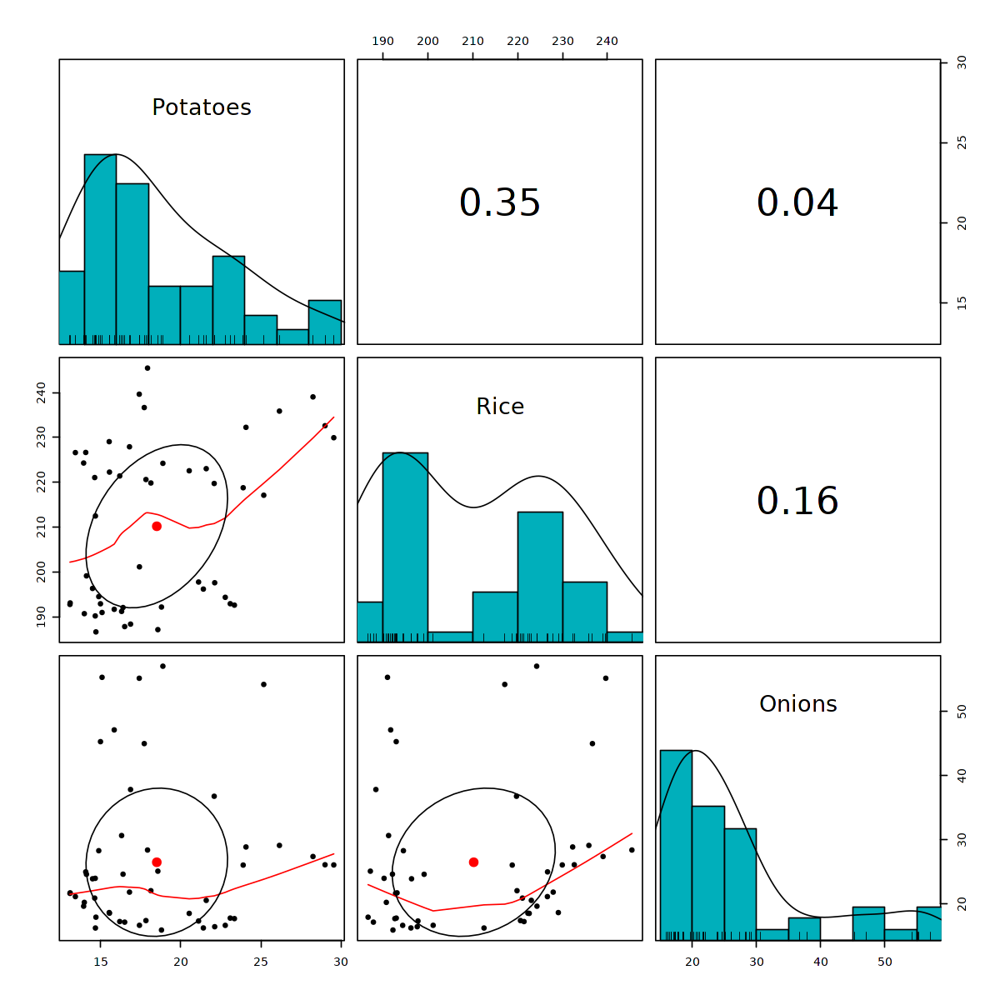

In [39]:
library(psych)

# Plotting options for the notebook
options(repr.plot.width=10, repr.plot.height=10)

pairs.panels(df_india[c(4,5,8)],
             method = "pearson", # correlation method
             hist.col = "#00AFBB",
             density = TRUE,  # show density plots
             ellipses = TRUE # show correlation ellipses
             )

In [40]:
#Definitions of the training time series tibble objects

ts_Potatoes <- tibble(
  Date = yearmonth(df_india$date),
  value = df_india$Potatoes
)

tsibble_Potatoes<-as_tsibble(ts_Potatoes, index=Date)
tsibble_Potatoes<-fill_gaps(tsibble_Potatoes, .full = FALSE)

ts_Onions <- tibble(
  Date = yearmonth(df_india$date),
  value = df_india$Onions
)

tsibble_Onions<-as_tsibble(ts_Onions, index=Date)
tsibble_Onions<-fill_gaps(tsibble_Onions, .full = FALSE)

ts_Rice <- tibble(
  Date = yearmonth(df_india$date),
  value = df_india$Rice
)

tsibble_Rice<-as_tsibble(ts_Rice, index=Date)
tsibble_Rice<-fill_gaps(tsibble_Rice, .full = FALSE)

fitted_arima_model_Potatoes
<model>
"<ARIMA(1,0,2)(1,1,0)[12]>"


fitted_arima_model_Rice
<model>
"<ARIMA(0,1,0)>"


fitted_arima_model_Onions
<model>
"<ARIMA(1,0,1)(1,1,0)[12]>"


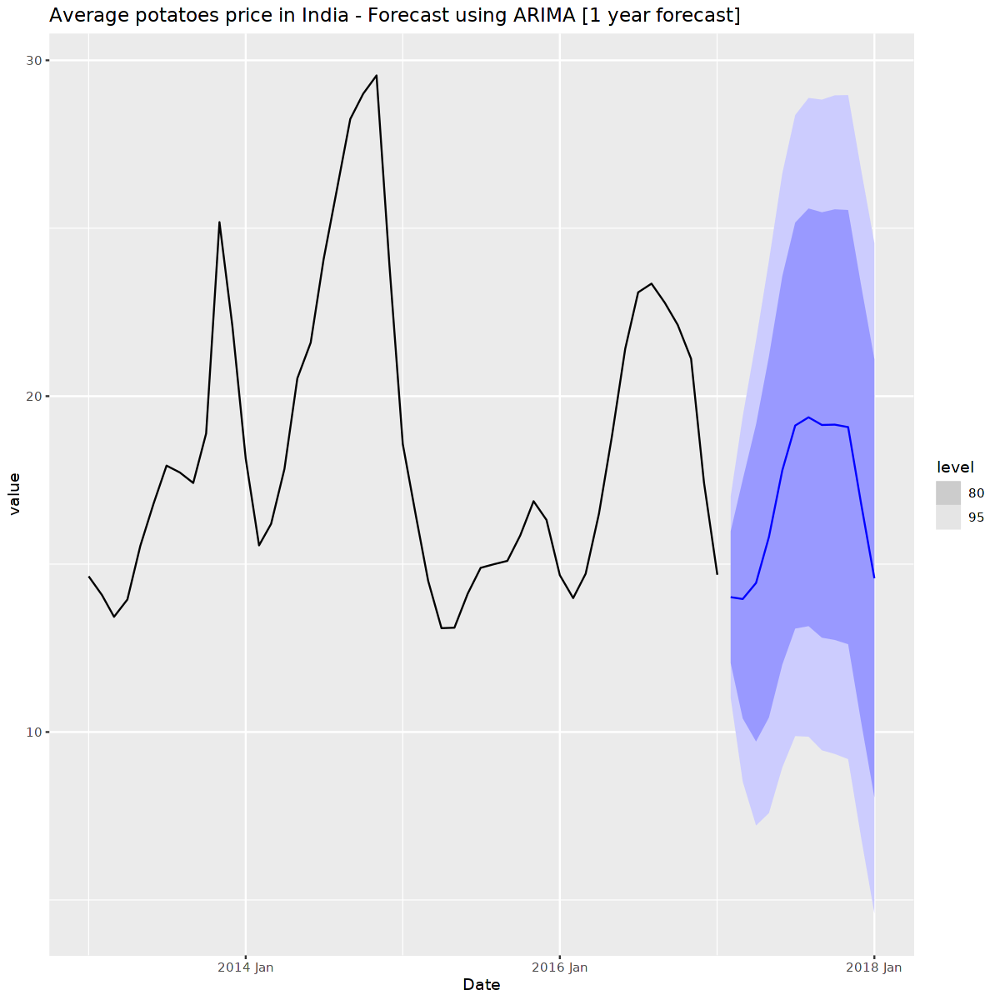

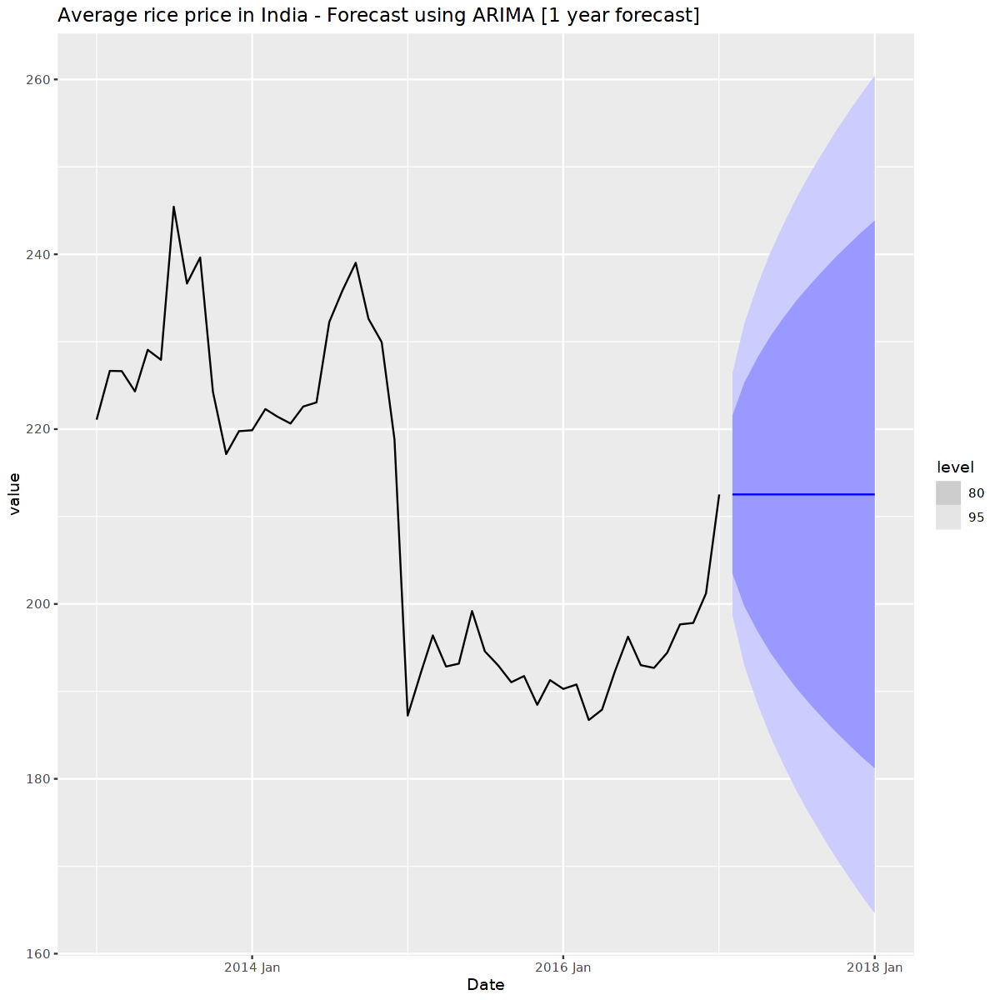

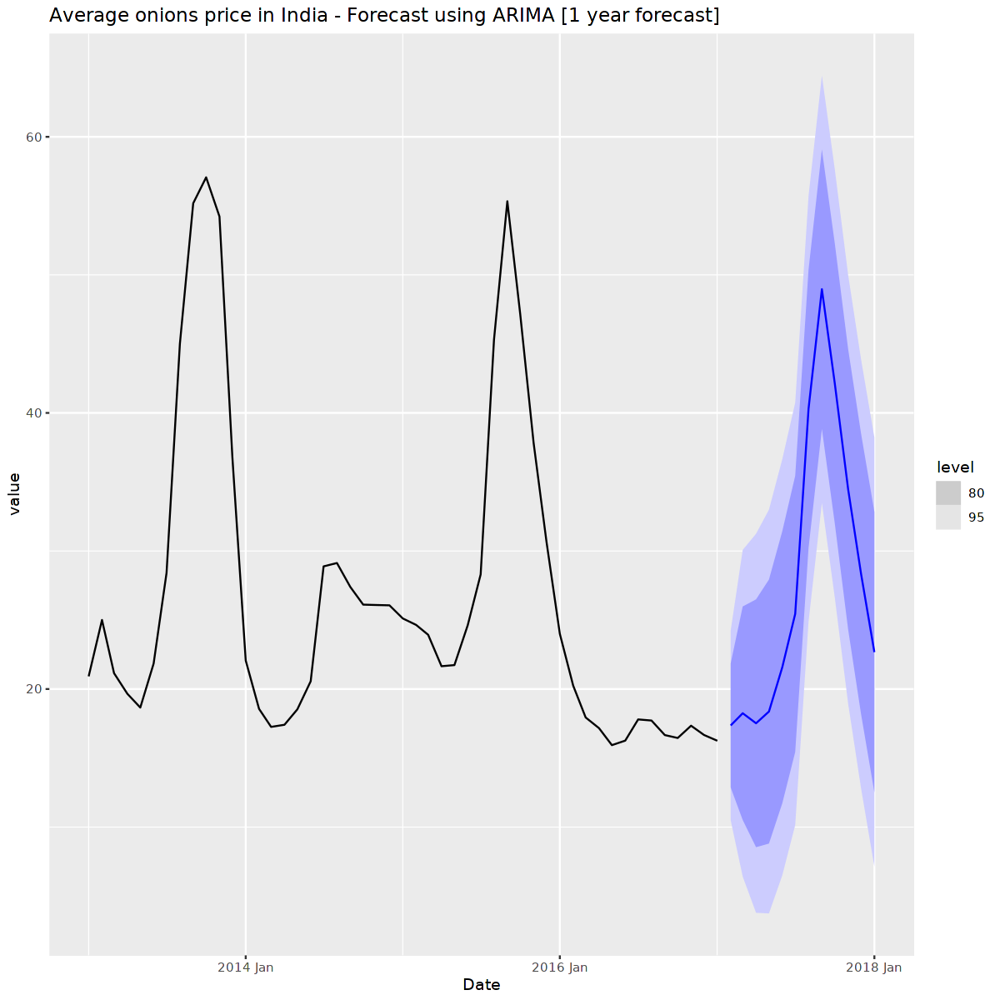

fitted_arima_model_Potatoes
<model>
"<ARIMA(1,0,2)(1,1,0)[12]>"


fitted_arima_model_Rice
<model>
"<ARIMA(0,1,0)>"


fitted_arima_model_Onions
<model>
"<ARIMA(1,0,1)(1,1,0)[12]>"


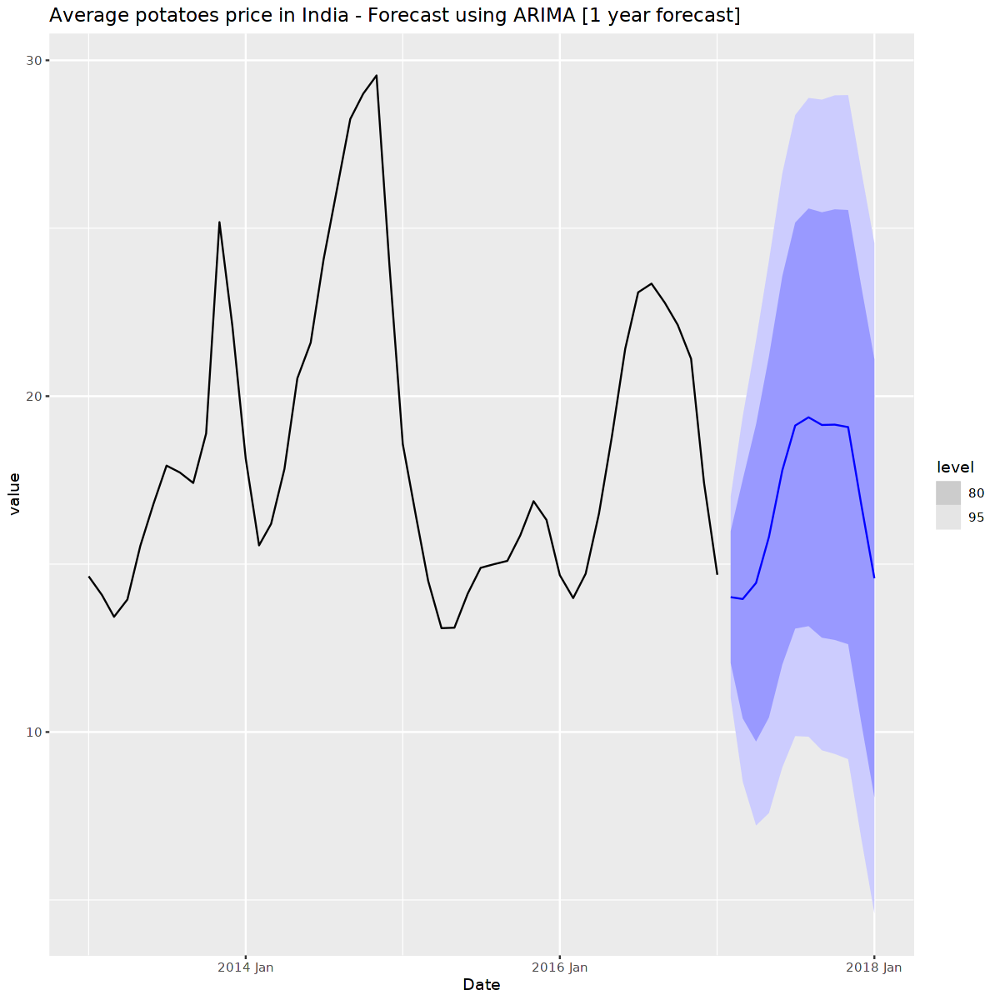

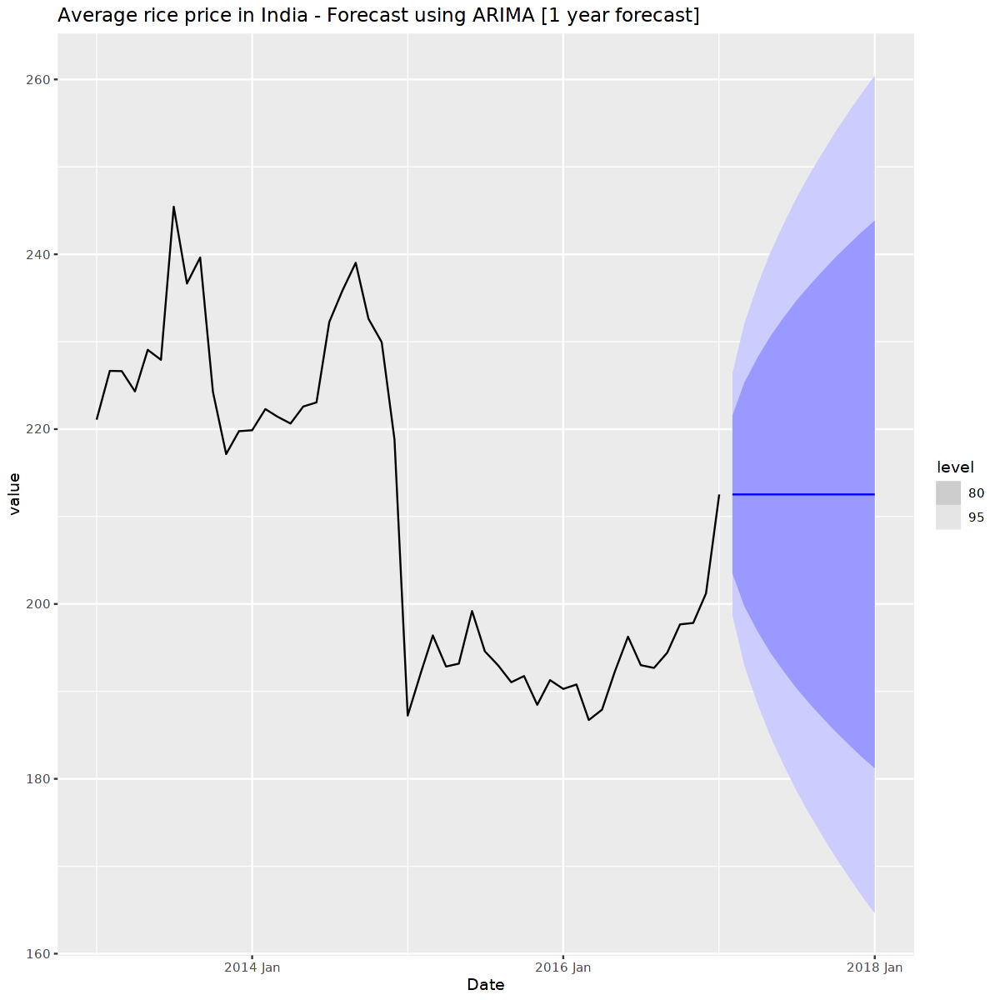

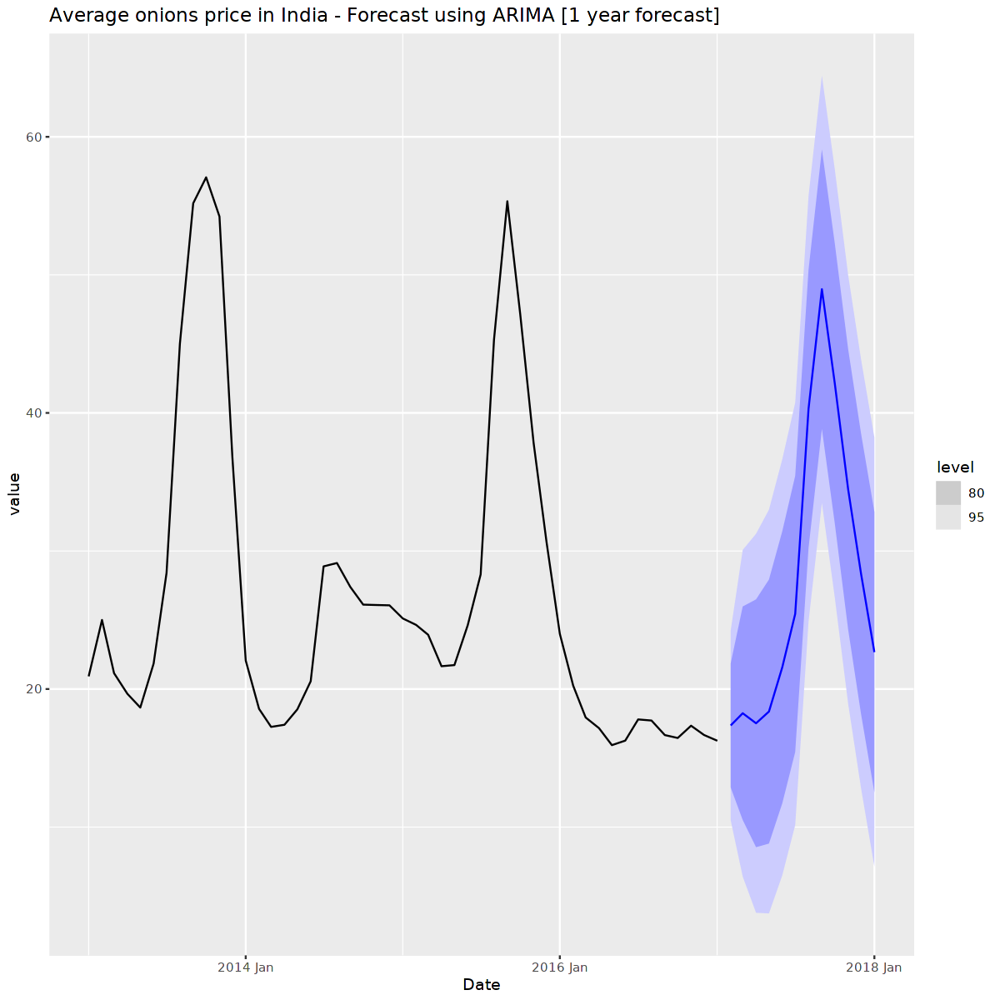

In [41]:
#ARIMA model fitting on the training set

fit_ts_Potatoes <- tsibble_Potatoes %>%
  model(fitted_arima_model_Potatoes = ARIMA(value ~ pdq() + PDQ()))

fit_ts_Rice<- tsibble_Rice %>%
  model(fitted_arima_model_Rice = ARIMA(value ~ pdq() + PDQ()))

fit_ts_Onions<- tsibble_Onions %>%
  model(fitted_arima_model_Onions = ARIMA(value ~ pdq() + PDQ()))

fit_ts_Potatoes

fit_ts_Rice

fit_ts_Onions

# Forcasting the time series using the fitted ARIMA model
fc_ts_Potatoes <- fit_ts_Potatoes %>%
  fabletools::forecast(h = 12)

fc_ts_Potatoes%>%
    autoplot(tsibble_Potatoes) + 
    ggtitle('Average potatoes price in India - Forecast using ARIMA [1 year forecast]')

# Forcasting the time series using the fitted ARIMA model
fc_ts_Rice <- fit_ts_Rice %>%
  fabletools::forecast(h = 12)

fc_ts_Rice%>%
    autoplot(tsibble_Rice) + 
    ggtitle('Average rice price in India - Forecast using ARIMA [1 year forecast]')

# Forcasting the time series using the fitted ARIMA model
fc_ts_Onions <- fit_ts_Onions %>%
  fabletools::forecast(h = 12)

fc_ts_Onions%>%
    autoplot(tsibble_Onions) + 
    ggtitle('Average onions price in India - Forecast using ARIMA [1 year forecast]')

In [42]:
#Definitions of the test time series tibble objects

#We work only with Potatoes and Onions because from the previous analysis we know that the rice
#prices are not correlated to the monsoon season

ts_Potatoes_test <- tibble(
  Date = yearmonth(df_india_test$date),
  value = df_india_test$Potatoes
)

tsibble_Potatoes_test <-as_tsibble(ts_Potatoes_test, index=Date)
tsibble_Potatoes_test <-fill_gaps(tsibble_Potatoes_test, .full = FALSE)

ts_Onions_test <- tibble(
  Date = yearmonth(df_india_test$date),
  value = df_india_test$Onions
)

tsibble_Onions_test <-as_tsibble(ts_Onions_test, index=Date)
tsibble_Onions_test <-fill_gaps(tsibble_Onions_test, .full = FALSE)

ts_Rice_test <- tibble(
  Date = yearmonth(df_india_test$date),
  value = df_india_test$Rice
)

tsibble_Rice_test <-as_tsibble(ts_Rice_test, index=Date)
tsibble_Rice_test <-fill_gaps(tsibble_Rice_test, .full = FALSE)

Using `Date` as index variable.
Using `Date` as index variable.


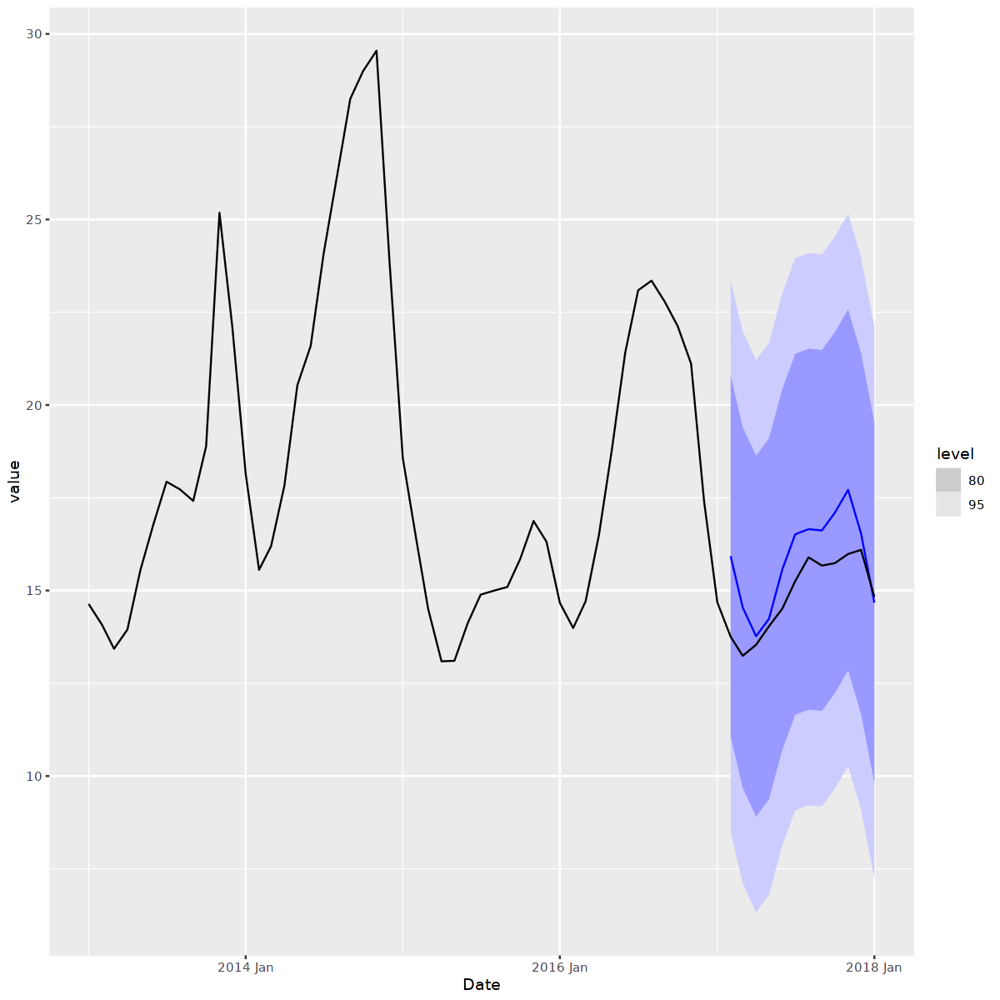

Using `Date` as index variable.


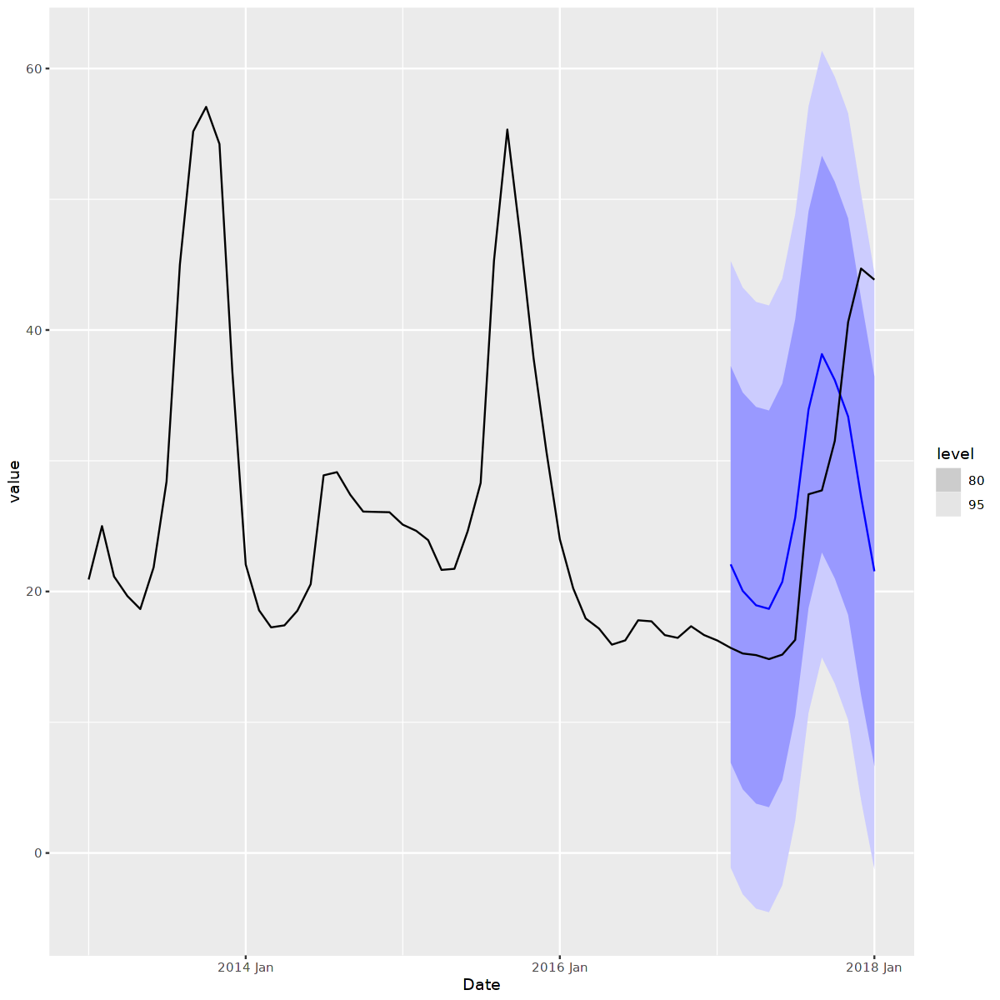

.model,.type,ME,RMSE,MAE,MPE,MAPE,MASE,RMSSE,ACF1
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
fitted_arima_model_Potatoes,Test,-0.9417113,1.145028,0.9677027,-6.354587,6.529871,0.1693308,0.1679719,0.2145277


.model,.type,ME,RMSE,MAE,MPE,MAPE,MASE,RMSSE,ACF1
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
fitted_arima_model_Onions,Test,-0.6923627,10.15639,8.522917,-15.45419,33.4052,0.7538553,0.6549341,0.6313942


.model,.type,ME,RMSE,MAE,MPE,MAPE,MASE,RMSSE,ACF1
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
fitted_arima_model_Rice,Test,9.564572,11.56281,9.811034,4.22406,4.340839,0.6656653,0.557454,0.6747119


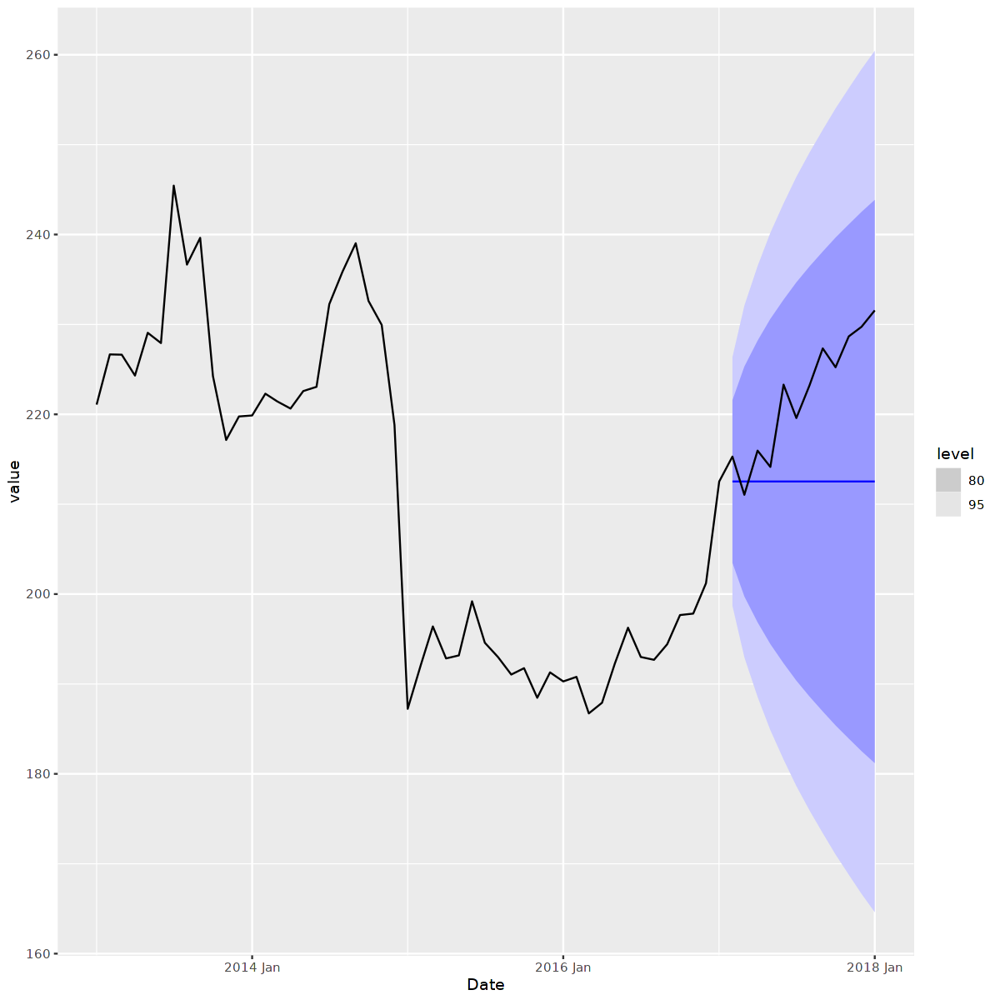

Using `Date` as index variable.
Using `Date` as index variable.


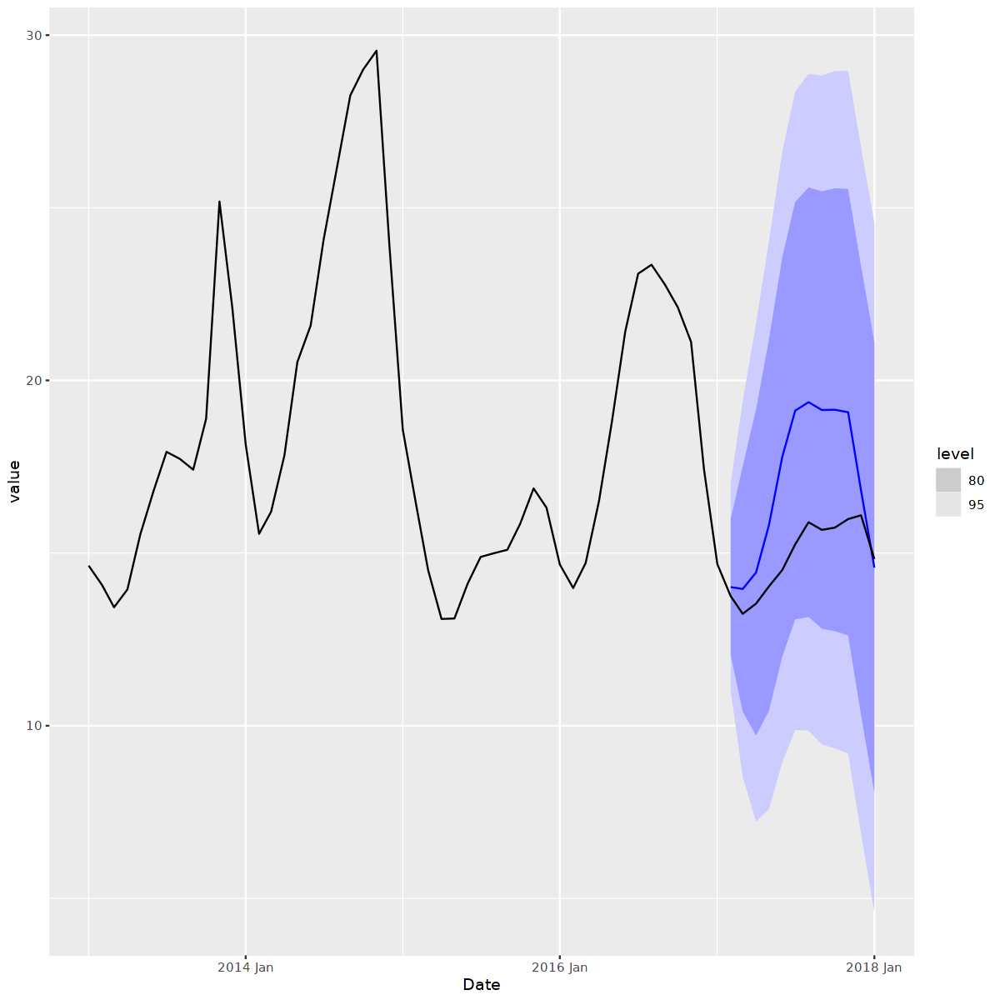

Using `Date` as index variable.


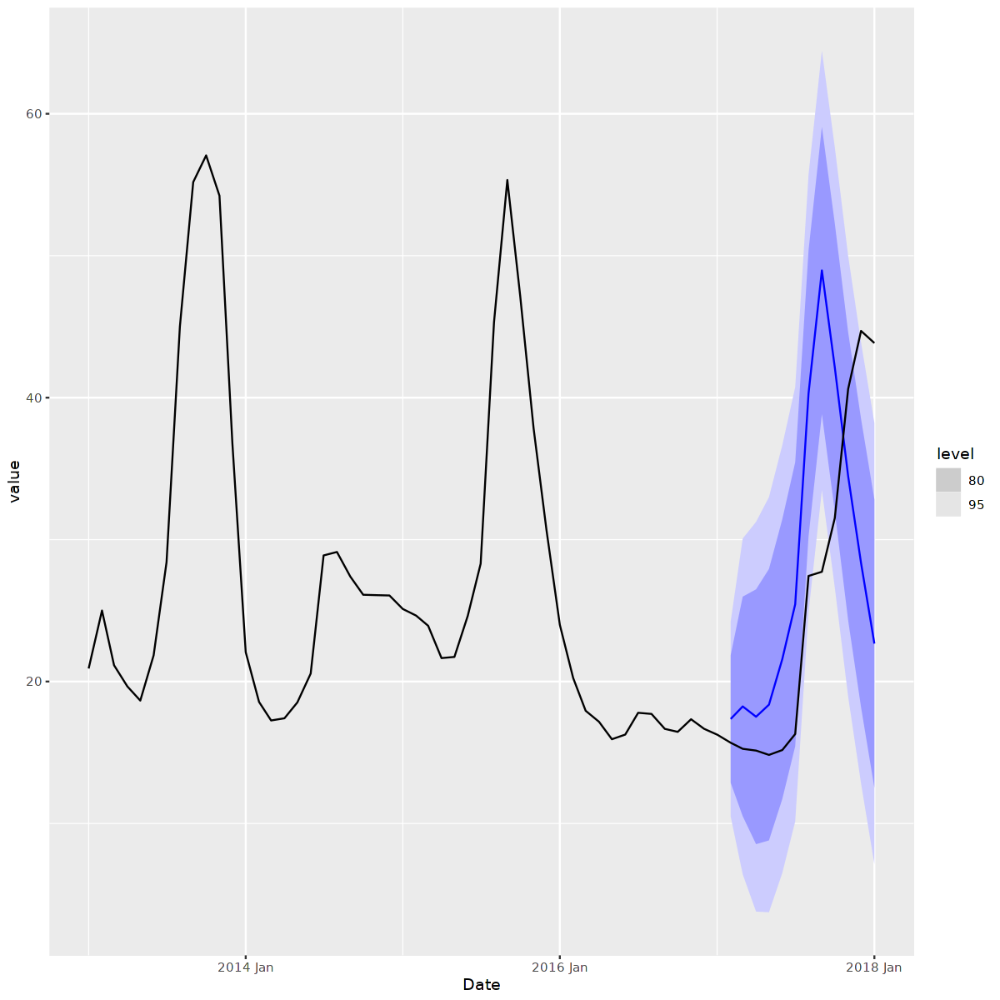

.model,.type,ME,RMSE,MAE,MPE,MAPE,MASE,RMSSE,ACF1
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
fitted_arima_model_Potatoes,Test,-2.06076,2.520252,2.102544,-13.53733,13.81911,0.3679078,0.369713,0.6230779


.model,.type,ME,RMSE,MAE,MPE,MAPE,MASE,RMSSE,ACF1
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
fitted_arima_model_Onions,Test,-2.26456,11.67903,9.541714,-18.77349,35.43724,0.8439683,0.7531212,0.6274545


.model,.type,ME,RMSE,MAE,MPE,MAPE,MASE,RMSSE,ACF1
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
fitted_arima_model_Rice,Test,9.564572,11.56281,9.811034,4.22406,4.340839,0.6656653,0.557454,0.6747119


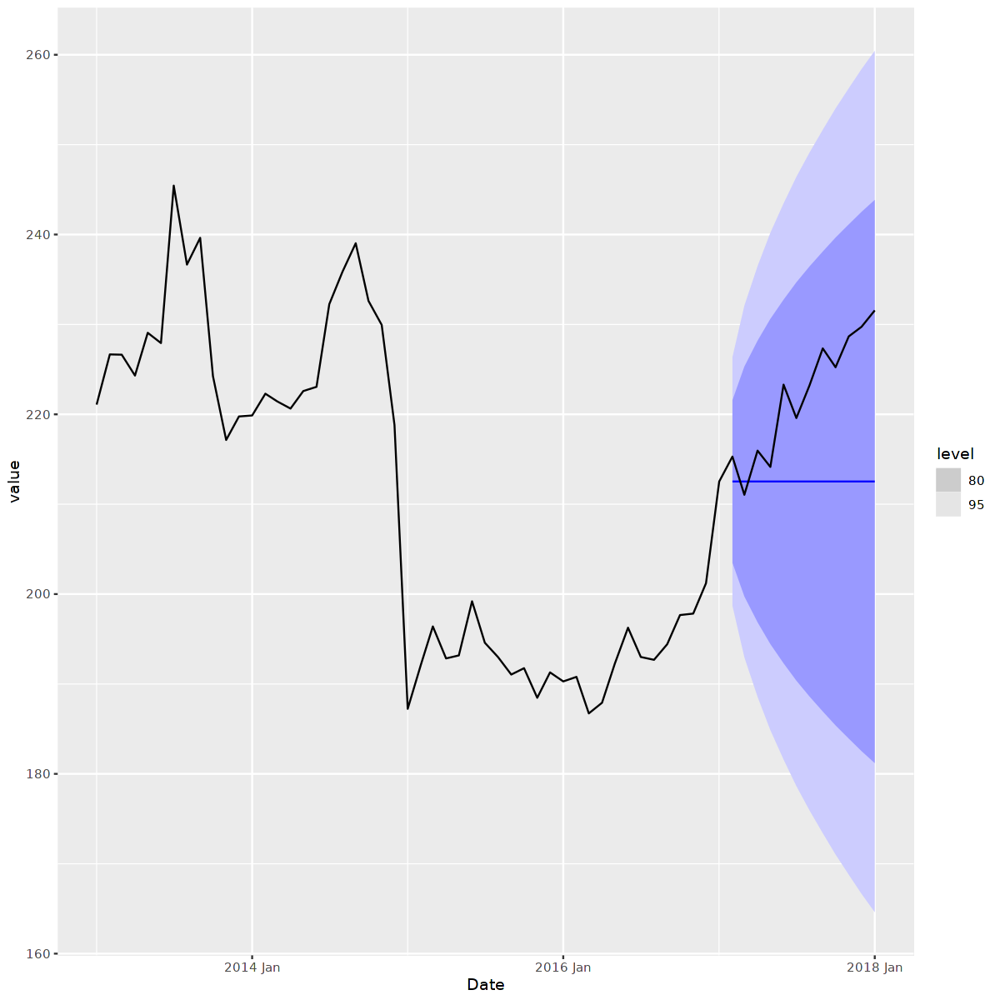

In [43]:
#Comparison between test set and forecast + accuracies -> we will compare RMSE of the two time
#series with the forecast using the ARIMA model from the temperature data

fc_ts_Potatoes %>%
    autoplot(ts_Potatoes_test)

fc_ts_Onions %>%
    autoplot(ts_Onions_test)

fc_ts_Rice %>%
    autoplot(ts_Rice_test)


fc_ts_Potatoes %>%
    fabletools::accuracy(tsibble_Potatoes_test)

fc_ts_Onions %>%
    fabletools::accuracy(tsibble_Onions_test)

fc_ts_Rice %>%
    fabletools::accuracy(tsibble_Rice_test)

fitted_arima_model_Potatoes
<model>
"<ARIMA(0,0,0)(1,1,0)[12]>"


fitted_arima_model_Onions
<model>
"<ARIMA(0,0,0)(0,1,1)[12]>"


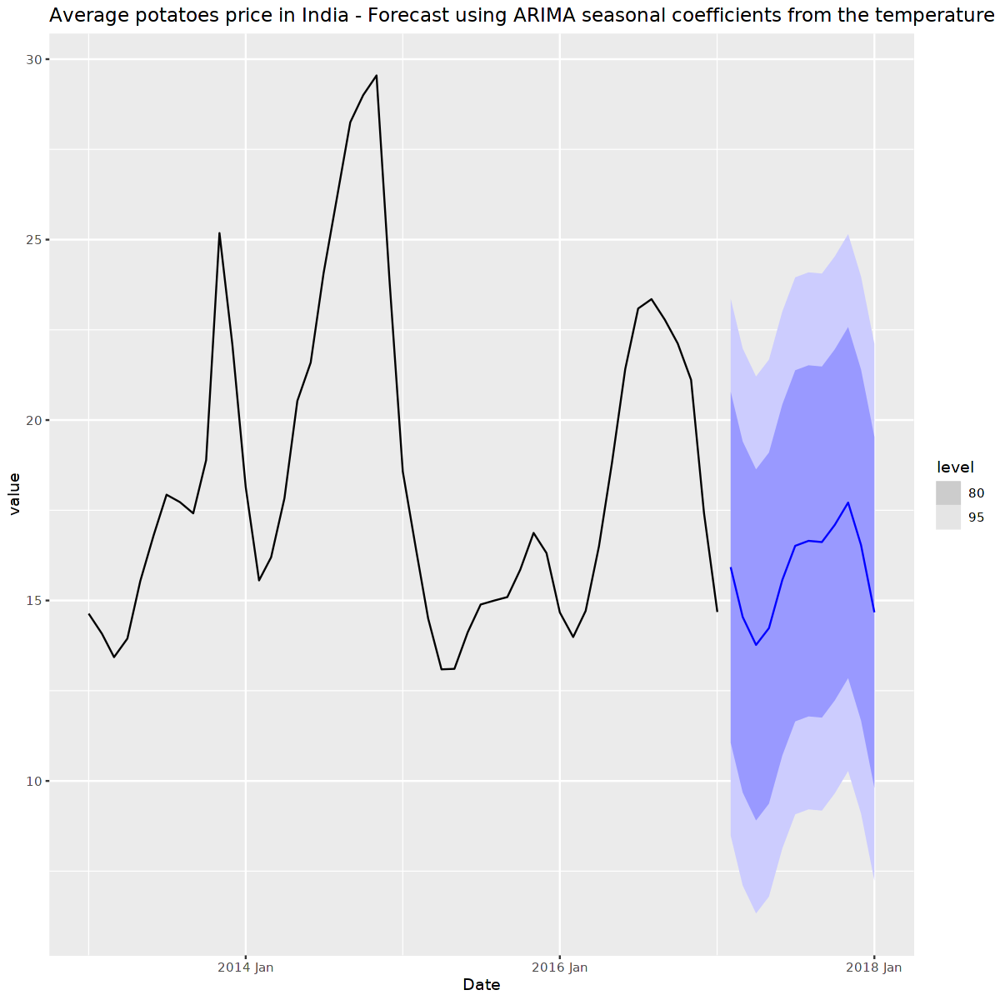

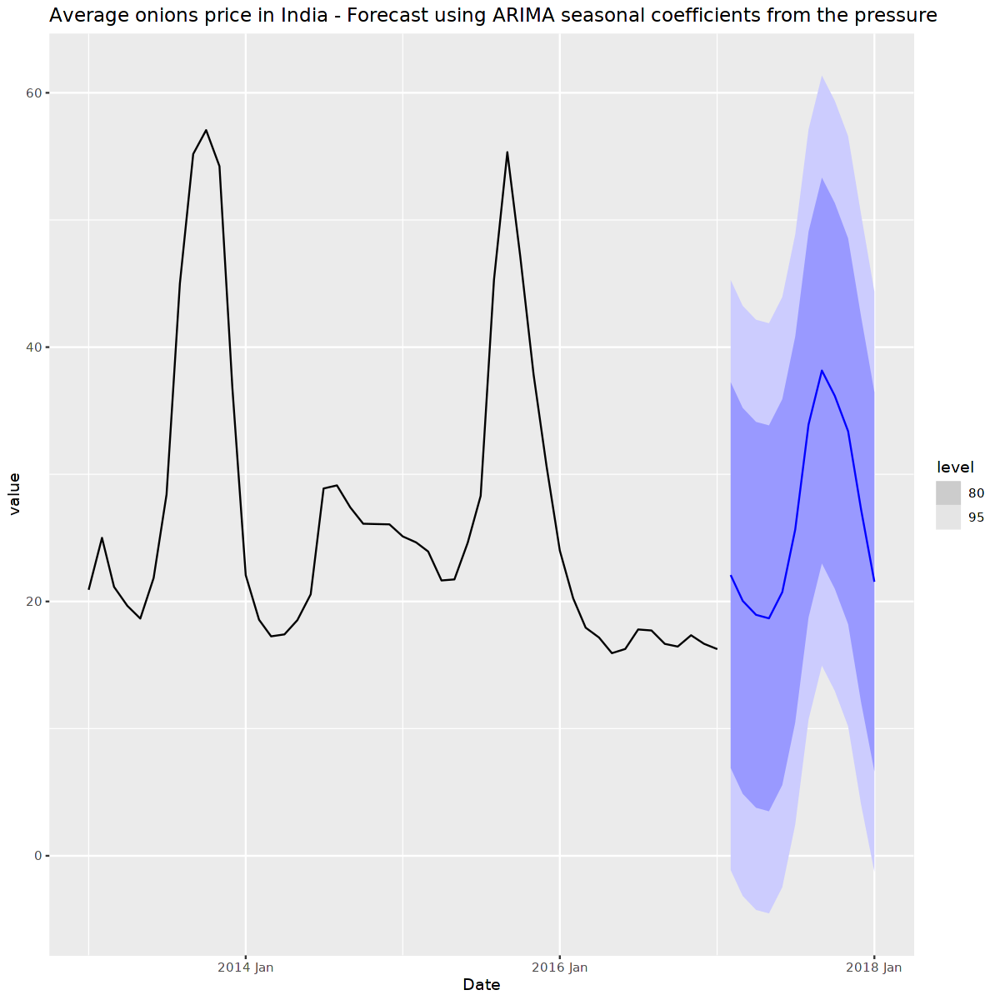

fitted_arima_model_Potatoes
<model>
"<ARIMA(0,0,0)(1,1,0)[12]>"


fitted_arima_model_Onions
<model>
"<ARIMA(0,0,0)(0,1,1)[12]>"


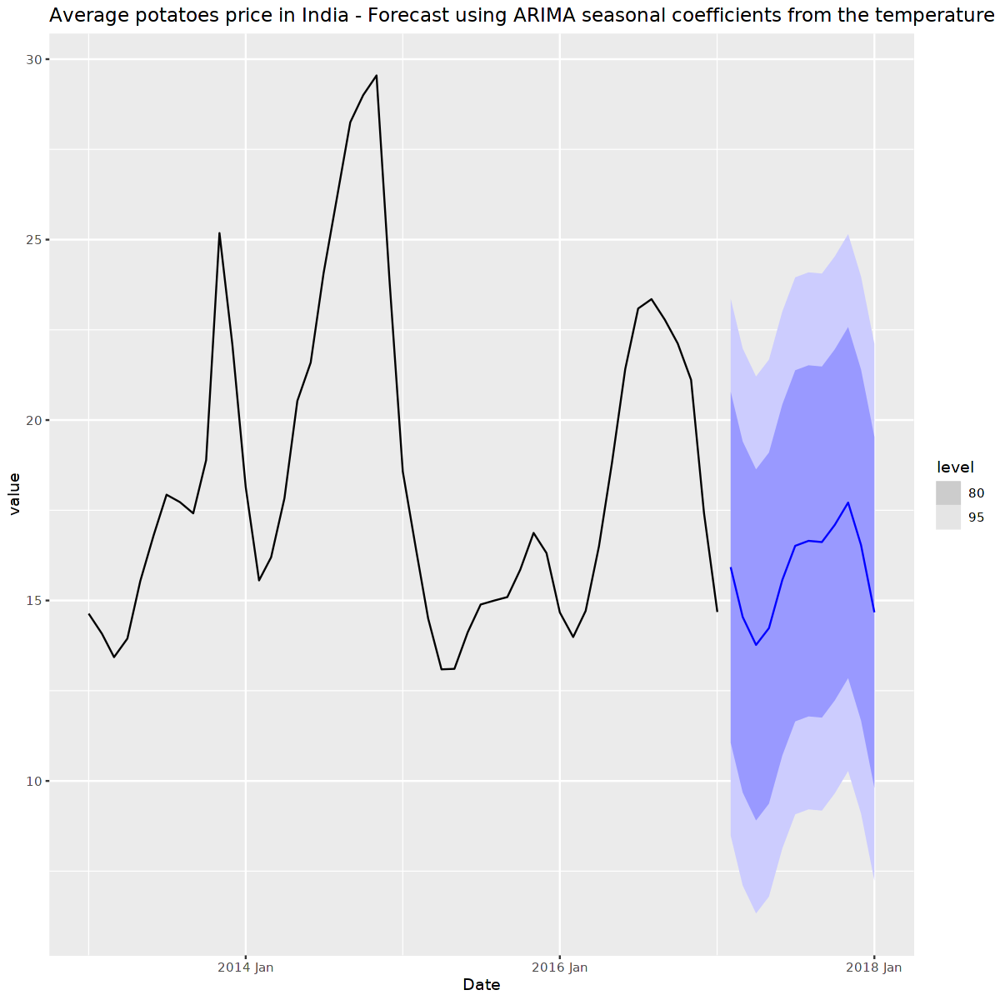

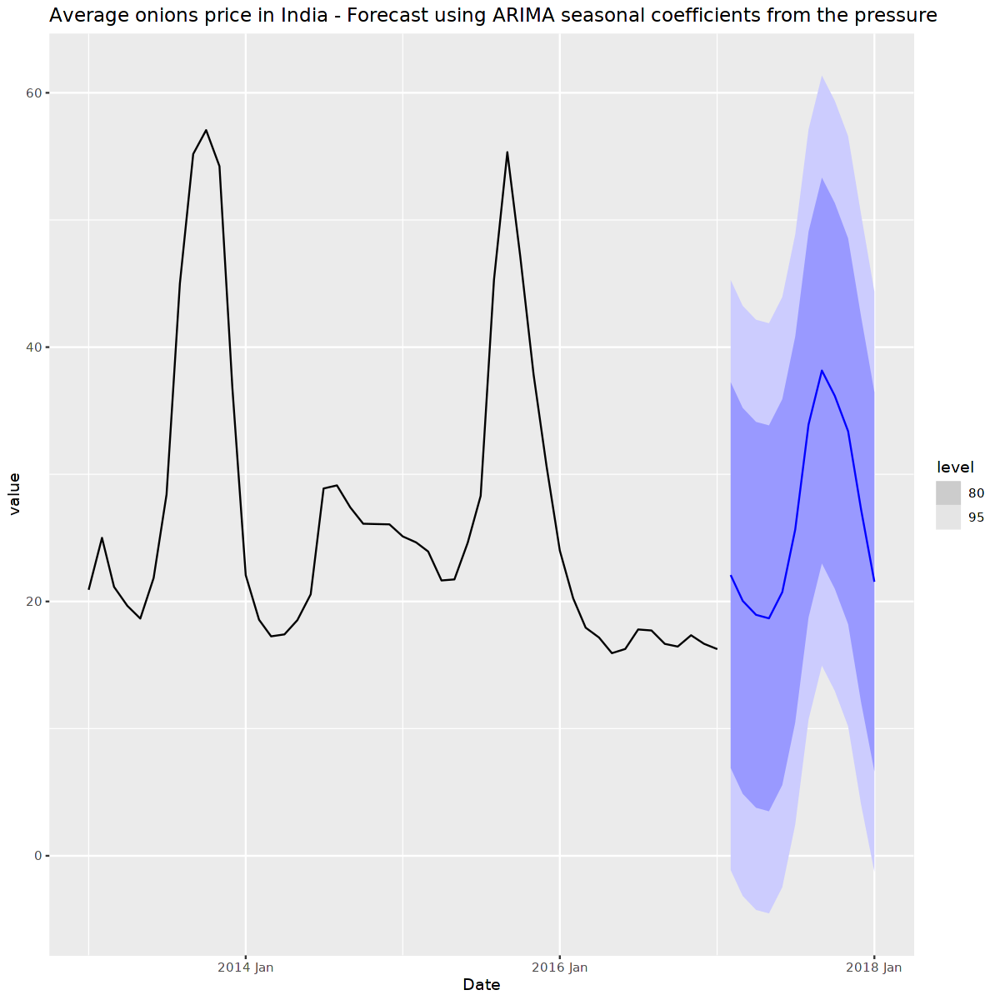

In [44]:
#ARIMA fitting using as ARIMA coefficients for the potatoes the ones from the temperature ARIMA
#fit: (0,0,0)(1,1,0) and as coefficients for the Onions fit the ones from the atmospheric
#pressure ARIMA fit: (0,0,0)(0,1,1)

fit_ts_Potatoes <- tsibble_Potatoes %>%
  model(fitted_arima_model_Potatoes = ARIMA(value ~ 0 + pdq(p=0, d=0, q=0) + PDQ(P=1, D=1, Q=0)))

fit_ts_Onions<- tsibble_Onions %>%
  model(fitted_arima_model_Onions = ARIMA(value ~ 0 + pdq(p=0, d=0, q=0) + PDQ(P=0, D=1, Q=1)))

fit_ts_Potatoes

fit_ts_Onions

# Forcasting the time series using the fitted ARIMA model
fc_ts_Potatoes <- fit_ts_Potatoes %>%
  fabletools::forecast(h = 12)

fc_ts_Potatoes %>%
    autoplot(tsibble_Potatoes) + 
    ggtitle('Average potatoes price in India - Forecast using ARIMA seasonal coefficients from the temperature')

# Forcasting the time series using the fitted ARIMA model
fc_ts_Onions <- fit_ts_Onions %>%
  fabletools::forecast(h = 12)

fc_ts_Onions %>%
    autoplot(tsibble_Onions) + 
    ggtitle('Average onions price in India - Forecast using ARIMA seasonal coefficients from the pressure')

Using `Date` as index variable.
Using `Date` as index variable.


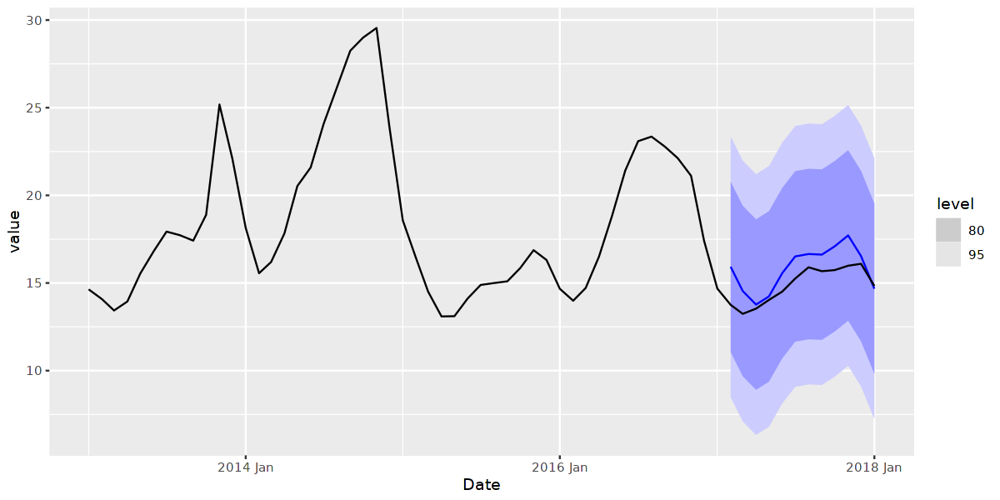

.model,.type,ME,RMSE,MAE,MPE,MAPE,MASE,RMSSE,ACF1
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
fitted_arima_model_Potatoes,Test,-0.9417113,1.145028,0.9677027,-6.354587,6.529871,0.1693308,0.1679719,0.2145277


.model,.type,ME,RMSE,MAE,MPE,MAPE,MASE,RMSSE,ACF1
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
fitted_arima_model_Onions,Test,-0.6923627,10.15639,8.522917,-15.45419,33.4052,0.7538553,0.6549341,0.6313942


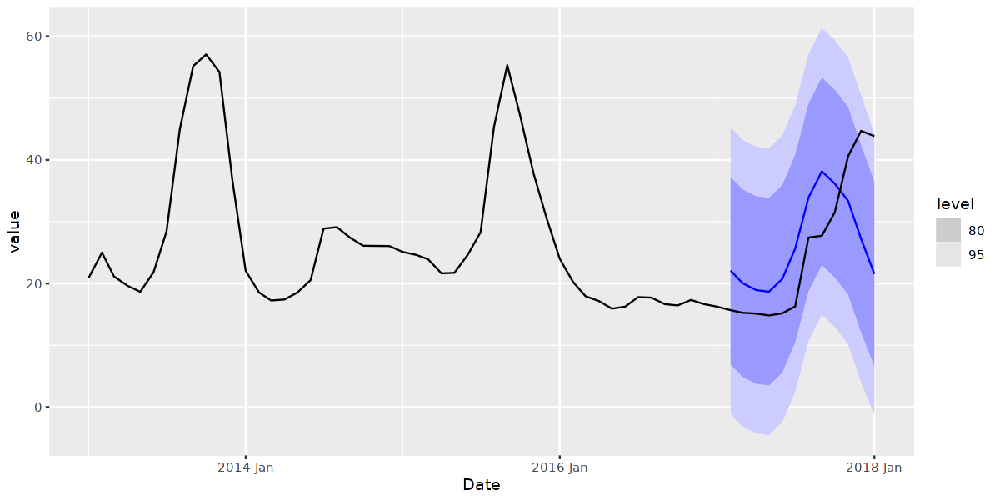

Using `Date` as index variable.
Using `Date` as index variable.


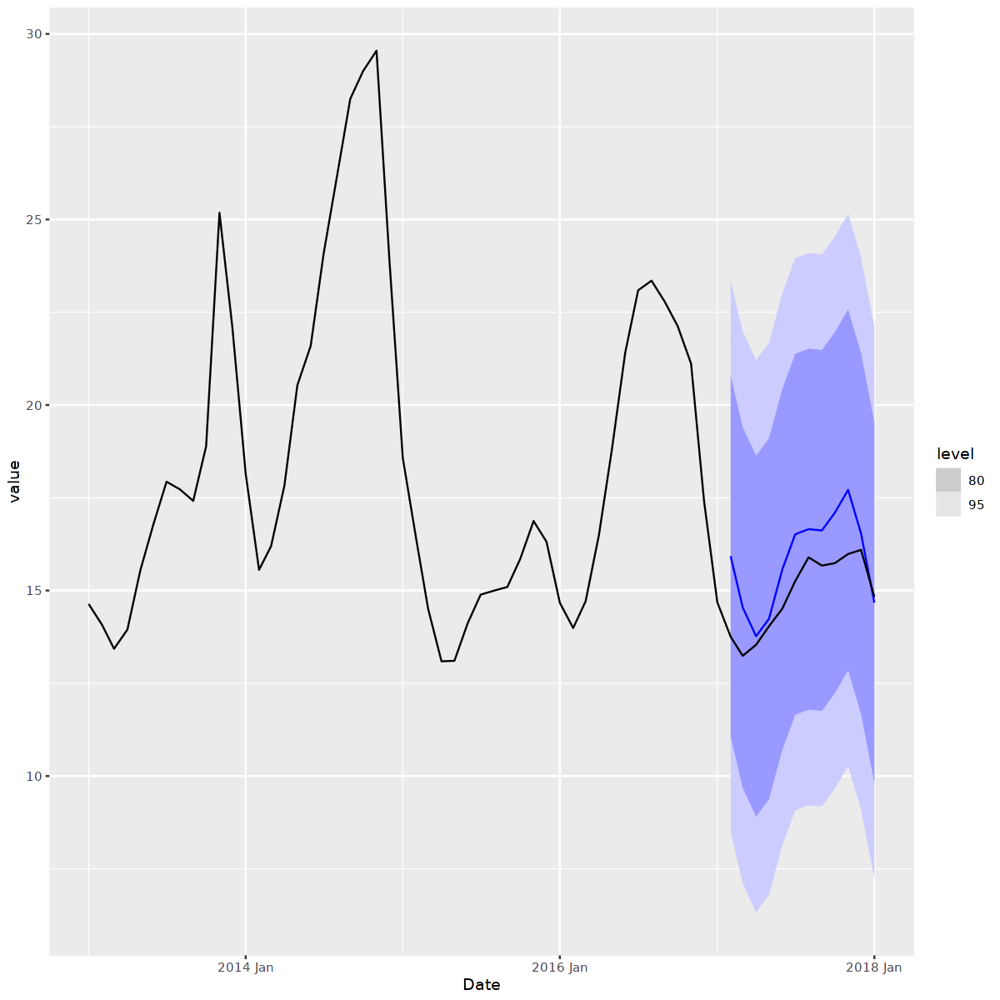

.model,.type,ME,RMSE,MAE,MPE,MAPE,MASE,RMSSE,ACF1
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
fitted_arima_model_Potatoes,Test,-0.9417113,1.145028,0.9677027,-6.354587,6.529871,0.1693308,0.1679719,0.2145277


.model,.type,ME,RMSE,MAE,MPE,MAPE,MASE,RMSSE,ACF1
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
fitted_arima_model_Onions,Test,-0.6923627,10.15639,8.522917,-15.45419,33.4052,0.7538553,0.6549341,0.6313942


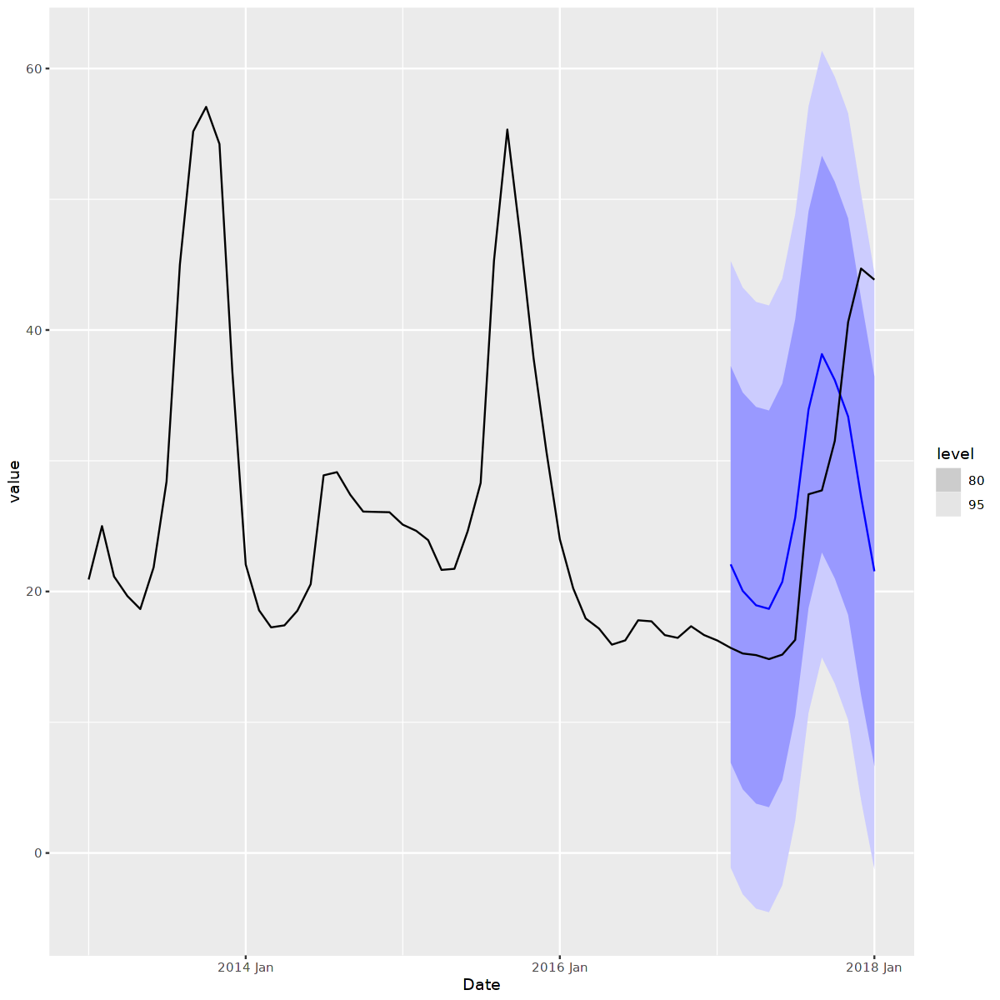

In [45]:
#Comparison between test set and forecast + accuracies -> comparing these RMSE with the ones of
#the previous fit we notice that we have an improvmenet. We managed to improve the accuracy of the
#fit by using the seasonal ARIMA coefficients from the weather analysis in Delhi

fc_ts_Potatoes %>%
    autoplot(ts_Potatoes_test)

fc_ts_Onions %>%
    autoplot(ts_Onions_test)

fc_ts_Potatoes %>%
    fabletools::accuracy(tsibble_Potatoes_test)

fc_ts_Onions %>%
    fabletools::accuracy(tsibble_Onions_test)

In [46]:
head(df_india)

date,Chickpeas,Oil..mustard.,Potatoes,Rice,Sugar,Wheat,Onions
<yearmon>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Jan 2013,69.3225,104.7230,14.63646,221.0802,174.8686,198.3005,20.91688
Feb 2013,63.9750,104.7498,14.07729,226.6646,173.8828,204.6400,25.00250
Mar 2013,60.9425,103.8968,13.43064,226.6332,173.3722,210.2631,21.14766
Apr 2013,58.2200,102.2275,13.94596,224.3121,169.7469,206.5352,19.65319
May 2013,55.4950,100.5941,15.54043,229.0694,170.1296,204.8364,18.65723
Jun 2013,53.7750,99.5600,16.80625,227.9257,167.1402,206.6898,21.84646


date,Chickpeas,Oil..mustard.,Potatoes,Rice,Sugar,Wheat,Onions
<yearmon>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Jan 2013,69.3225,104.7230,14.63646,221.0802,174.8686,198.3005,20.91688
Feb 2013,63.9750,104.7498,14.07729,226.6646,173.8828,204.6400,25.00250
Mar 2013,60.9425,103.8968,13.43064,226.6332,173.3722,210.2631,21.14766
Apr 2013,58.2200,102.2275,13.94596,224.3121,169.7469,206.5352,19.65319
May 2013,55.4950,100.5941,15.54043,229.0694,170.1296,204.8364,18.65723
Jun 2013,53.7750,99.5600,16.80625,227.9257,167.1402,206.6898,21.84646


In [47]:
tail(df_12)

yearMon,date,meantemp,humidity,wind_speed,meanpressure
<yearmon>,<date>,<dbl>,<dbl>,<dbl>,<dbl>
Aug 2016,2016-08-01,31.74682,67.19318,7.175488,1001.135
Sep 2016,2016-09-01,30.96684,65.76455,6.818468,1003.487
Oct 2016,2016-10-01,29.18129,60.56389,6.478595,1007.216
Nov 2016,2016-11-01,25.15719,59.52371,5.810417,1011.393
Dec 2016,2016-12-01,20.51658,62.31885,5.470342,1014.815
Jan 2017,2017-01-01,15.18914,66.27394,5.131355,1018.492


yearMon,date,meantemp,humidity,wind_speed,meanpressure
<yearmon>,<date>,<dbl>,<dbl>,<dbl>,<dbl>
Aug 2016,2016-08-01,31.74682,67.19318,7.175488,1001.135
Sep 2016,2016-09-01,30.96684,65.76455,6.818468,1003.487
Oct 2016,2016-10-01,29.18129,60.56389,6.478595,1007.216
Nov 2016,2016-11-01,25.15719,59.52371,5.810417,1011.393
Dec 2016,2016-12-01,20.51658,62.31885,5.470342,1014.815
Jan 2017,2017-01-01,15.18914,66.27394,5.131355,1018.492


In [48]:
temperature = df_12$meantemp
humidity = df_12$humidity
wind_speed = df_12$wind_speed
pressure = df_12$meanpressure

potatoes <- df_india$Potatoes
onions <- df_india$Onions
rice <- df_india$Rice

date <- df_india$date

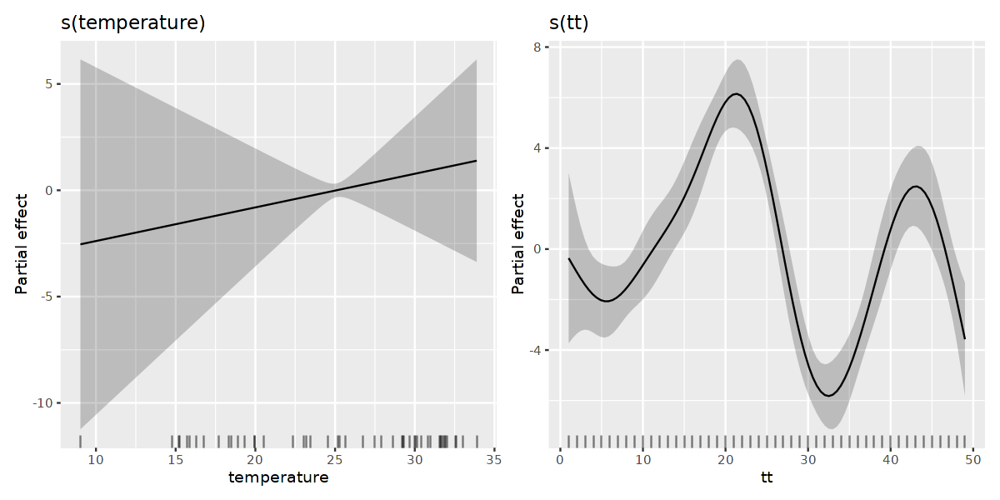

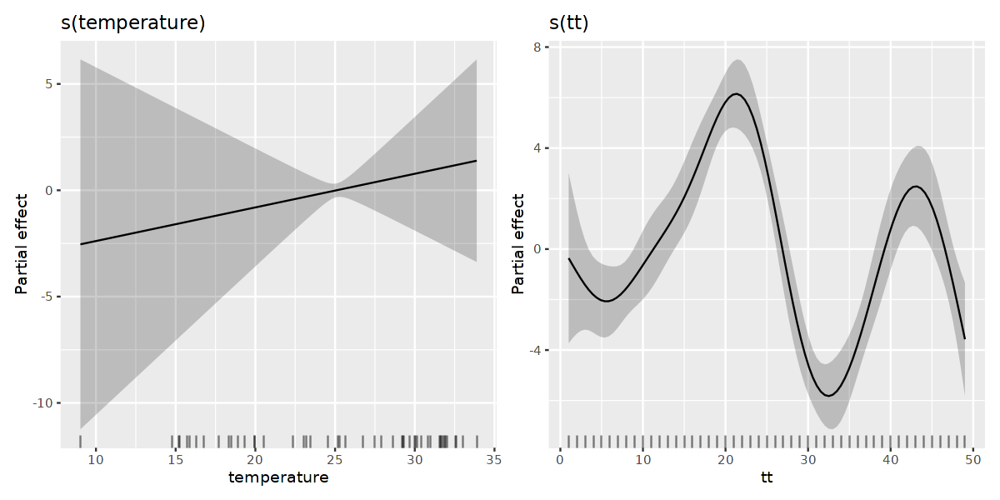

In [49]:
# Plotting options for the notebook - QUESTO
options(repr.plot.width=10, repr.plot.height=5)

tt <- 1:length(potatoes)
seasonality <- factor(c(rep(1:12,length(potatoes)/12),1)) 

gam.fitted.potatoes <- gamm(potatoes~seasonality+s(tt)+
                                     s(temperature)#+
                                     #s(humidity)+
                                     #s(wind_speed)+
                                     #s(pressure)+
                                     #s(onions)+
                                     #s(rice)
                                     )
print(draw(gam.fitted.potatoes))

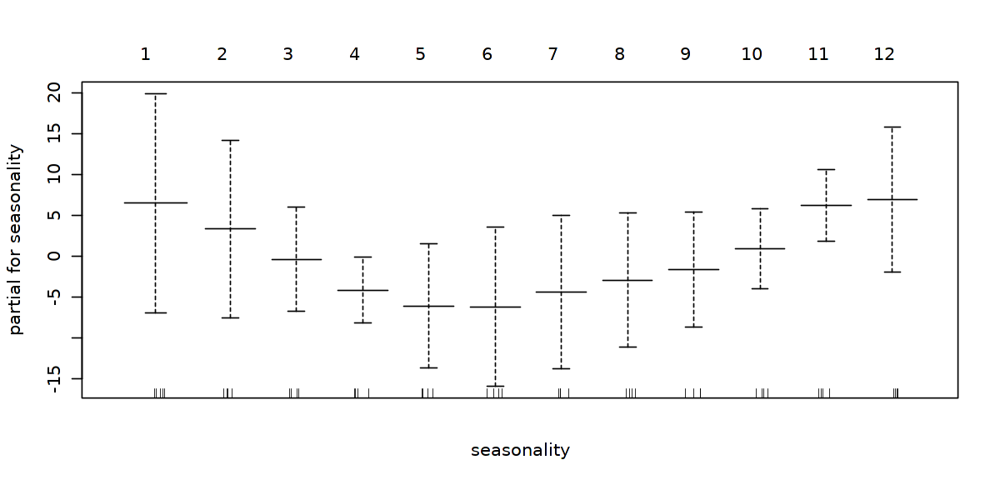

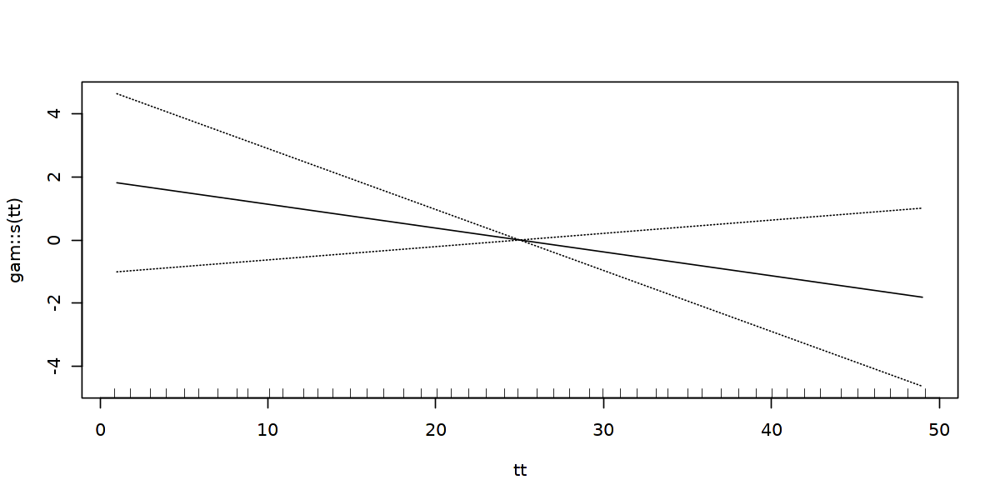

Call:
gam::gam(formula = potatoes ~ seasonality + gam::s(tt) + gam::s(temperature))

Degrees of Freedom: 48 total; 35 Residual
Residual Deviance: 542.25 


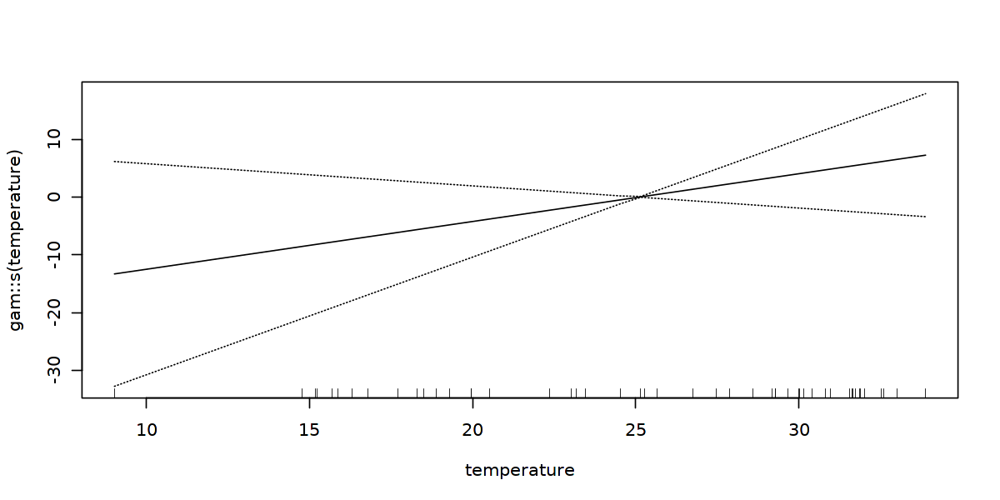

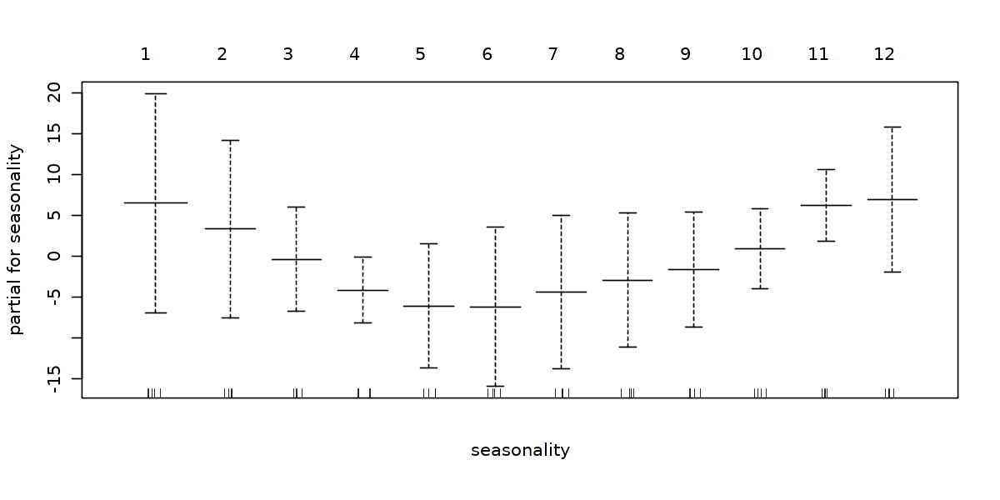

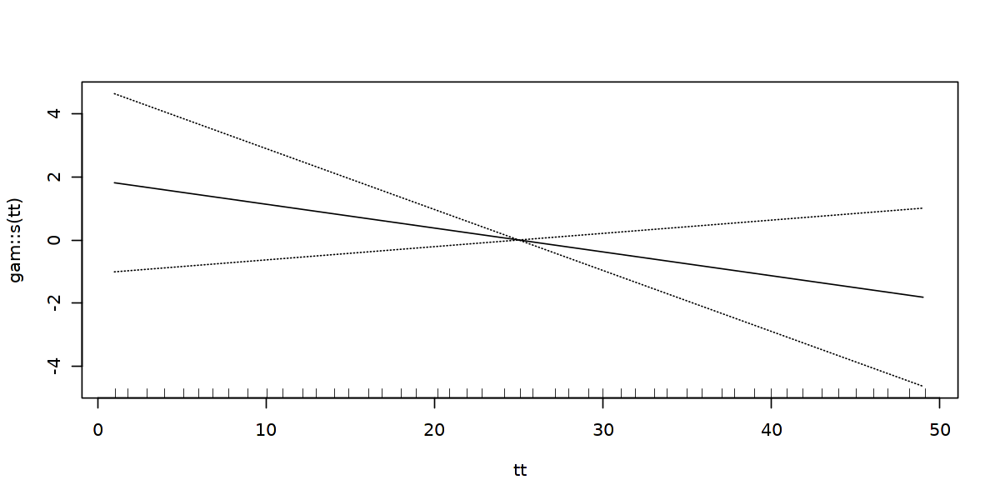

Call:
gam::gam(formula = potatoes ~ seasonality + gam::s(tt) + gam::s(temperature))

Degrees of Freedom: 48 total; 35 Residual
Residual Deviance: 542.25 


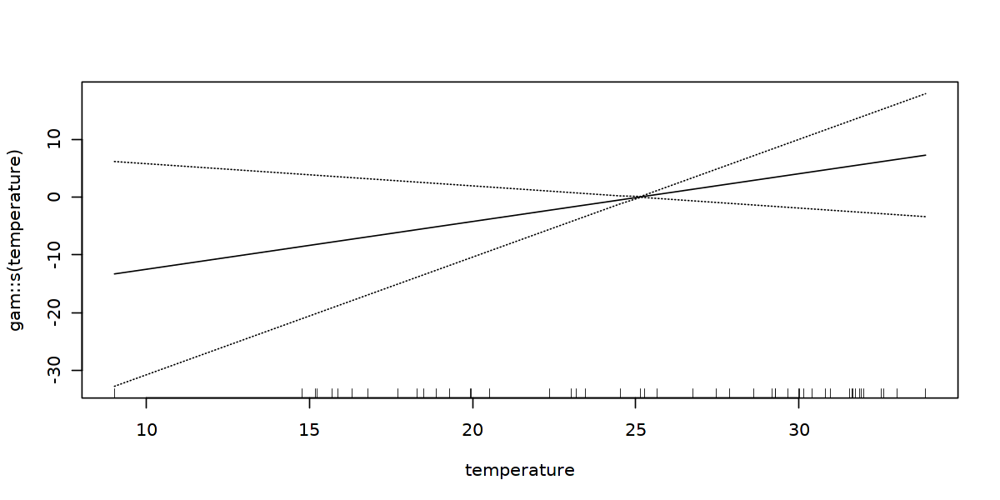

In [50]:
# Plotting options for the notebook
options(repr.plot.width=10, repr.plot.height=5)

tt <- 1:length(potatoes)
seasonality <- factor(c(rep(1:12,length(potatoes)/12),1)) 

gam.fitted.potatoes <- gam::gam(potatoes~seasonality+gam::s(tt)+
                                     gam::s(temperature)#+
                                     #s(humidity)+
                                     #s(wind_speed)+
                                     #s(pressure)+
                                     #s(onions)+
                                     #s(rice)
                                     )
print(plot(gam.fitted.potatoes, se=T))

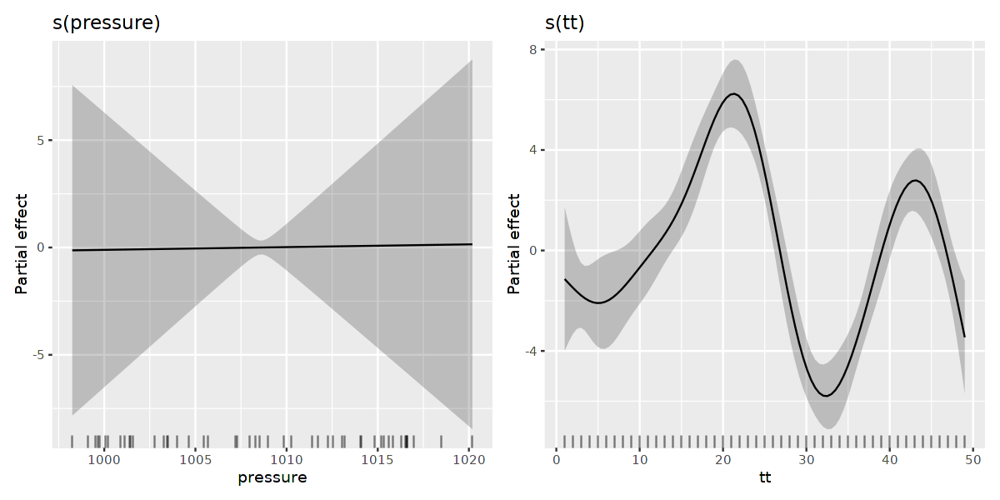

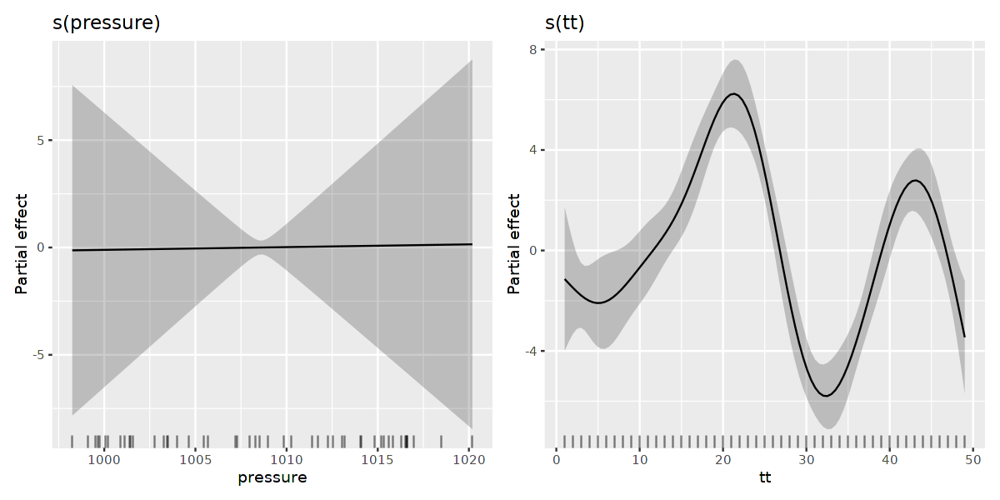

In [51]:
# Plotting options for the notebook
options(repr.plot.width=10, repr.plot.height=5)

tt <- 1:length(potatoes)
seasonality <- factor(c(rep(1:12,length(potatoes)/12),1)) 

gam.fitted.potatoes <- gamm(potatoes~seasonality+s(tt)+
                                     #s(temperature)#+
                                     #s(humidity)+
                                     #s(wind_speed)+
                                     s(pressure)#+
                                     #s(onions)+
                                     #s(rice)
                                     )
print(draw(gam.fitted.potatoes))

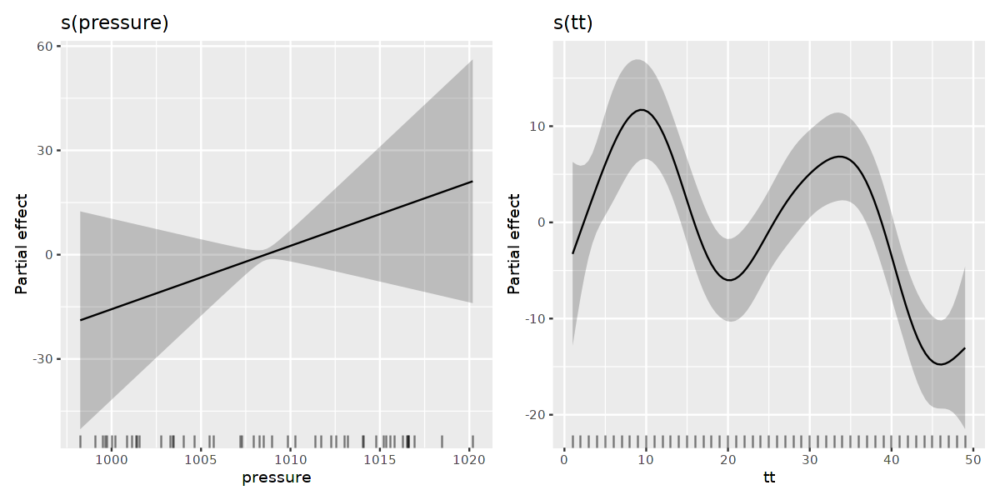

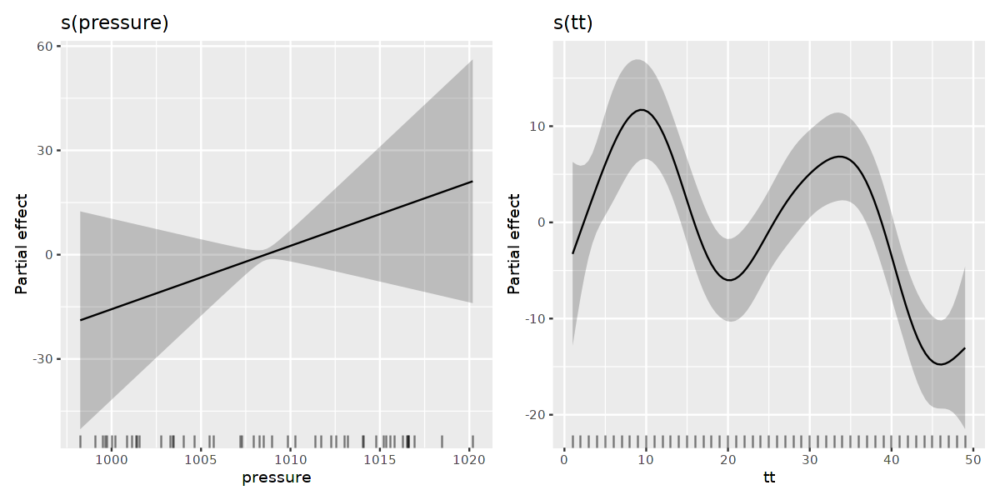

In [52]:
# Plotting options for the notebook - QUESTO
options(repr.plot.width=10, repr.plot.height=5)

tt <- 1:length(potatoes)
seasonality <- factor(c(rep(1:12,length(potatoes)/12),1)) 

gam.fitted.onions <- gamm(onions~seasonality+s(tt)+
                                     #s(temperature)+
                                     #s(humidity)+
                                     #s(wind_speed)+
                                     s(pressure)#+
                                     #s(potatoes)+
                                     #s(rice)
                                     )
print(draw(gam.fitted.onions))

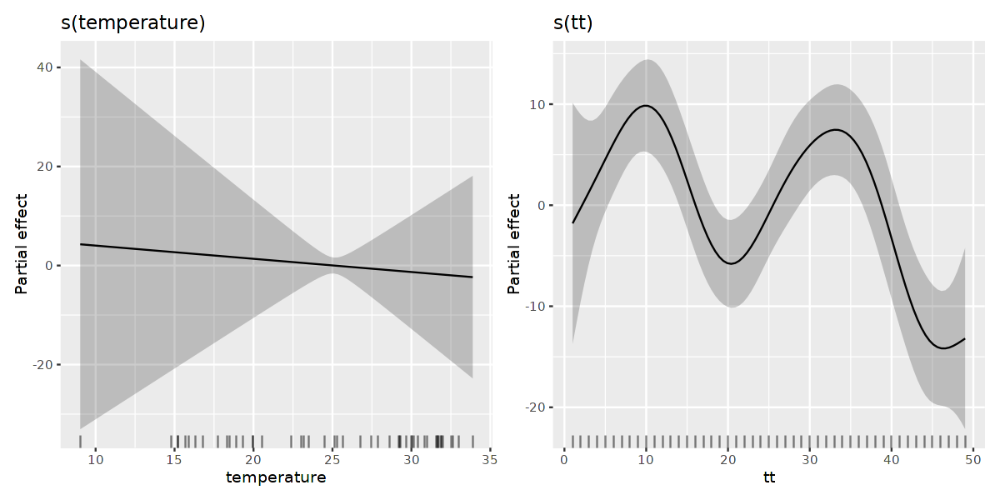

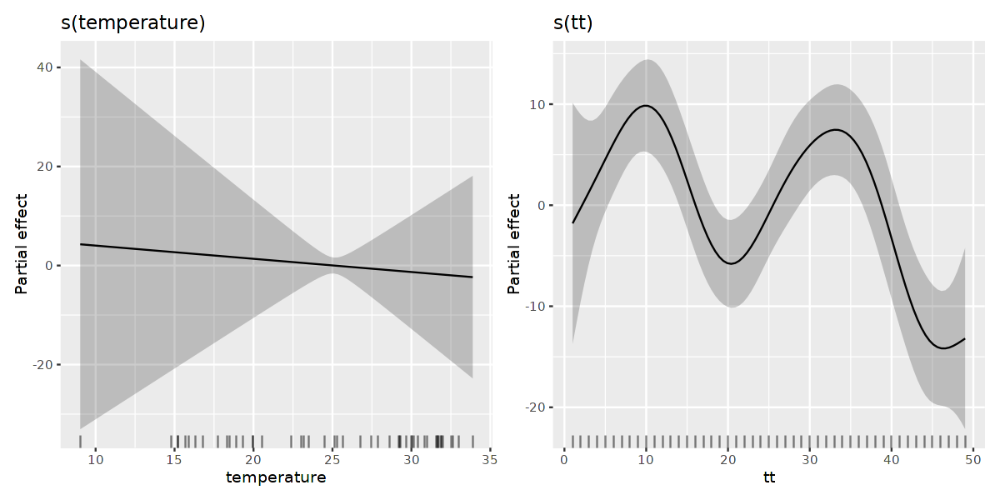

In [53]:
# Plotting options for the notebook
options(repr.plot.width=10, repr.plot.height=5)

tt <- 1:length(potatoes)
seasonality <- factor(c(rep(1:12,length(potatoes)/12),1)) 

gam.fitted.onions <- gamm(onions~seasonality+s(tt)+
                                     s(temperature)#+
                                     #s(humidity)+
                                     #s(wind_speed)+
                                     #s(pressure)#+
                                     #s(potatoes)+
                                     #s(rice)
                                     )
print(draw(gam.fitted.onions))

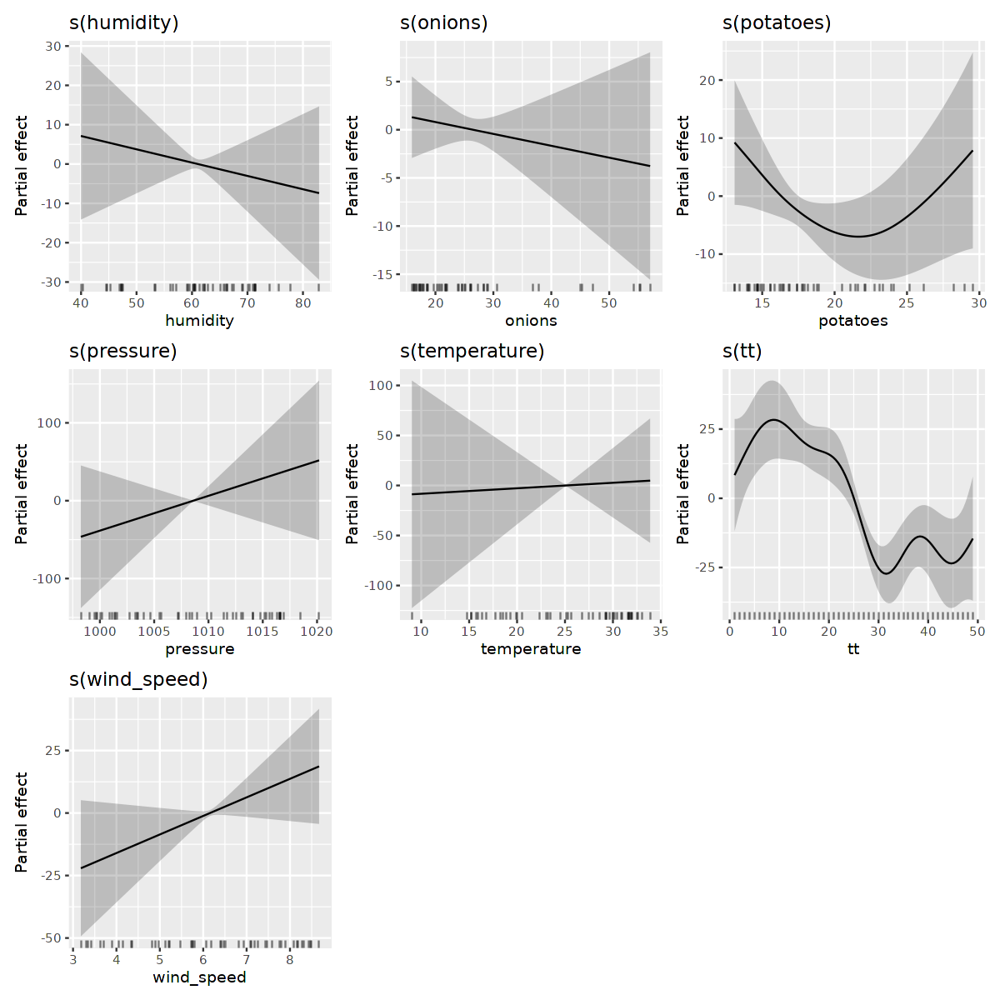

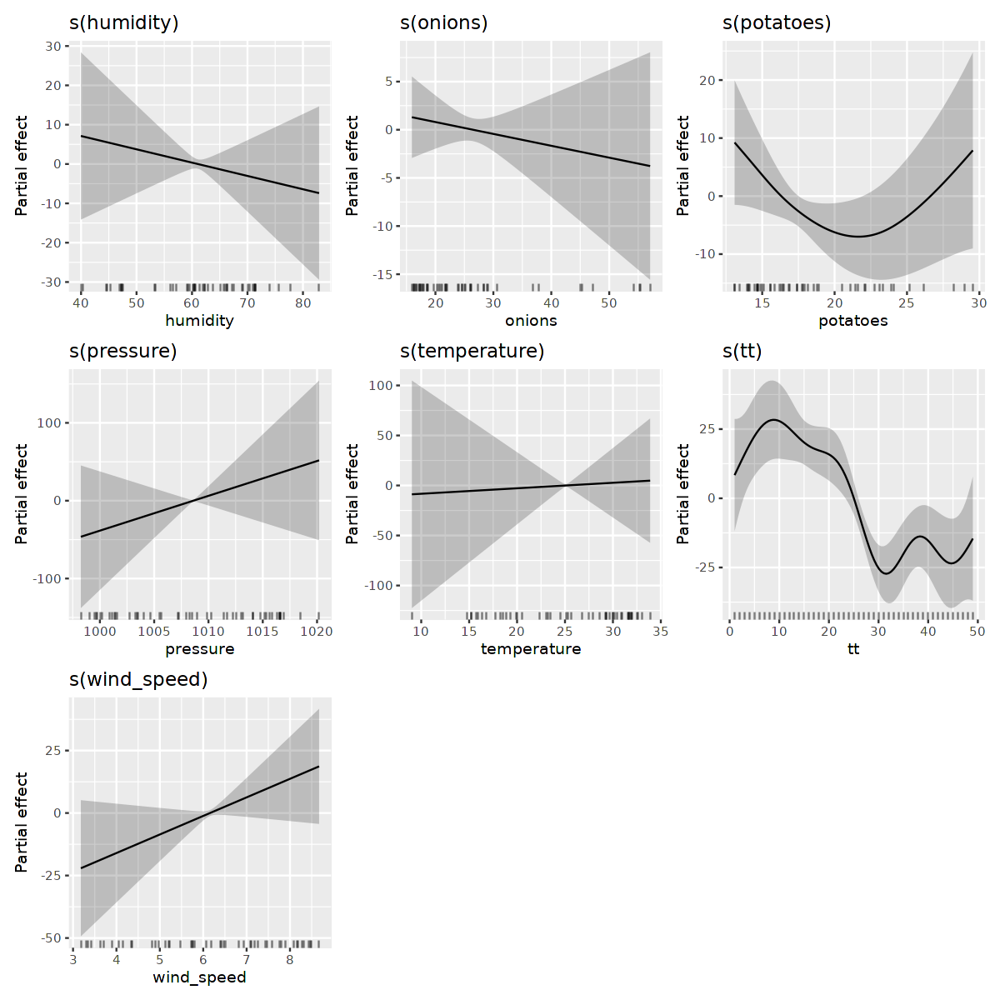

In [54]:
# Plotting options for the notebook
options(repr.plot.width=10, repr.plot.height=10)

tt <- 1:length(potatoes)
seasonality <- factor(c(rep(1:12,length(potatoes)/12),1)) 

gam.fitted.rice <- gamm(rice~seasonality+s(tt)+
                                     s(temperature)+
                                     s(humidity)+
                                     s(wind_speed)+
                                     s(pressure)+
                                     s(onions)+
                                     s(potatoes))
print(draw(gam.fitted.rice))

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=74b70e33-4e05-40e8-88b0-215b255c9984' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>